# Experimento02: Deep Convolutional Networks

## Librerías

In [11]:
# Librerias necesarias
import os

# Matplotlib conf
import matplotlib.pyplot as plt
%matplotlib inline
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (15, 5),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':40,
         'ytick.labelsize': 40
}
plt.rcParams.update(params)
# Seaborn conf
import seaborn as sns
sns.set(style='darkgrid')
sns.set_palette(sns.color_palette("Blues"))

import sys

#Procesado de datos
import pandas as pd
import numpy as np
import operator

#Modelos
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

import warnings
warnings.filterwarnings('ignore')


from sklearn.decomposition import TruncatedSVD
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences

from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score
from sklearn.metrics import confusion_matrix

from sklearn import preprocessing
from nltk import ngrams

from keras.layers import Dense, Embedding, Flatten, GlobalMaxPool1D, Dropout
from keras.models import Sequential, Model
from tensorflow.keras.layers import Input
from keras.preprocessing.sequence import pad_sequences

from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from keras.callbacks import EarlyStopping

from tensorflow.keras import regularizers

from keras.initializers import Constant

from wordcloud import WordCloud

from sklearn.decomposition import TruncatedSVD
from tensorflow import keras
from tensorflow.keras import layers
from keras.utils import plot_model
import tensorflow as tf

from sklearn import preprocessing
from nltk import ngrams

## Carga de conjunto de datos

In [12]:
df_training = pd.read_csv("./data/ds_training_processed.csv")
df_testing = pd.read_csv("./data/ds_testing_processed.csv")

X_train = df_training["text"]
y_train = df_training["sentiment"]
X_test = df_testing["text"]
y_test = df_testing["sentiment"]

y_train_2 = to_categorical(y_train, num_classes=2)
y_test_2 = to_categorical(y_test, num_classes=2)

## Carga de modelos de representación

In [13]:
def load_representation_model(file_name, include_embedding_matrix=False):
    res = {}
    with open("./repmodels/"+file_name+".txt", 'r') as d:
        res["model"] = d.readline()
    res["train_text_features"] = np.load("./repmodels/"+file_name+"_train.npy")
    res["test_text_features"] = np.load("./repmodels/"+file_name+"_test.npy")

    if include_embedding_matrix:
        res["embedding_matrix"] = np.load("./repmodels/"+file_name+"_embeddingmatrix.npy")

    return res

vsm_binary = load_representation_model("vsm_binary")
vsm_binary_ngrams = load_representation_model("vsm_binary_ngrams")
vsm_tfidf = load_representation_model("vsm_tfidf")
vsm_tfidf_ngrams = load_representation_model("vsm_tfidf_ngrams")
embedding_padding = load_representation_model("embedding_padding")
embedding_glove = load_representation_model("embedding_glove", include_embedding_matrix=True)

# Cargo esto por facilidad
vsm_model = []
vsm_model.append(vsm_binary)
vsm_model.append(vsm_binary_ngrams)
vsm_model.append(vsm_tfidf)
vsm_model.append(vsm_tfidf_ngrams)

## Funciones generales

In [15]:
pd.set_option('display.max_colwidth', 2000)
vocab_size = 29773
emb_dim = 50
num_words = 29773

results = []
def add_to_results(classifier, repmodel, predict_x, y_test):
    y_pred = np.argmax(predict_x,axis=1)

    results.append({"classifier": classifier,
                    "rep.model": repmodel,
                    "accuracy": accuracy_score(y_test, y_pred),
                    "precision": precision_score(y_test, y_pred, average="weighted"),
                    "recall": recall_score(y_test,y_pred, average="weighted")
                    })

def plot_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    x = range(1, len(acc) + 1)

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(x, acc, 'bo', label='Training acc')
    plt.plot(x, val_acc, 'r', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.xlabel("Epochs")
    plt.plot(x, loss, 'b', label='Training loss')
    plt.plot(x, val_loss, 'r', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()

def nn_classification_report(predict_x, y_test, class_names):
    y_pred = np.argmax(predict_x,axis=1)

    print("Classification Report")
    print

    print(classification_report(y_true=y_test, y_pred=y_pred, target_names=class_names))
    cm = confusion_matrix(y_true=y_test, y_pred=y_pred)

    plot_confusion_matrix(cm, classes=class_names)

    print("Final Accuracy")
    print(accuracy_score(y_test, y_pred))

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):

    import itertools
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
    plt.figure()
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

def join_csv_for_experiment(experiment_string, number_of_experiements):
    experiments_data = []
    for i in range(1, number_of_experiements+1):
        experiments_data.append( pd.read_csv("exp_"+experiment_string+"_"+str(i)+".csv") )

    res = pd.concat(experiments_data, ignore_index=True)
    res.to_csv("exp_"+experiment_string+".csv")

## Clasificadores

In [18]:
def build_exp02(
        name, 
        description, 
        repmodel, 
        exp="Exp02",
        input_shape=None, 
        embedding=None,
        number_of_filters=[128,128,128],
        kernel_sizes=[4,4,4],
        pooling_size=5,
        batchnorm=False,
        general_dropout=0.0,
        extra_dense_layer_nn=0,
        extra_dense_dropout=0.0
        ):
  
    inputs = keras.Input(shape=input_shape, batch_size=32, dtype="float")
    if embedding:
        x = embedding(inputs)
    else:
        x = inputs
    
    if batchnorm:
        for i in range(len(number_of_filters)):
            x = layers.Conv1D(number_of_filters[i], kernel_sizes[i])(x)
            x = layers.BatchNormalization()(x)
            x = layers.Activation("relu")(x)
            x = layers.MaxPooling1D(pool_size=pooling_size)(x)
    else:
        for i in range(len(number_of_filters)):
            x = layers.Conv1D(number_of_filters[i], kernel_sizes[i], activation="relu")(x)
            x = layers.MaxPooling1D(pool_size=pooling_size)(x)        

    if general_dropout:
        x = layers.Dropout(0.5)(x)

    x = layers.GlobalMaxPooling1D()(x)

    if extra_dense_layer_nn>0:
        x = layers.Dense(extra_dense_layer_nn, activation="relu")(x)
        if extra_dense_dropout>0:
            x = layers.Dropout(extra_dense_dropout)(x)
    
    outputs = layers.Dense(2, activation="softmax")(x)
    model = keras.Model(inputs=inputs, outputs=outputs)
    model._name = exp+name
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    print(model.summary())
    history = model.fit(repmodel["train_text_features"].astype(float), y_train_2, 
                        epochs=40, batch_size=32,validation_split=0.2, 
                        callbacks=[EarlyStopping(monitor='val_loss', mode='min', patience=7, min_delta=0.01)])
    plot_history(history)
    predict_x=model.predict(repmodel["test_text_features"].astype(float))
    nn_classification_report(predict_x, y_test, ["negative","positive"])
    add_to_results(model._name+" "+description, repmodel["model"], predict_x, y_test)



Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(32, 5000, 1)]           0         
                                                                 
 conv1d_10 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 max_pooling1d_9 (MaxPoolin  (32, 999, 128)            0         
 g1D)                                                            
                                                                 
 conv1d_11 (Conv1D)          (32, 996, 128)            65664     
                                                                 
 max_pooling1d_10 (MaxPooli  (32, 199, 128)            0         
 ng1D)                                                           
                                                                 
 conv1d_12 (Conv1D)          (32, 196, 128)            65

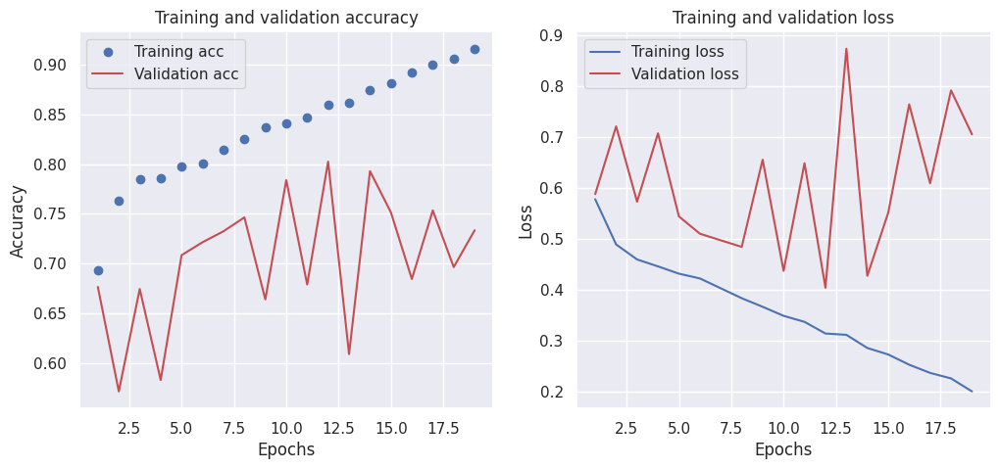

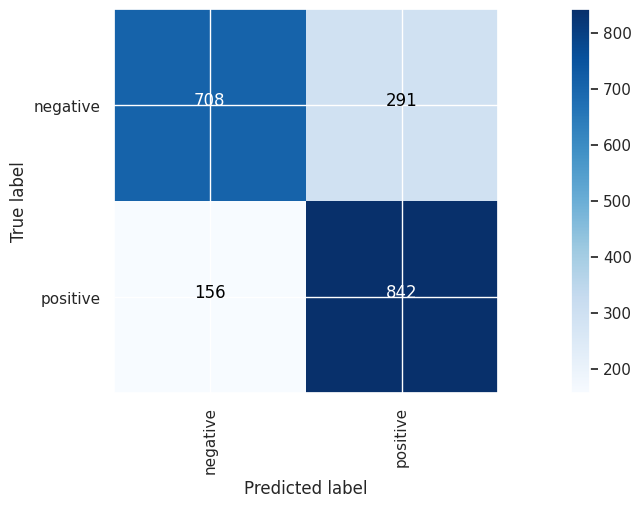

Final Accuracy
0.7761642463695543
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(32, 5000, 1)]           0         
                                                                 
 conv1d_13 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 max_pooling1d_12 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 conv1d_14 (Conv1D)          (32, 996, 128)            65664     
                                                                 
 max_pooling1d_13 (MaxPooli  (32, 199, 128)            0         
 ng1D)                                                           
                                                                 
 conv1d_15 (Conv1D)    

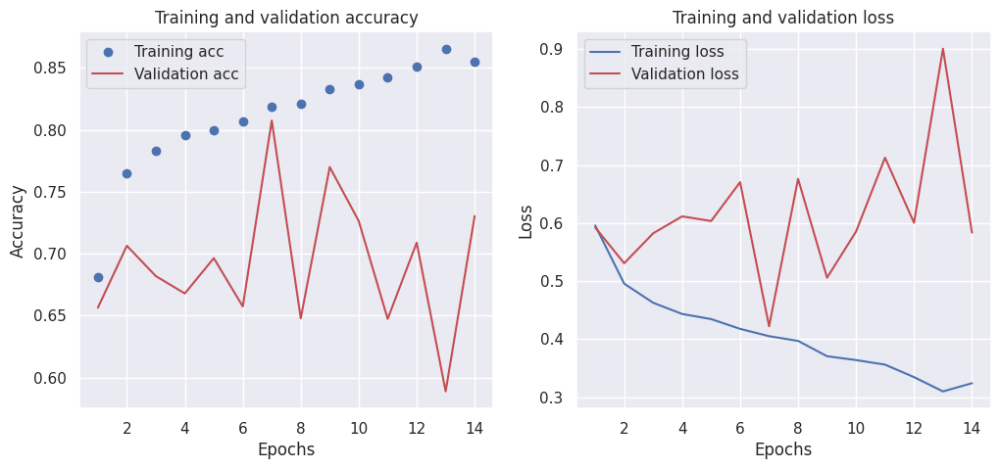

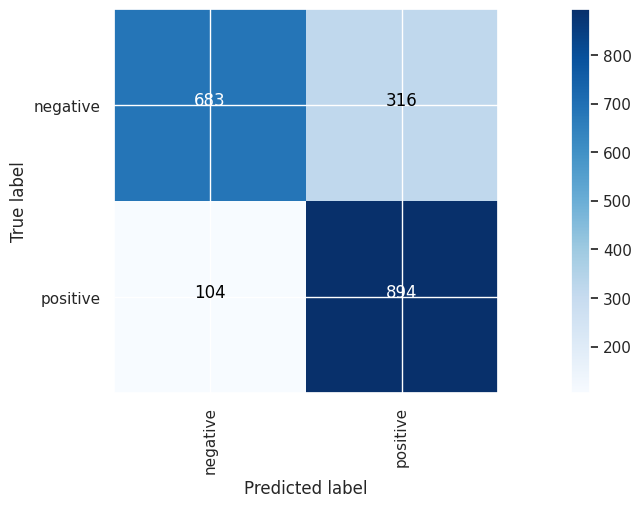

Final Accuracy
0.7896845267901853
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(32, 5000, 1)]           0         
                                                                 
 conv1d_16 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 max_pooling1d_15 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 conv1d_17 (Conv1D)          (32, 996, 128)            65664     
                                                                 
 max_pooling1d_16 (MaxPooli  (32, 199, 128)            0         
 ng1D)                                                           
                                                                 
 conv1d_18 (Conv1D)    

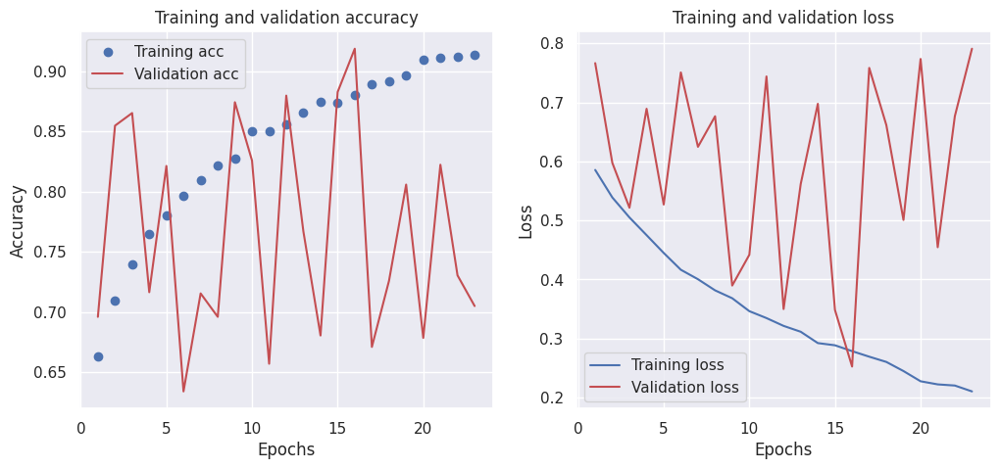

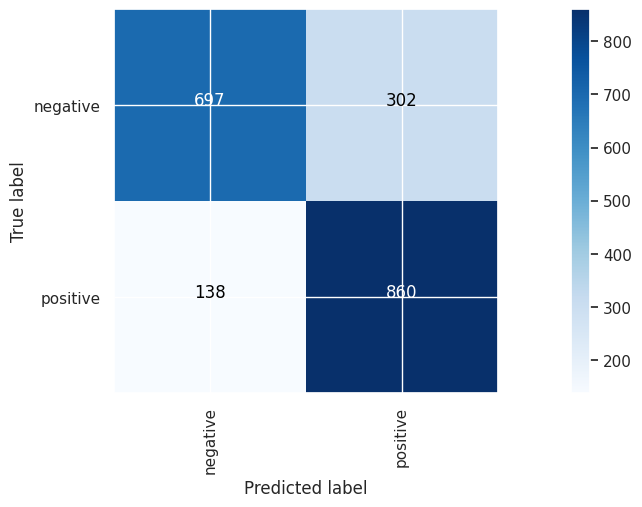

Final Accuracy
0.7796695042563846
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(32, 5000, 1)]           0         
                                                                 
 conv1d_19 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 max_pooling1d_18 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 conv1d_20 (Conv1D)          (32, 996, 128)            65664     
                                                                 
 max_pooling1d_19 (MaxPooli  (32, 199, 128)            0         
 ng1D)                                                           
                                                                 
 conv1d_21 (Conv1D)    

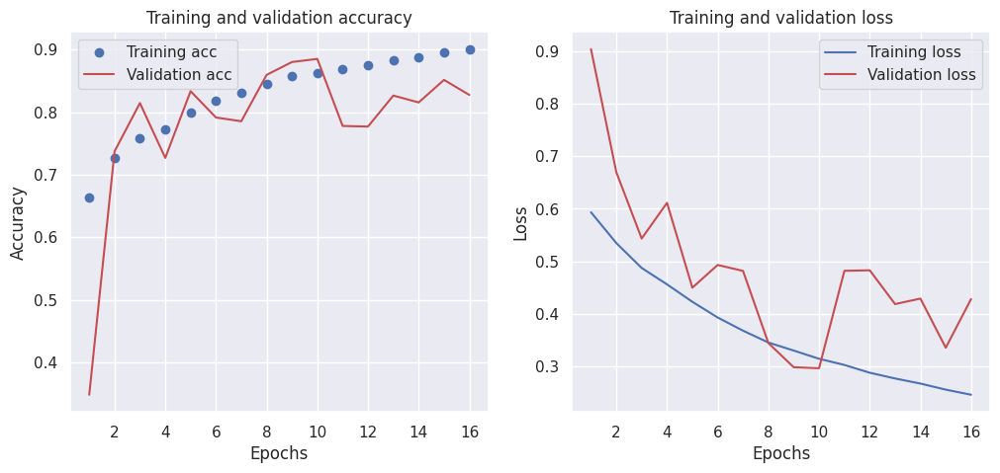

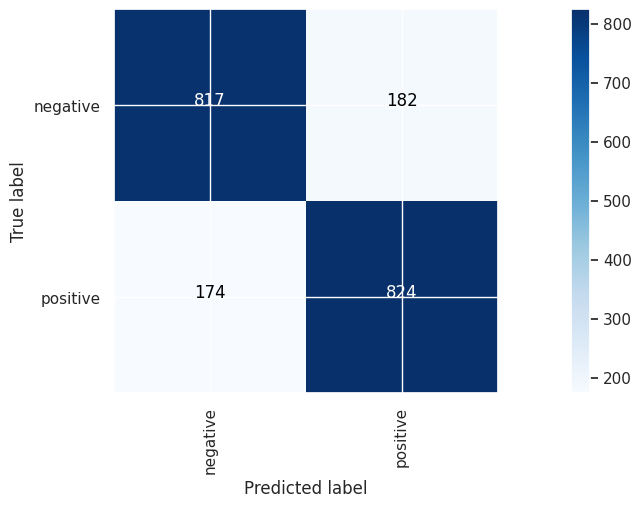

Final Accuracy
0.8217325988983475
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(32, 600)]               0         
                                                                 
 embedding (Embedding)       (32, 600, 50)             1488650   
                                                                 
 conv1d_22 (Conv1D)          (32, 597, 128)            25728     
                                                                 
 max_pooling1d_21 (MaxPooli  (32, 119, 128)            0         
 ng1D)                                                           
                                                                 
 conv1d_23 (Conv1D)          (32, 116, 128)            65664     
                                                                 
 max_pooling1d_22 (MaxPooli  (32, 23, 128)             0         
 ng1D)                 

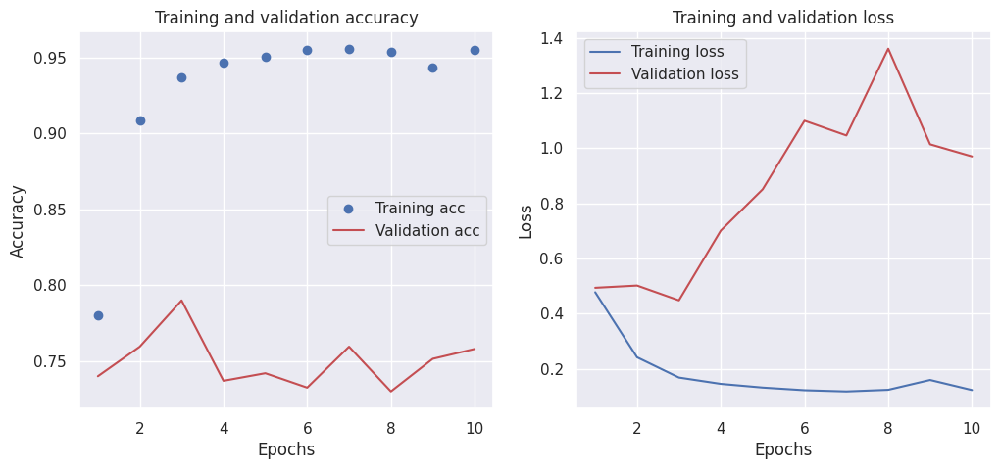

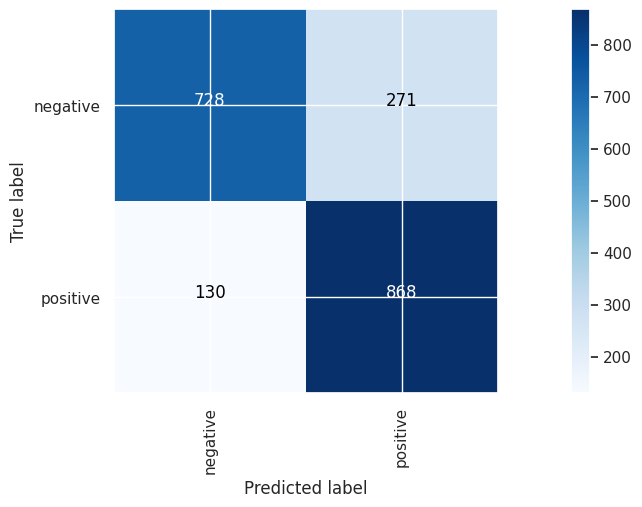

Final Accuracy
0.7991987981972959
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_1 (Embedding)     (32, 600, 50)             1488650   
                                                                 
 conv1d_25 (Conv1D)          (32, 597, 128)            25728     
                                                                 
 max_pooling1d_24 (MaxPooli  (32, 119, 128)            0         
 ng1D)                                                           
                                                                 
 conv1d_26 (Conv1D)          (32, 116, 128)            65664     
                                                                 
 max_pooling1d_25 (MaxPooli  (32, 23, 128)             0         
 ng1D)                 

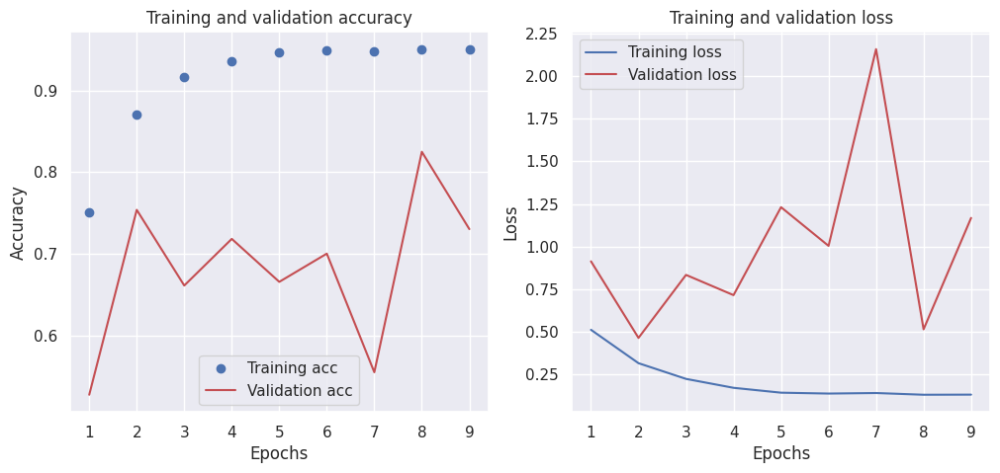

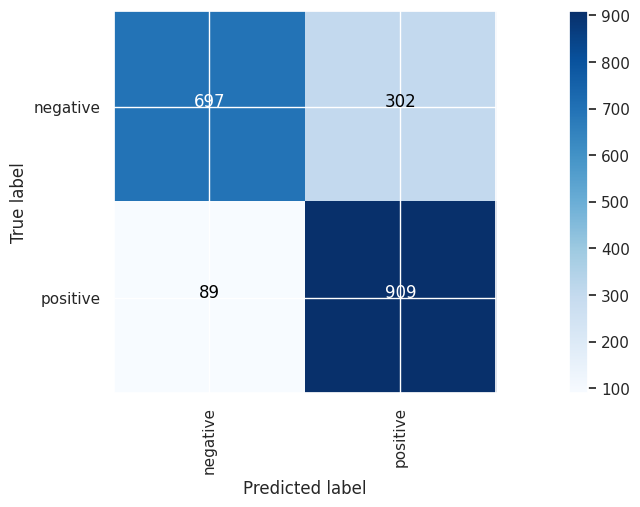

Final Accuracy
0.8042063094641962


In [20]:
# VSM models
results = []
name = "Conv"
description =   "number_of_filters=[128,128,128], \
                kernel_sizes=[4,4,4], \
                pooling_size=5, \
                batchnorm=False, \
                general_dropout=0.0, \
                extra_dense_layer_nn=0,\
                extra_dense_dropout=0.0"
description = description.replace('\t', '').replace('\n', '').replace(' ', '')

number_of_filters=[128,128,128]
kernel_sizes=[4,4,4]
pooling_size=5
batchnorm=False
general_dropout=0.0
extra_dense_layer_nn=0
extra_dense_dropout=0.0

# VSM models
results = []
for rep in vsm_model:
    build_exp02(name,
                description, 
                rep, 
                input_shape=(5000,1,),
                number_of_filters=number_of_filters,
                kernel_sizes=kernel_sizes,
                batchnorm=batchnorm,
                general_dropout=general_dropout,
                extra_dense_layer_nn=extra_dense_layer_nn,
                extra_dense_dropout=extra_dense_dropout
                )

# Embedding with padding
embedding = layers.Embedding(input_dim=vocab_size,
                     output_dim=emb_dim,
                     trainable=True,
                     input_length=embedding_padding["train_text_features"].shape[1])
build_exp02(name,
            description, 
            embedding_padding, 
            input_shape=(embedding_padding["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )

# GloVe
embedding = layers.Embedding(num_words,
                     emb_dim,
                     embeddings_initializer=Constant(embedding_glove["embedding_matrix"]),
                     trainable=True,
                     input_length=embedding_glove["train_text_features"].shape[1])

build_exp02(name,
            description, 
            embedding_glove, 
            input_shape=(embedding_glove["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )
partial = pd.DataFrame(results)
partial.to_csv("exp_02_1.csv", index=False)

Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_28 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 max_pooling1d_27 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 conv1d_29 (Conv1D)          (32, 996, 128)            65664     
                                                                 
 max_pooling1d_28 (MaxPooli  (32, 199, 128)            0         
 ng1D)                                                           
                                                                 
 global_max_pooling1d_9 (Gl  (32, 128)                 0 

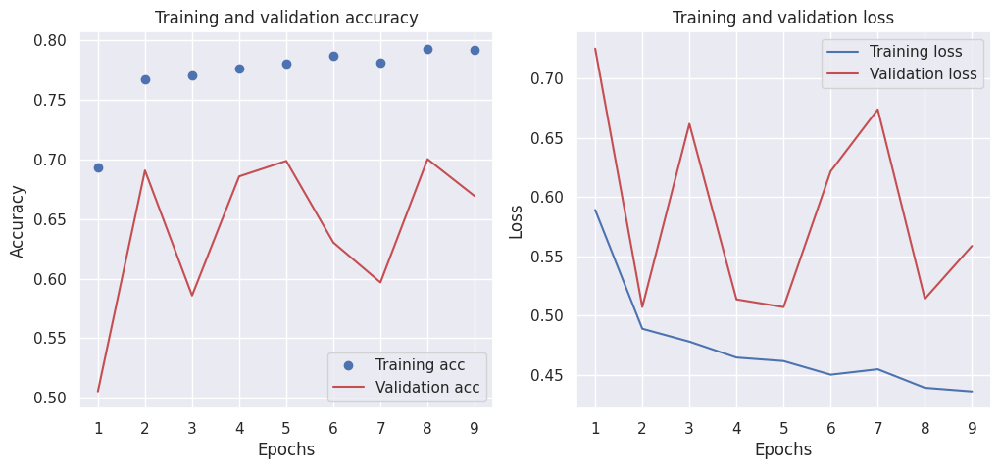

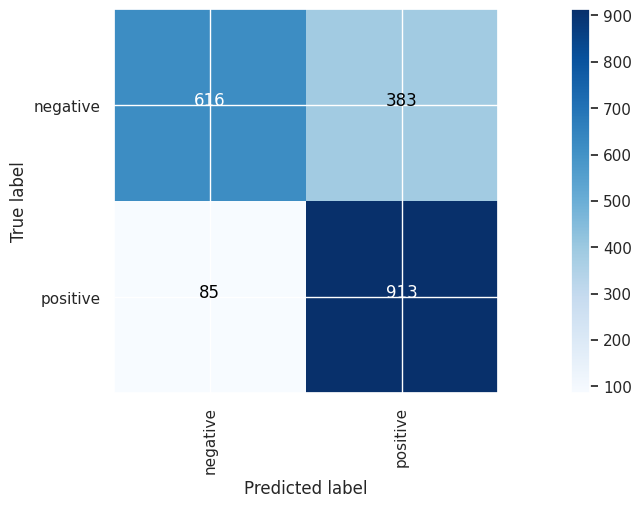

Final Accuracy
0.7656484727090636
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_12 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_30 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 max_pooling1d_29 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 conv1d_31 (Conv1D)          (32, 996, 128)            65664     
                                                                 
 max_pooling1d_30 (MaxPooli  (32, 199, 128)            0         
 ng1D)                                                           
                                                                 
 global_max_pooling1d_1

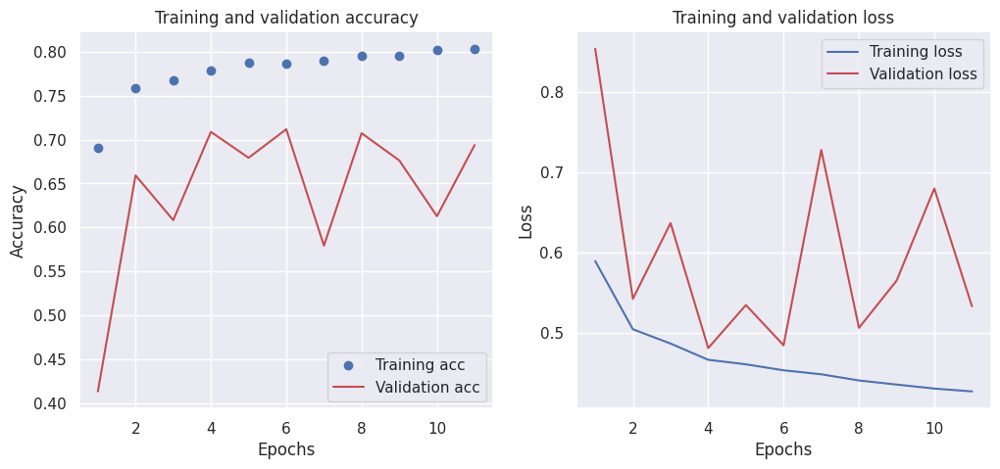

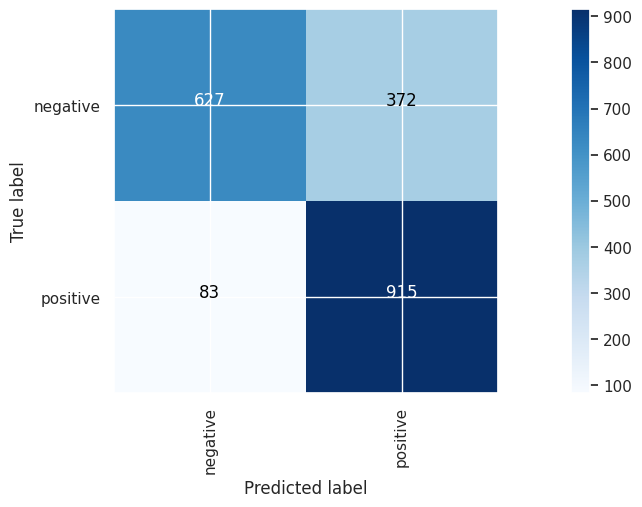

Final Accuracy
0.7721582373560341
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_13 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_32 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 max_pooling1d_31 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 conv1d_33 (Conv1D)          (32, 996, 128)            65664     
                                                                 
 max_pooling1d_32 (MaxPooli  (32, 199, 128)            0         
 ng1D)                                                           
                                                                 
 global_max_pooling1d_1

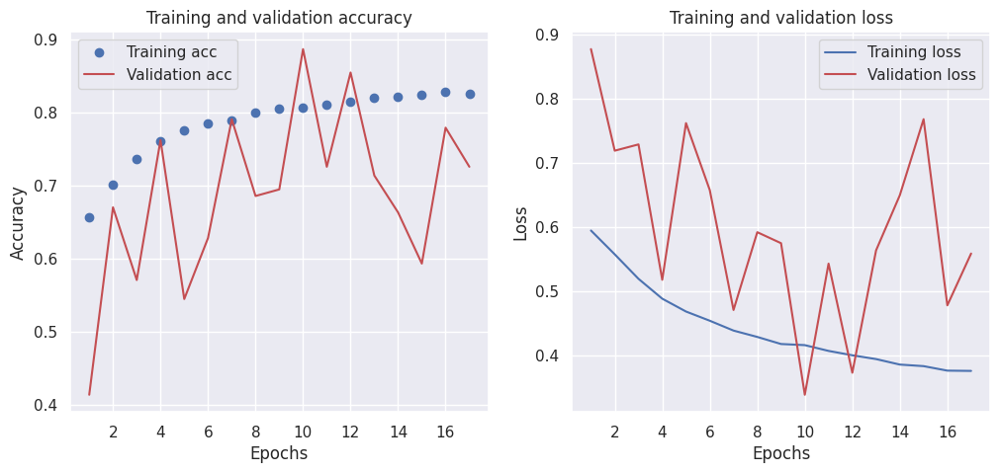

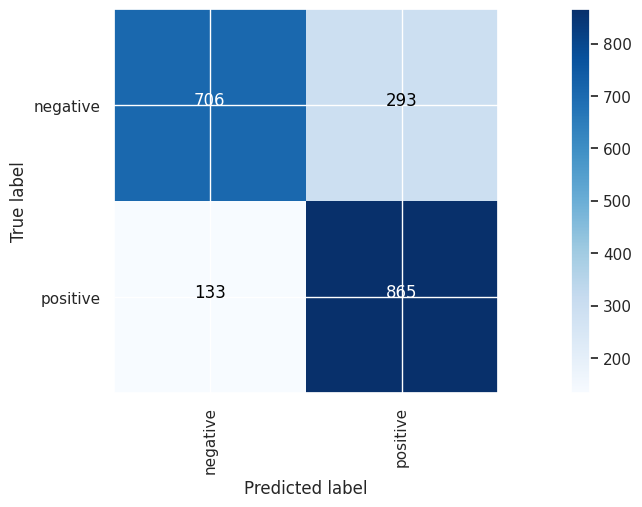

Final Accuracy
0.7866800200300451
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_34 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 max_pooling1d_33 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 conv1d_35 (Conv1D)          (32, 996, 128)            65664     
                                                                 
 max_pooling1d_34 (MaxPooli  (32, 199, 128)            0         
 ng1D)                                                           
                                                                 
 global_max_pooling1d_1

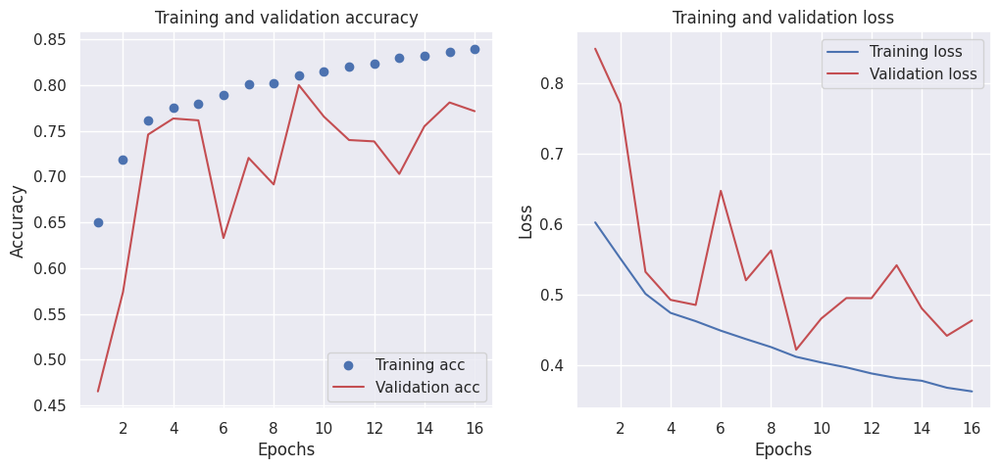

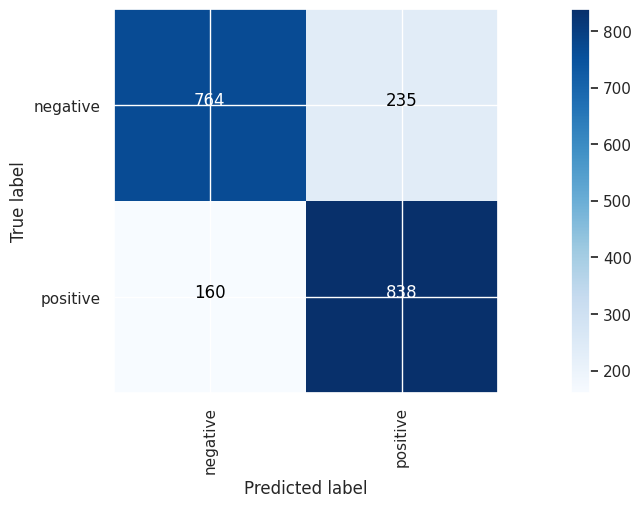

Final Accuracy
0.8022033049574362
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_15 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_2 (Embedding)     (32, 600, 50)             1488650   
                                                                 
 conv1d_36 (Conv1D)          (32, 597, 128)            25728     
                                                                 
 max_pooling1d_35 (MaxPooli  (32, 119, 128)            0         
 ng1D)                                                           
                                                                 
 conv1d_37 (Conv1D)          (32, 116, 128)            65664     
                                                                 
 max_pooling1d_36 (MaxPooli  (32, 23, 128)             0         
 ng1D)                 

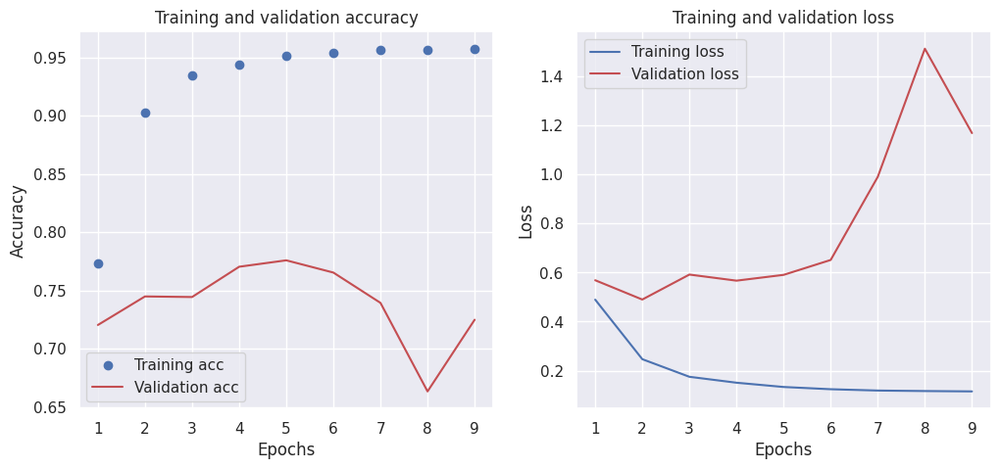

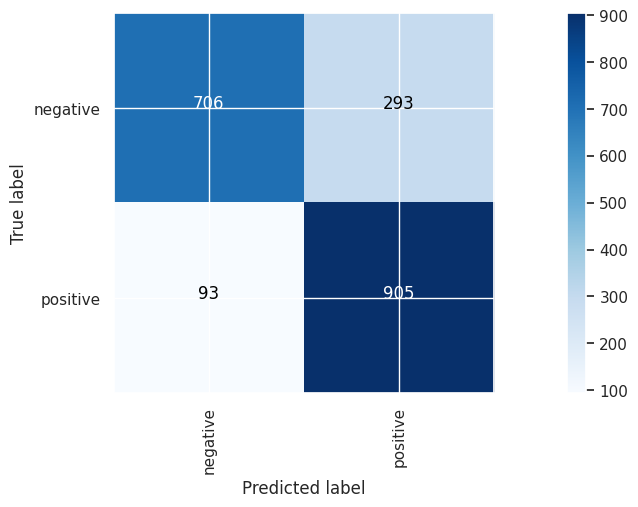

Final Accuracy
0.8067100650976464
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_16 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_3 (Embedding)     (32, 600, 50)             1488650   
                                                                 
 conv1d_38 (Conv1D)          (32, 597, 128)            25728     
                                                                 
 max_pooling1d_37 (MaxPooli  (32, 119, 128)            0         
 ng1D)                                                           
                                                                 
 conv1d_39 (Conv1D)          (32, 116, 128)            65664     
                                                                 
 max_pooling1d_38 (MaxPooli  (32, 23, 128)             0         
 ng1D)                 

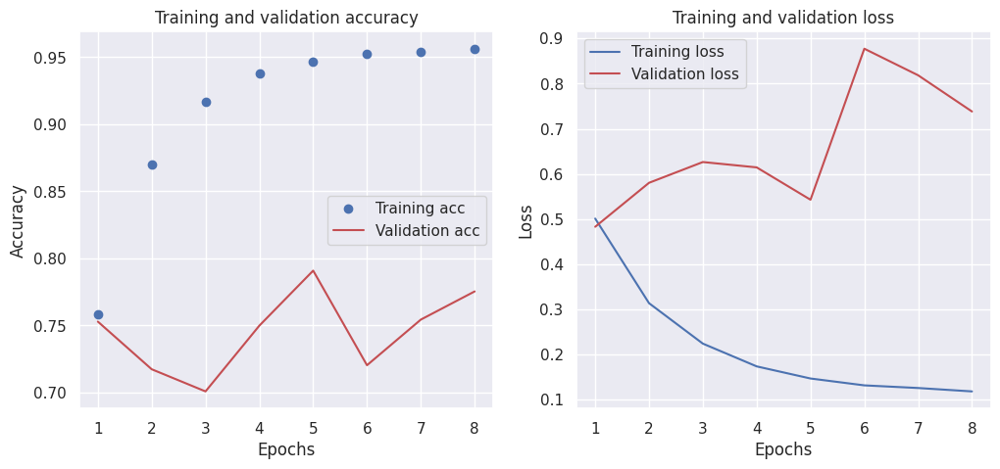

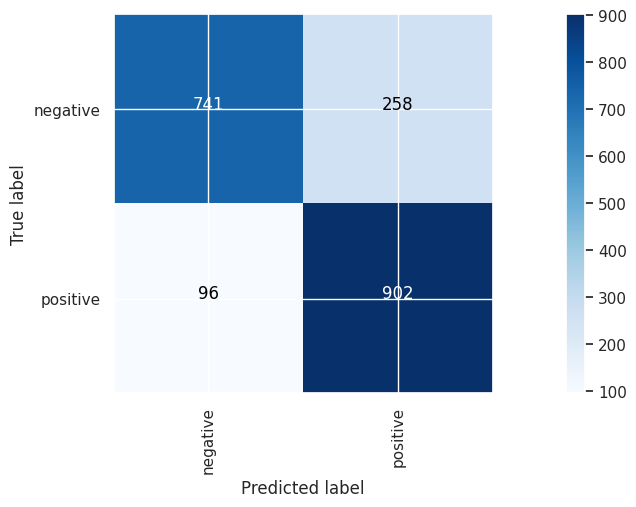

Final Accuracy
0.8227341011517276


In [21]:
# VSM models
results = []
name = "Conv"
description =   "number_of_filters=[128,128], \
                kernel_sizes=[4,4], \
                pooling_size=5, \
                batchnorm=False, \
                general_dropout=0.0, \
                extra_dense_layer_nn=0,\
                extra_dense_dropout=0.0"
description = description.replace('\t', '').replace('\n', '').replace(' ', '')

number_of_filters=[128,128]
kernel_sizes=[4,4]
pooling_size=5
batchnorm=False
general_dropout=0.0
extra_dense_layer_nn=0
extra_dense_dropout=0.0

# VSM models
results = []
for rep in vsm_model:
    build_exp02(name,
                description, 
                rep, 
                input_shape=(5000,1,),
                number_of_filters=number_of_filters,
                kernel_sizes=kernel_sizes,
                batchnorm=batchnorm,
                general_dropout=general_dropout,
                extra_dense_layer_nn=extra_dense_layer_nn,
                extra_dense_dropout=extra_dense_dropout
                )

# Embedding with padding
embedding = layers.Embedding(input_dim=vocab_size,
                     output_dim=emb_dim,
                     trainable=True,
                     input_length=embedding_padding["train_text_features"].shape[1])
build_exp02(name,
            description, 
            embedding_padding, 
            input_shape=(embedding_padding["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )

# GloVe
embedding = layers.Embedding(num_words,
                     emb_dim,
                     embeddings_initializer=Constant(embedding_glove["embedding_matrix"]),
                     trainable=True,
                     input_length=embedding_glove["train_text_features"].shape[1])

build_exp02(name,
            description, 
            embedding_glove, 
            input_shape=(embedding_glove["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )
partial = pd.DataFrame(results)
partial.to_csv("exp_02_2.csv", index=False)

Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_17 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_40 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 max_pooling1d_39 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 global_max_pooling1d_15 (G  (32, 128)                 0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_15 (Dense)            (32, 2)                   258       
                                                                 
Total params: 898 (3.51 KB)
Trainable params: 898 (3.51 K

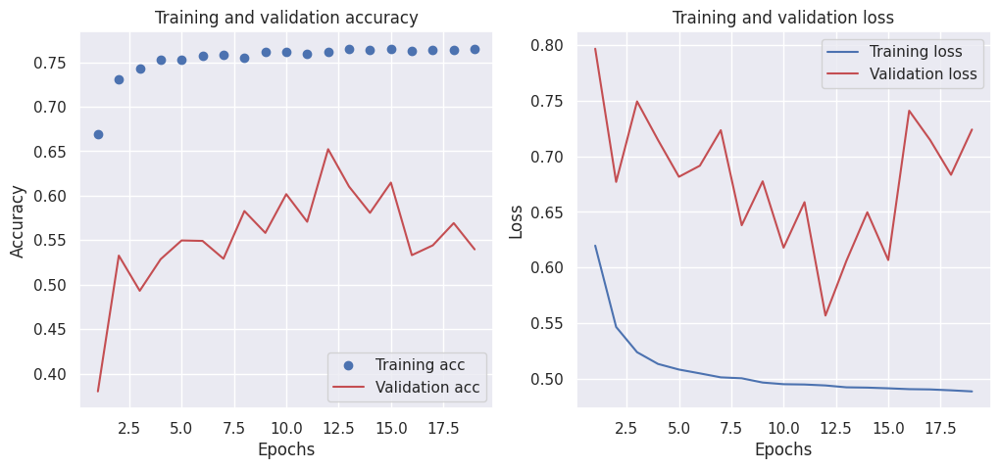

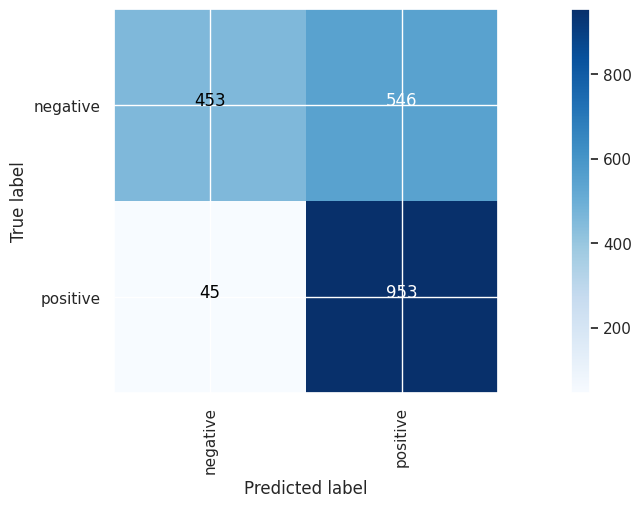

Final Accuracy
0.7040560841261893
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_18 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_41 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 max_pooling1d_40 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 global_max_pooling1d_16 (G  (32, 128)                 0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_16 (Dense)            (32, 2)                   258       
                                                                 
Total params: 898 (3.51

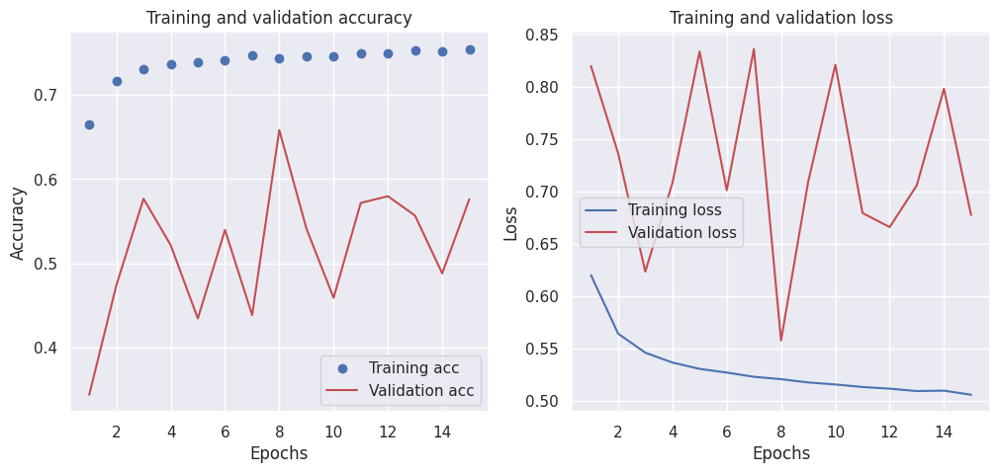

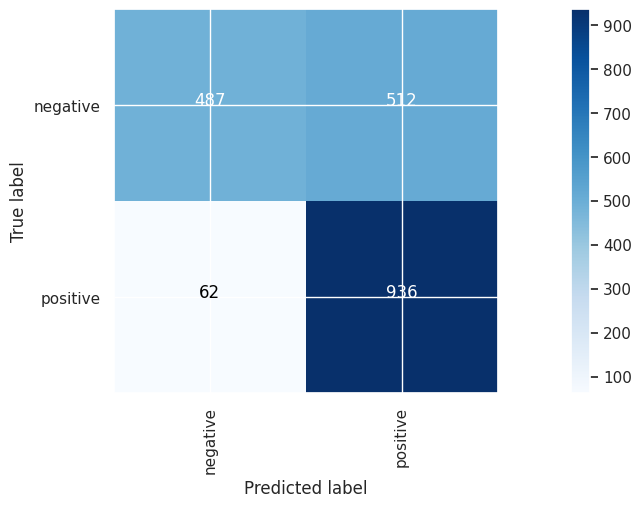

Final Accuracy
0.7125688532799199
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_19 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_42 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 max_pooling1d_41 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 global_max_pooling1d_17 (G  (32, 128)                 0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_17 (Dense)            (32, 2)                   258       
                                                                 
Total params: 898 (3.51

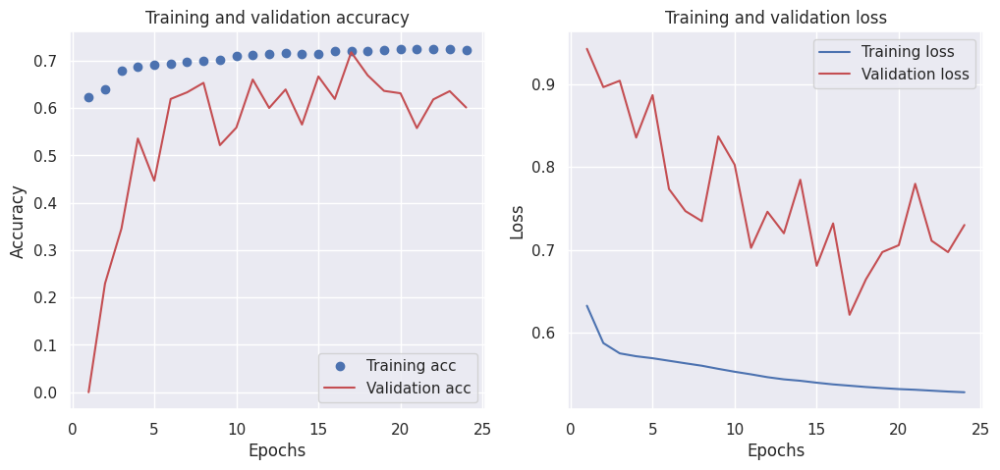

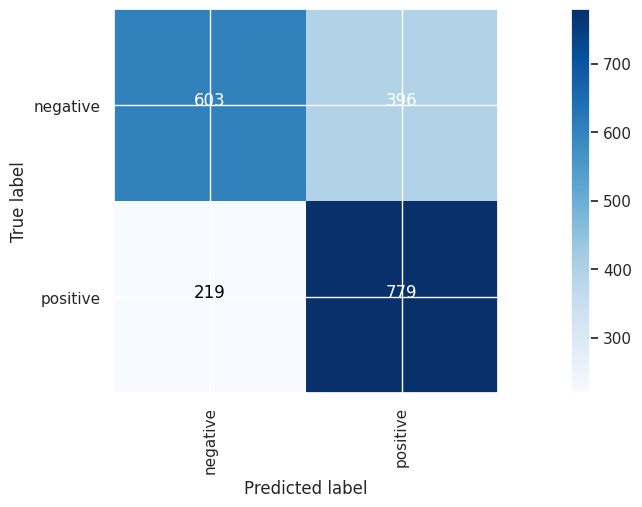

Final Accuracy
0.6920380570856285
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_20 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_43 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 max_pooling1d_42 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 global_max_pooling1d_18 (G  (32, 128)                 0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_18 (Dense)            (32, 2)                   258       
                                                                 
Total params: 898 (3.51

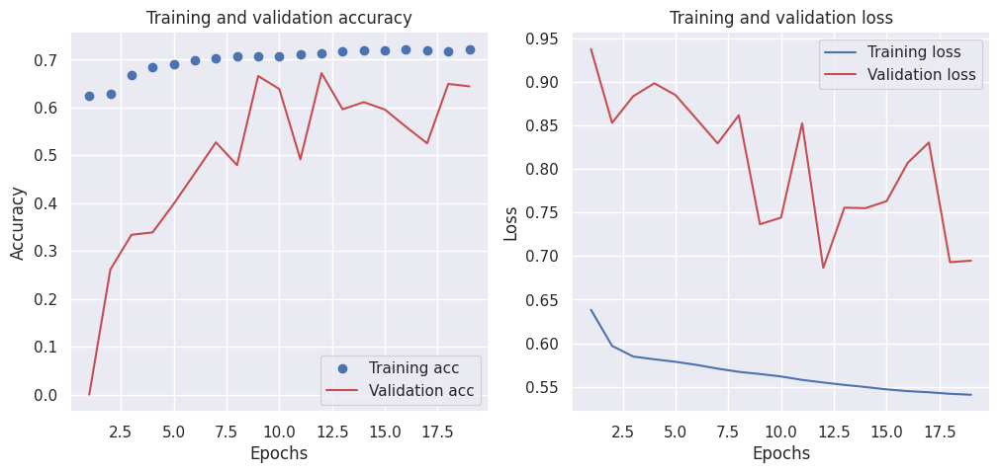

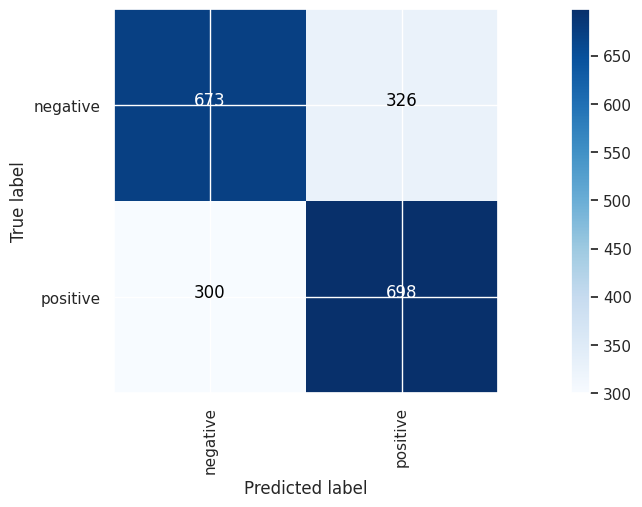

Final Accuracy
0.686529794692038
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_21 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_4 (Embedding)     (32, 600, 50)             1488650   
                                                                 
 conv1d_44 (Conv1D)          (32, 597, 128)            25728     
                                                                 
 max_pooling1d_43 (MaxPooli  (32, 119, 128)            0         
 ng1D)                                                           
                                                                 
 global_max_pooling1d_19 (G  (32, 128)                 0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_19 (Dense)       

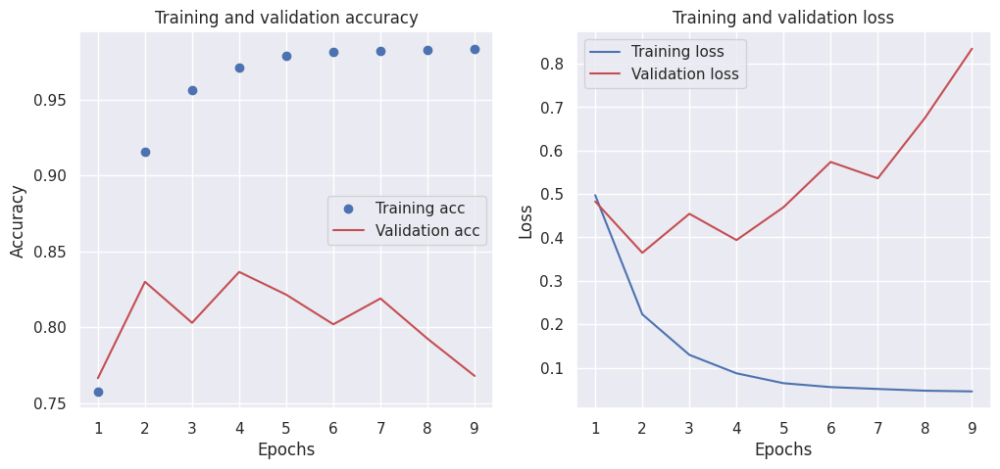

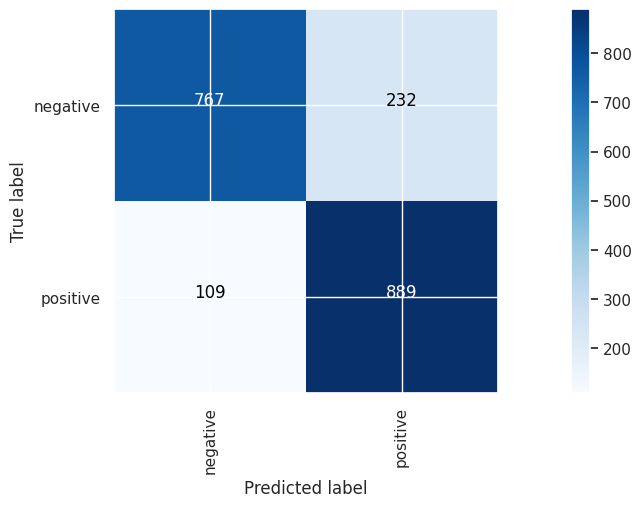

Final Accuracy
0.829243865798698
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_22 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_5 (Embedding)     (32, 600, 50)             1488650   
                                                                 
 conv1d_45 (Conv1D)          (32, 597, 128)            25728     
                                                                 
 max_pooling1d_44 (MaxPooli  (32, 119, 128)            0         
 ng1D)                                                           
                                                                 
 global_max_pooling1d_20 (G  (32, 128)                 0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_20 (Dense)       

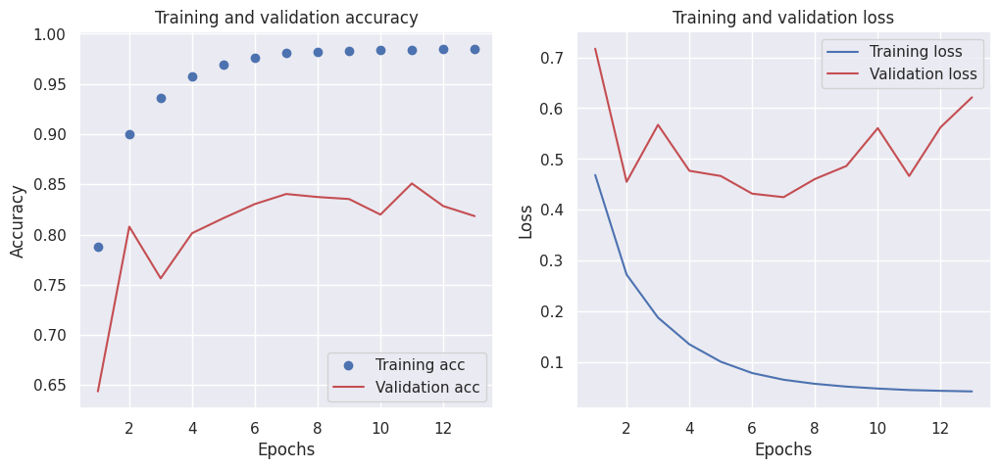

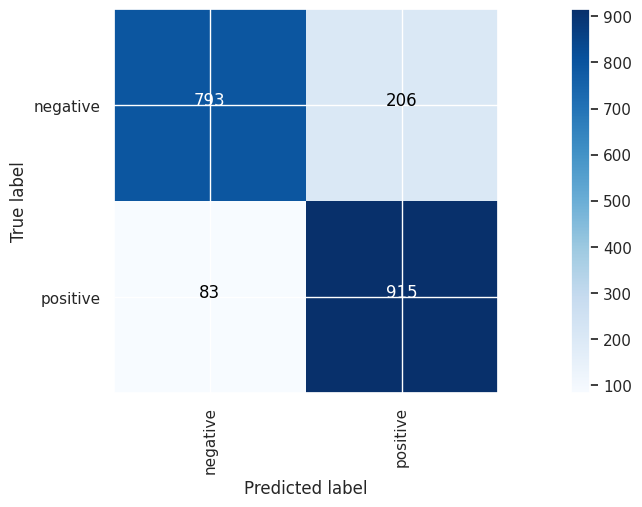

Final Accuracy
0.8552829243865798


In [22]:
# VSM models
results = []
name = "Conv"
description =   "number_of_filters=[128], \
                kernel_sizes=[4], \
                pooling_size=5, \
                batchnorm=False, \
                general_dropout=0.0, \
                extra_dense_layer_nn=0,\
                extra_dense_dropout=0.0"
description = description.replace('\t', '').replace('\n', '').replace(' ', '')

number_of_filters=[128]
kernel_sizes=[4]
pooling_size=5
batchnorm=False
general_dropout=0.0
extra_dense_layer_nn=0
extra_dense_dropout=0.0

# VSM models
results = []
for rep in vsm_model:
    build_exp02(name,
                description, 
                rep, 
                input_shape=(5000,1,),
                number_of_filters=number_of_filters,
                kernel_sizes=kernel_sizes,
                batchnorm=batchnorm,
                general_dropout=general_dropout,
                extra_dense_layer_nn=extra_dense_layer_nn,
                extra_dense_dropout=extra_dense_dropout
                )

# Embedding with padding
embedding = layers.Embedding(input_dim=vocab_size,
                     output_dim=emb_dim,
                     trainable=True,
                     input_length=embedding_padding["train_text_features"].shape[1])
build_exp02(name,
            description, 
            embedding_padding, 
            input_shape=(embedding_padding["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )

# GloVe
embedding = layers.Embedding(num_words,
                     emb_dim,
                     embeddings_initializer=Constant(embedding_glove["embedding_matrix"]),
                     trainable=True,
                     input_length=embedding_glove["train_text_features"].shape[1])

build_exp02(name,
            description, 
            embedding_glove, 
            input_shape=(embedding_glove["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )
partial = pd.DataFrame(results)
partial.to_csv("exp_02_3.csv", index=False)

Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_23 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_46 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 batch_normalization (Batch  (32, 4997, 128)           512       
 Normalization)                                                  
                                                                 
 activation (Activation)     (32, 4997, 128)           0         
                                                                 
 max_pooling1d_45 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 dropout (Dropout)           (32, 999, 128)            0 

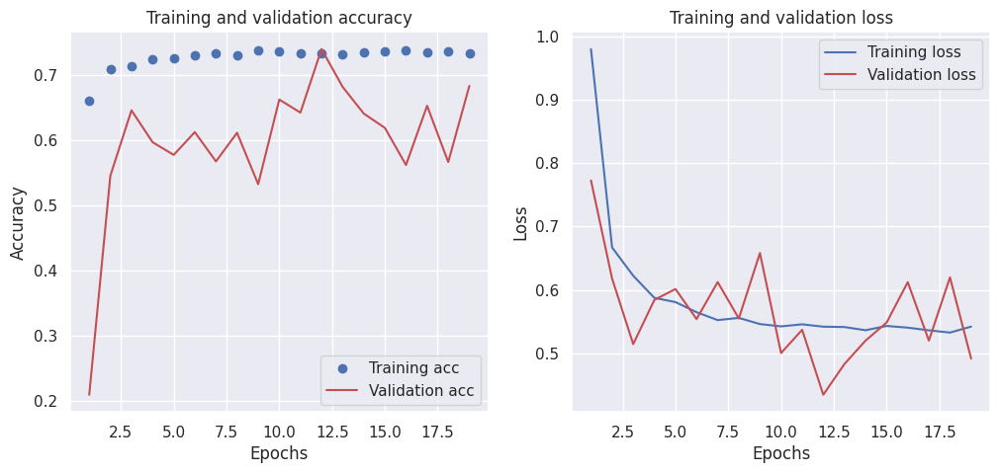

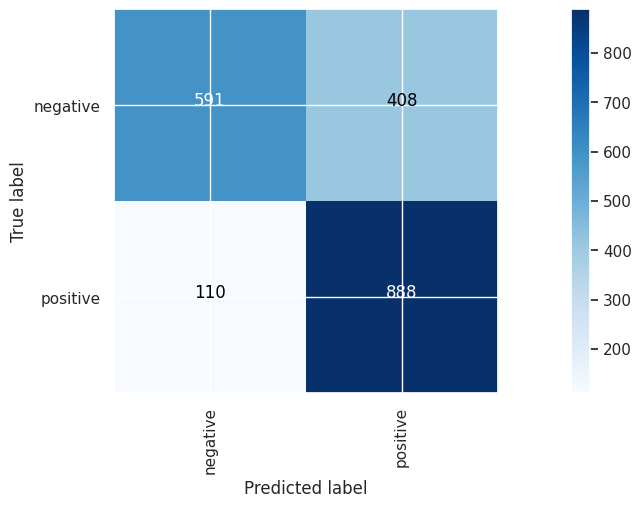

Final Accuracy
0.7406109163745619
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_24 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_47 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 batch_normalization_1 (Bat  (32, 4997, 128)           512       
 chNormalization)                                                
                                                                 
 activation_1 (Activation)   (32, 4997, 128)           0         
                                                                 
 max_pooling1d_46 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 dropout_1 (Dropout)   

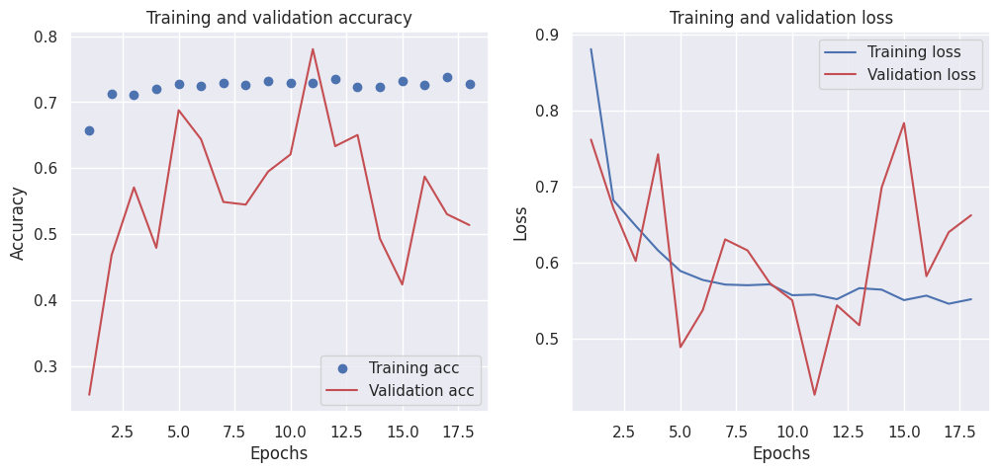

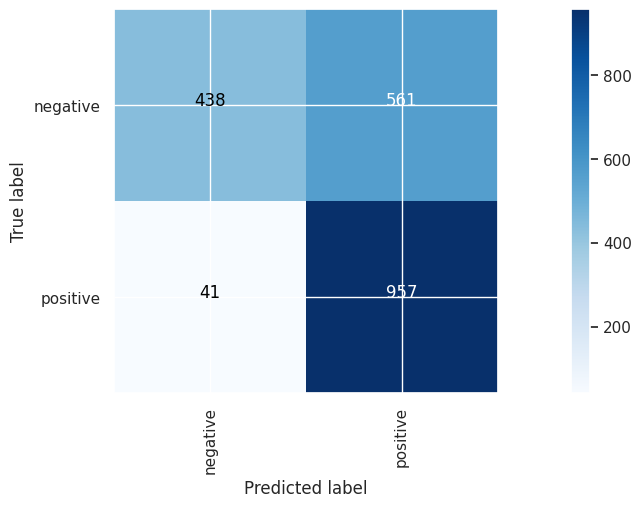

Final Accuracy
0.6985478217325989
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_25 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_48 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 batch_normalization_2 (Bat  (32, 4997, 128)           512       
 chNormalization)                                                
                                                                 
 activation_2 (Activation)   (32, 4997, 128)           0         
                                                                 
 max_pooling1d_47 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 dropout_2 (Dropout)   

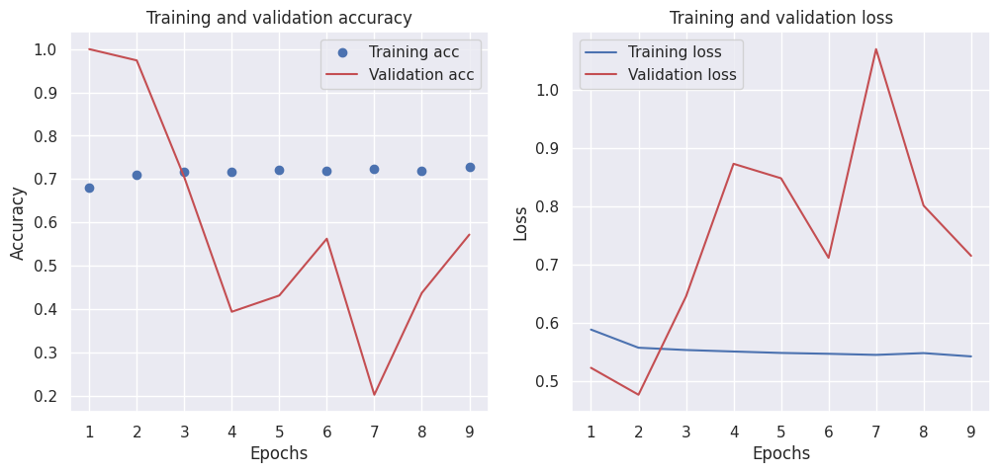

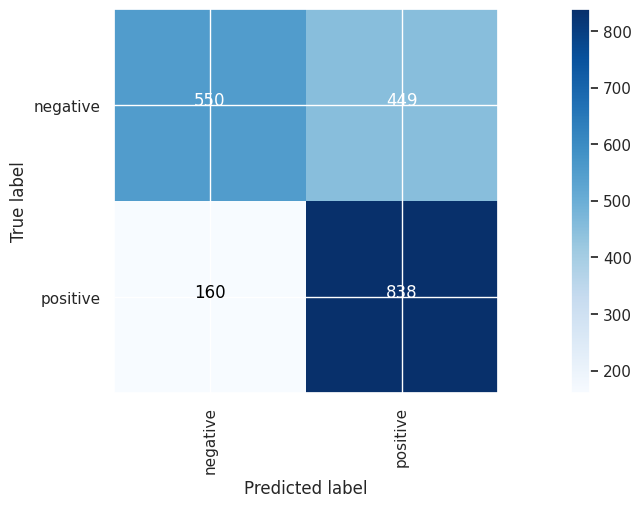

Final Accuracy
0.6950425638457687
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_26 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_49 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 batch_normalization_3 (Bat  (32, 4997, 128)           512       
 chNormalization)                                                
                                                                 
 activation_3 (Activation)   (32, 4997, 128)           0         
                                                                 
 max_pooling1d_48 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 dropout_3 (Dropout)   

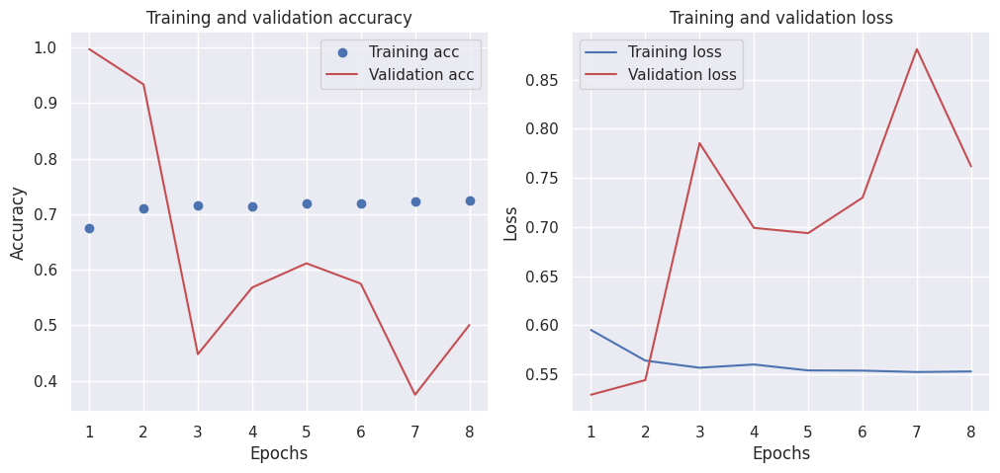

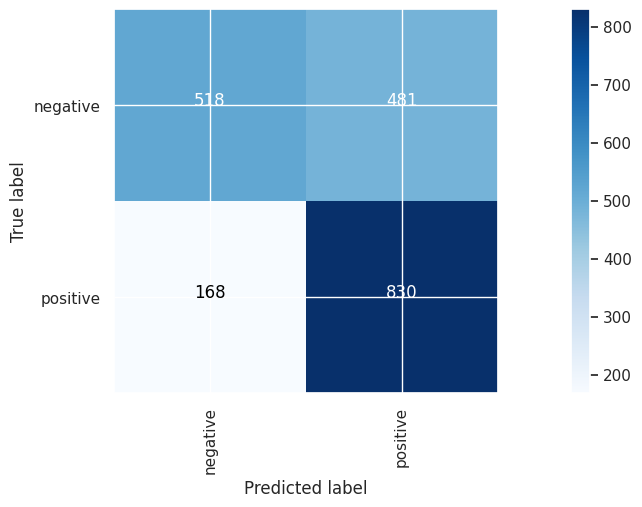

Final Accuracy
0.6750125187781673
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_27 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_6 (Embedding)     (32, 600, 50)             1488650   
                                                                 
 conv1d_50 (Conv1D)          (32, 597, 128)            25728     
                                                                 
 batch_normalization_4 (Bat  (32, 597, 128)            512       
 chNormalization)                                                
                                                                 
 activation_4 (Activation)   (32, 597, 128)            0         
                                                                 
 max_pooling1d_49 (MaxPooli  (32, 119, 128)            0         
 ng1D)                 

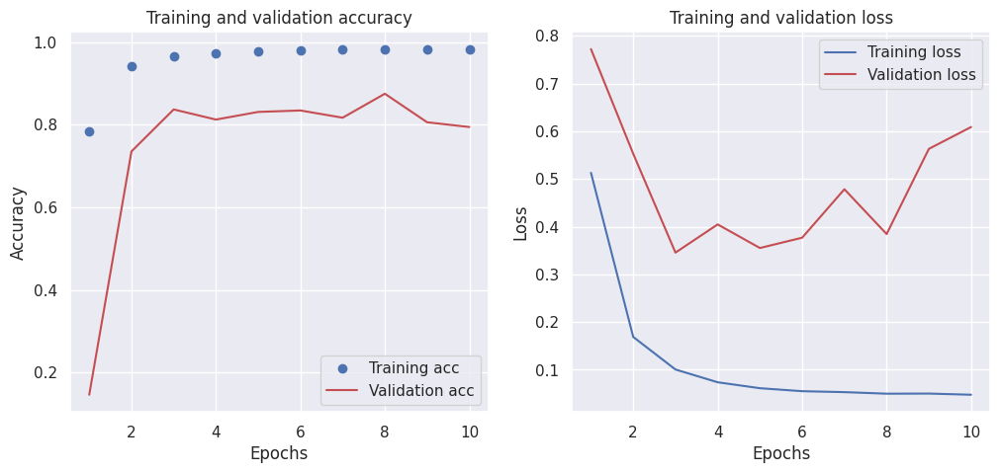

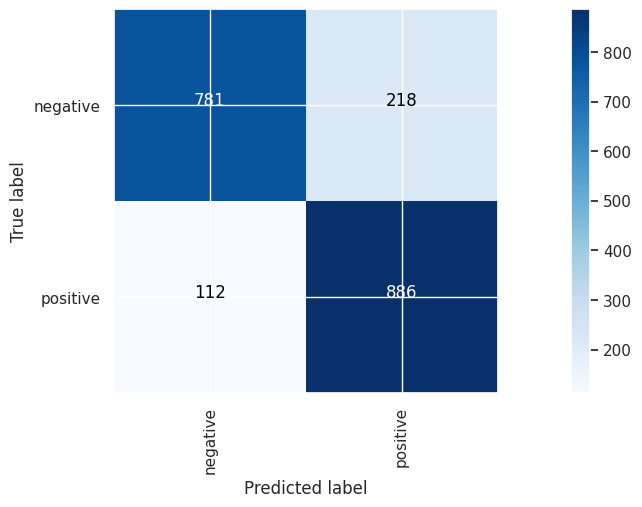

Final Accuracy
0.8347521281922884
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_28 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_7 (Embedding)     (32, 600, 50)             1488650   
                                                                 
 conv1d_51 (Conv1D)          (32, 597, 128)            25728     
                                                                 
 batch_normalization_5 (Bat  (32, 597, 128)            512       
 chNormalization)                                                
                                                                 
 activation_5 (Activation)   (32, 597, 128)            0         
                                                                 
 max_pooling1d_50 (MaxPooli  (32, 119, 128)            0         
 ng1D)                 

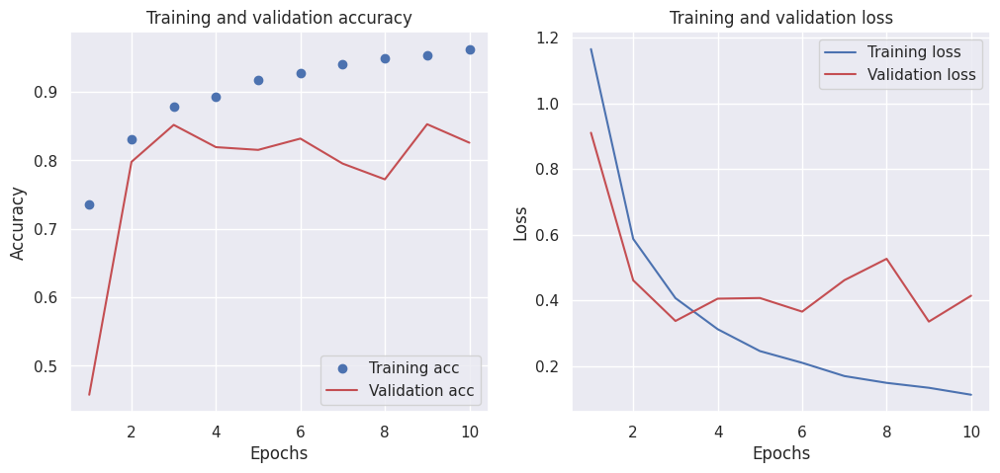

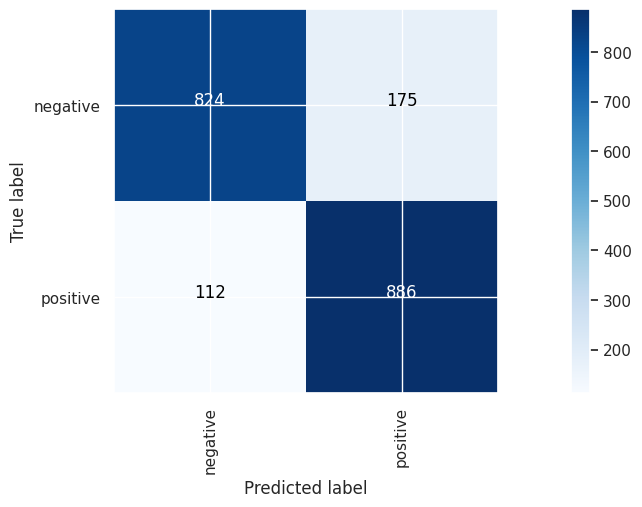

Final Accuracy
0.85628442663996


In [27]:
# VSM models
results = []
name = "Conv"
description =   """
                number_of_filters=[128], 
                kernel_sizes=[4], 
                pooling_size=5, 
                batchnorm=True, 
                general_dropout=0.5, 
                extra_dense_layer_nn=0,  
                extra_dense_dropout=0.0
                """
description = description.replace('\t', '').replace('\n', '').replace(' ', '')

number_of_filters=[128]
kernel_sizes=[4]
pooling_size=5
batchnorm=True
general_dropout=0.5
extra_dense_layer_nn=0
extra_dense_dropout=0.0

# VSM models
results = []
for rep in vsm_model:
    build_exp02(name,
                description, 
                rep, 
                input_shape=(5000,1,),
                number_of_filters=number_of_filters,
                kernel_sizes=kernel_sizes,
                batchnorm=batchnorm,
                general_dropout=general_dropout,
                extra_dense_layer_nn=extra_dense_layer_nn,
                extra_dense_dropout=extra_dense_dropout
                )

# Embedding with padding
embedding = layers.Embedding(input_dim=vocab_size,
                     output_dim=emb_dim,
                     trainable=True,
                     input_length=embedding_padding["train_text_features"].shape[1])
build_exp02(name,
            description, 
            embedding_padding, 
            input_shape=(embedding_padding["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )

# GloVe
embedding = layers.Embedding(num_words,
                     emb_dim,
                     embeddings_initializer=Constant(embedding_glove["embedding_matrix"]),
                     trainable=True,
                     input_length=embedding_glove["train_text_features"].shape[1])

build_exp02(name,
            description, 
            embedding_glove, 
            input_shape=(embedding_glove["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )
partial = pd.DataFrame(results)
partial.to_csv("exp_02_4.csv", index=False)

Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_29 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_52 (Conv1D)          (32, 4997, 32)            160       
                                                                 
 batch_normalization_6 (Bat  (32, 4997, 32)            128       
 chNormalization)                                                
                                                                 
 activation_6 (Activation)   (32, 4997, 32)            0         
                                                                 
 max_pooling1d_51 (MaxPooli  (32, 999, 32)             0         
 ng1D)                                                           
                                                                 
 conv1d_53 (Conv1D)          (32, 996, 64)             82

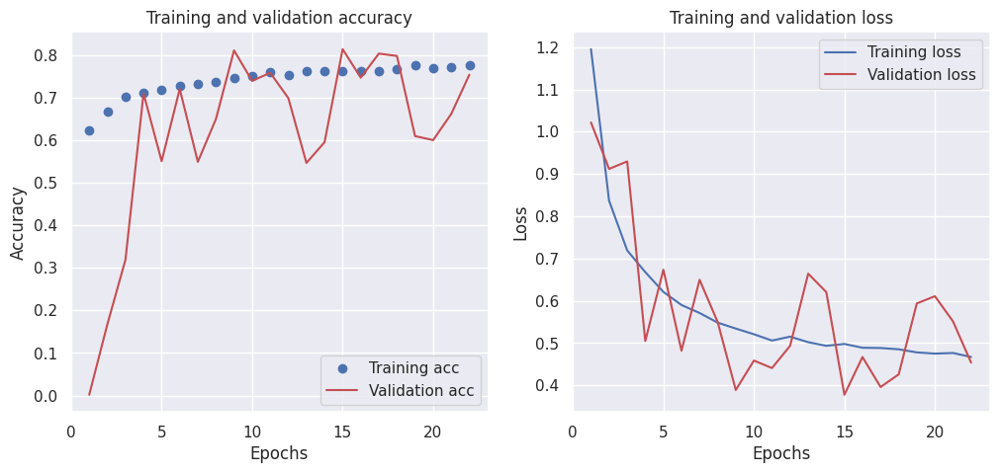

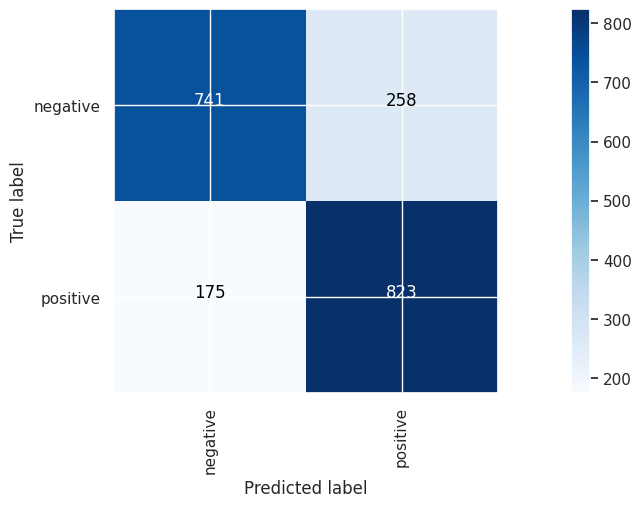

Final Accuracy
0.7831747621432148
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_30 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_54 (Conv1D)          (32, 4997, 32)            160       
                                                                 
 batch_normalization_8 (Bat  (32, 4997, 32)            128       
 chNormalization)                                                
                                                                 
 activation_8 (Activation)   (32, 4997, 32)            0         
                                                                 
 max_pooling1d_53 (MaxPooli  (32, 999, 32)             0         
 ng1D)                                                           
                                                                 
 conv1d_55 (Conv1D)    

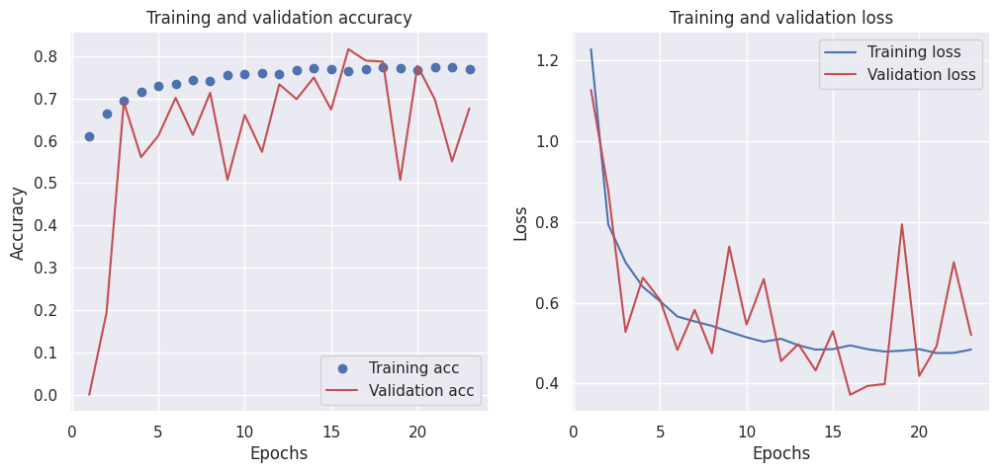

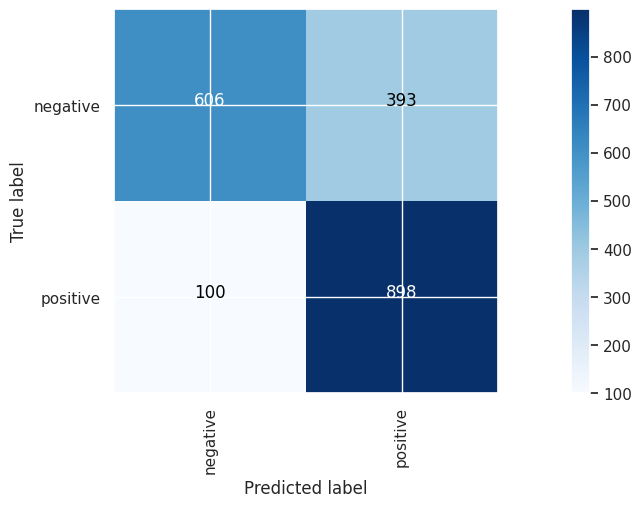

Final Accuracy
0.7531296945418127
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_31 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_56 (Conv1D)          (32, 4997, 32)            160       
                                                                 
 batch_normalization_10 (Ba  (32, 4997, 32)            128       
 tchNormalization)                                               
                                                                 
 activation_10 (Activation)  (32, 4997, 32)            0         
                                                                 
 max_pooling1d_55 (MaxPooli  (32, 999, 32)             0         
 ng1D)                                                           
                                                                 
 conv1d_57 (Conv1D)    

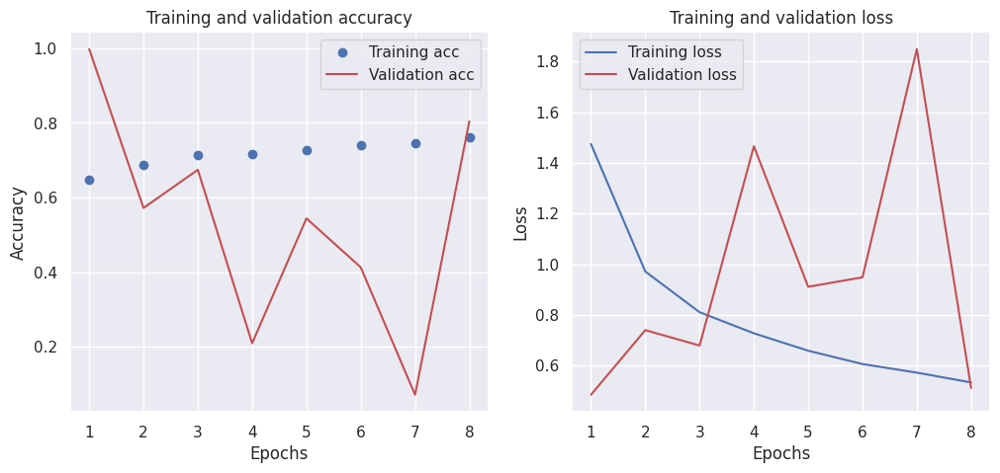

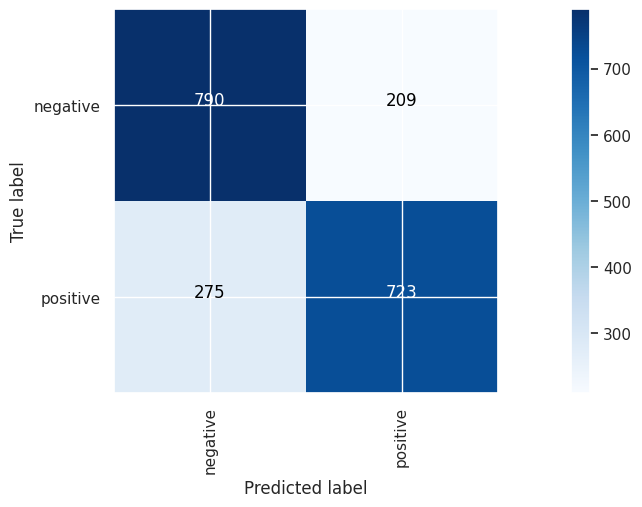

Final Accuracy
0.757636454682023
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_32 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_58 (Conv1D)          (32, 4997, 32)            160       
                                                                 
 batch_normalization_12 (Ba  (32, 4997, 32)            128       
 tchNormalization)                                               
                                                                 
 activation_12 (Activation)  (32, 4997, 32)            0         
                                                                 
 max_pooling1d_57 (MaxPooli  (32, 999, 32)             0         
 ng1D)                                                           
                                                                 
 conv1d_59 (Conv1D)     

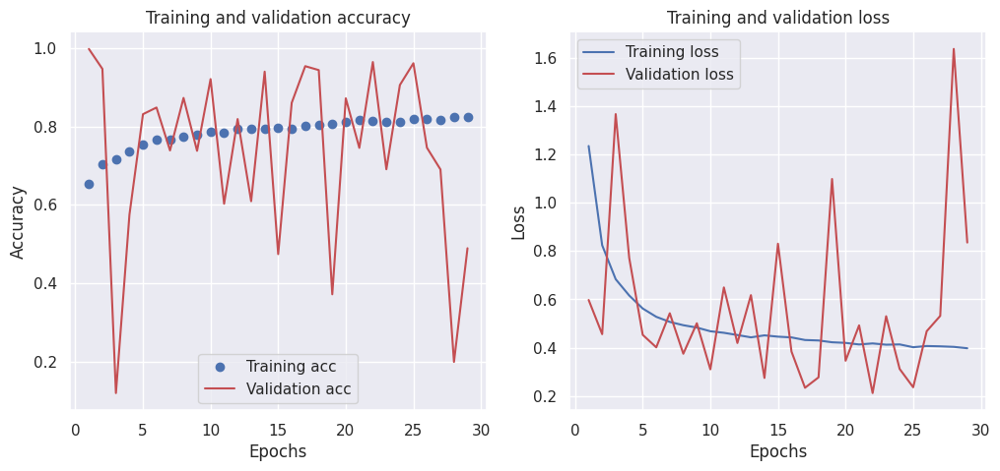

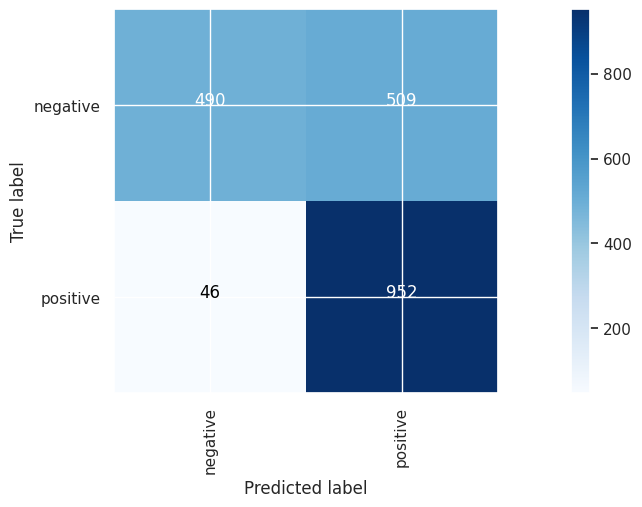

Final Accuracy
0.7220831246870305
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_33 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_8 (Embedding)     (32, 600, 50)             1488650   
                                                                 
 conv1d_60 (Conv1D)          (32, 597, 32)             6432      
                                                                 
 batch_normalization_14 (Ba  (32, 597, 32)             128       
 tchNormalization)                                               
                                                                 
 activation_14 (Activation)  (32, 597, 32)             0         
                                                                 
 max_pooling1d_59 (MaxPooli  (32, 119, 32)             0         
 ng1D)                 

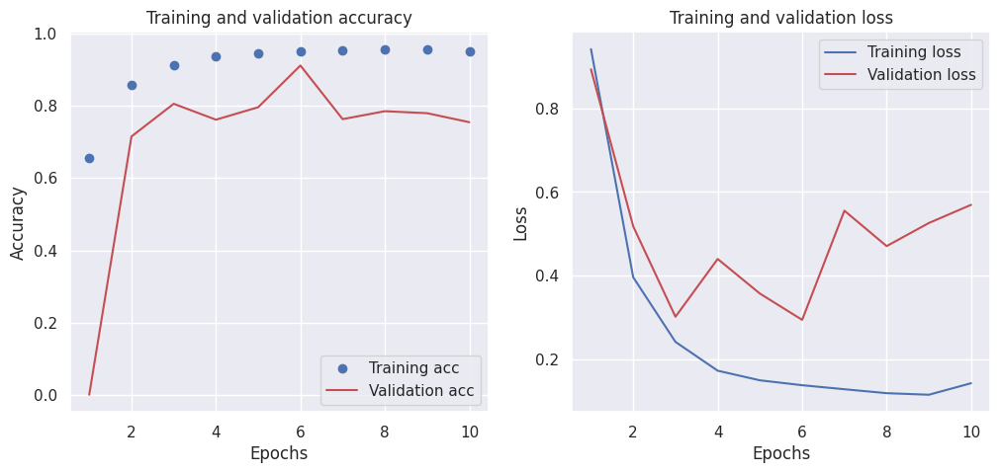

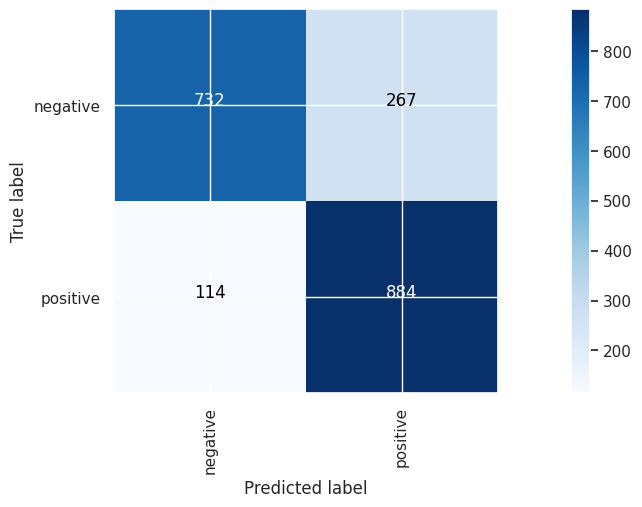

Final Accuracy
0.8092138207310966
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_34 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_9 (Embedding)     (32, 600, 50)             1488650   
                                                                 
 conv1d_62 (Conv1D)          (32, 597, 32)             6432      
                                                                 
 batch_normalization_16 (Ba  (32, 597, 32)             128       
 tchNormalization)                                               
                                                                 
 activation_16 (Activation)  (32, 597, 32)             0         
                                                                 
 max_pooling1d_61 (MaxPooli  (32, 119, 32)             0         
 ng1D)                 

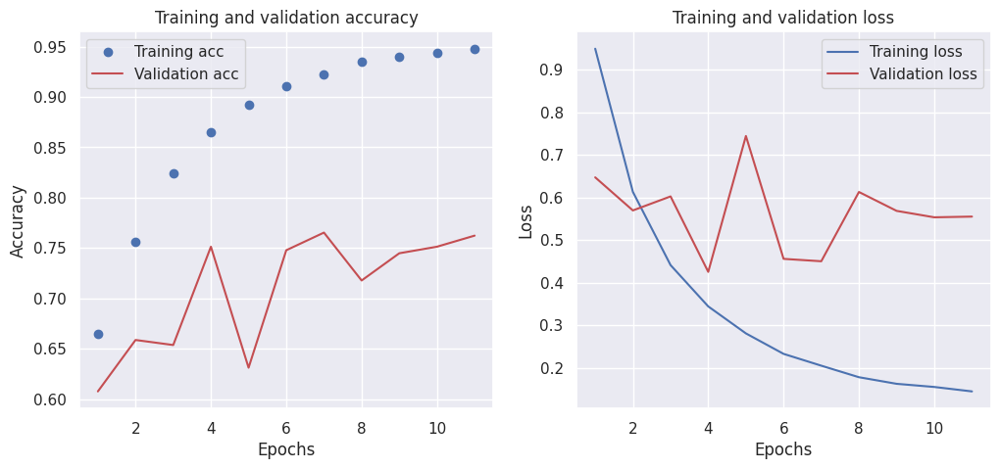

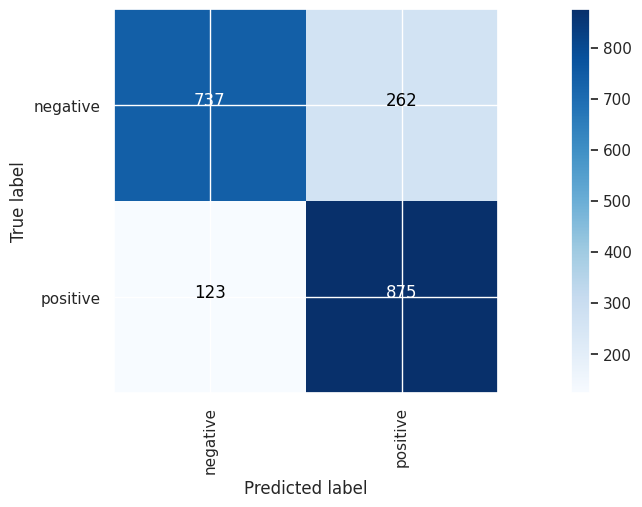

Final Accuracy
0.8072108162243365


In [28]:
# VSM models
results = []
name = "Conv"
description =   """
                number_of_filters=[32,64], 
                kernel_sizes=[4,4], 
                pooling_size=5,
                batchnorm=True, 
                general_dropout=0.5, 
                extra_dense_layer_nn=0,  
                extra_dense_dropout=0.0
                """
description = description.replace('\t', '').replace('\n', '').replace(' ', '')

number_of_filters=[32,64]
kernel_sizes=[4,4]
pooling_size=5
batchnorm=True
general_dropout=0.5
extra_dense_layer_nn=0
extra_dense_dropout=0.0

# VSM models
results = []
for rep in vsm_model:
    build_exp02(name,
                description, 
                rep, 
                input_shape=(5000,1,),
                number_of_filters=number_of_filters,
                kernel_sizes=kernel_sizes,
                batchnorm=batchnorm,
                general_dropout=general_dropout,
                extra_dense_layer_nn=extra_dense_layer_nn,
                extra_dense_dropout=extra_dense_dropout
                )

# Embedding with padding
embedding = layers.Embedding(input_dim=vocab_size,
                     output_dim=emb_dim,
                     trainable=True,
                     input_length=embedding_padding["train_text_features"].shape[1])
build_exp02(name,
            description, 
            embedding_padding, 
            input_shape=(embedding_padding["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )

# GloVe
embedding = layers.Embedding(num_words,
                     emb_dim,
                     embeddings_initializer=Constant(embedding_glove["embedding_matrix"]),
                     trainable=True,
                     input_length=embedding_glove["train_text_features"].shape[1])

build_exp02(name,
            description, 
            embedding_glove, 
            input_shape=(embedding_glove["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )
partial = pd.DataFrame(results)
partial.to_csv("exp_02_5.csv", index=False)

Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_35 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_64 (Conv1D)          (32, 4997, 32)            160       
                                                                 
 batch_normalization_18 (Ba  (32, 4997, 32)            128       
 tchNormalization)                                               
                                                                 
 activation_18 (Activation)  (32, 4997, 32)            0         
                                                                 
 max_pooling1d_63 (MaxPooli  (32, 999, 32)             0         
 ng1D)                                                           
                                                                 
 conv1d_65 (Conv1D)          (32, 996, 64)             82

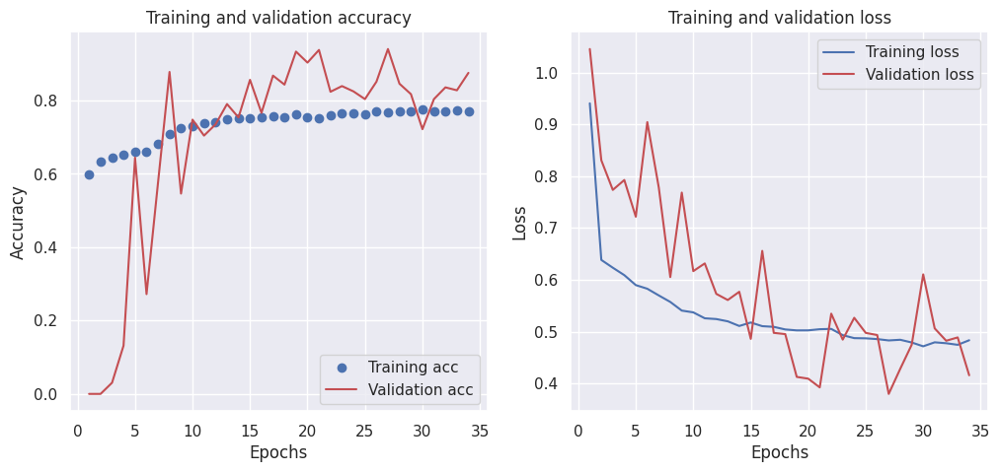

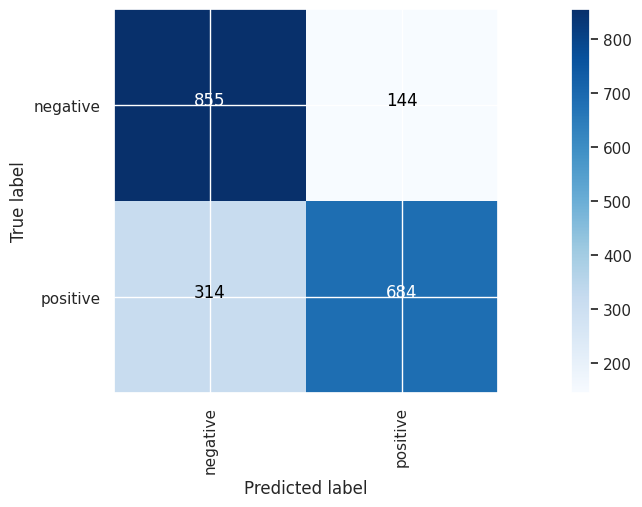

Final Accuracy
0.7706559839759639
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_36 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_66 (Conv1D)          (32, 4997, 32)            160       
                                                                 
 batch_normalization_20 (Ba  (32, 4997, 32)            128       
 tchNormalization)                                               
                                                                 
 activation_20 (Activation)  (32, 4997, 32)            0         
                                                                 
 max_pooling1d_65 (MaxPooli  (32, 999, 32)             0         
 ng1D)                                                           
                                                                 
 conv1d_67 (Conv1D)    

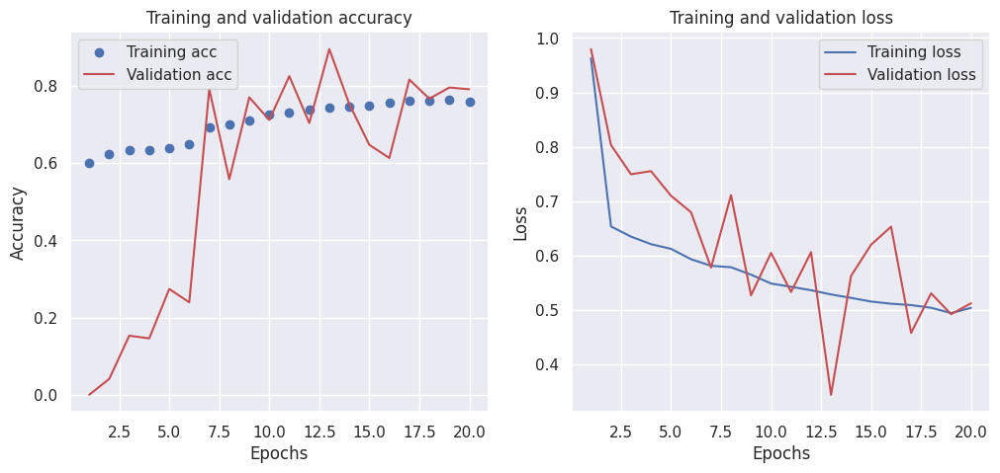

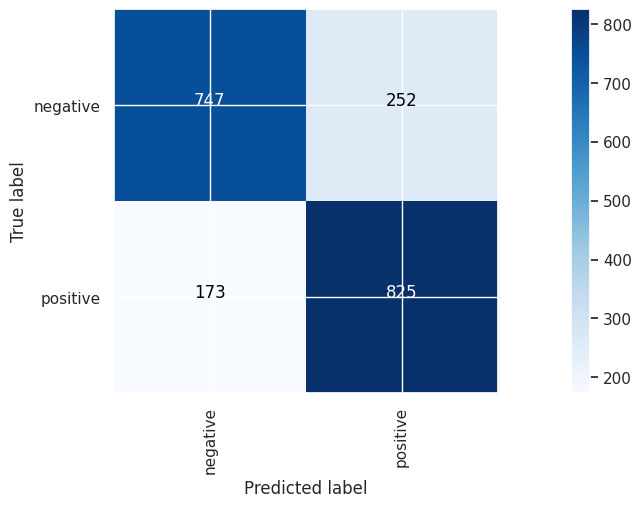

Final Accuracy
0.7871807711567351
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_37 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_68 (Conv1D)          (32, 4997, 32)            160       
                                                                 
 batch_normalization_22 (Ba  (32, 4997, 32)            128       
 tchNormalization)                                               
                                                                 
 activation_22 (Activation)  (32, 4997, 32)            0         
                                                                 
 max_pooling1d_67 (MaxPooli  (32, 999, 32)             0         
 ng1D)                                                           
                                                                 
 conv1d_69 (Conv1D)    

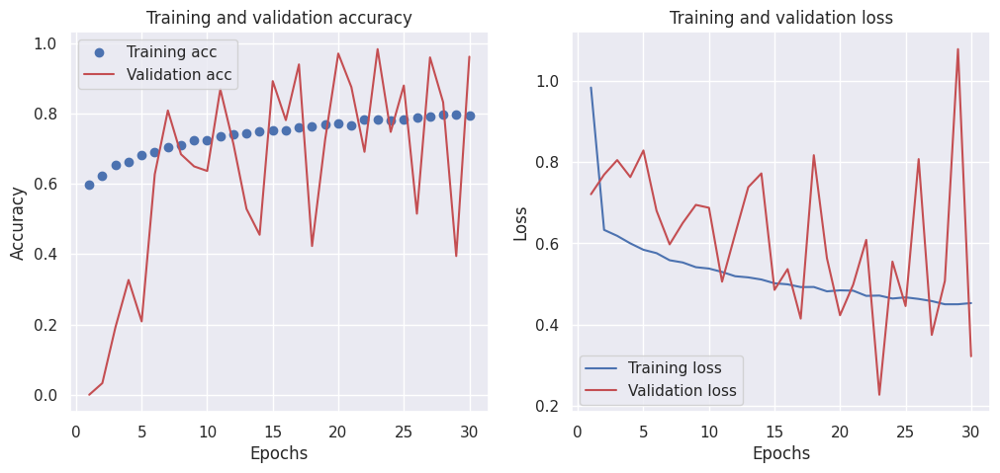

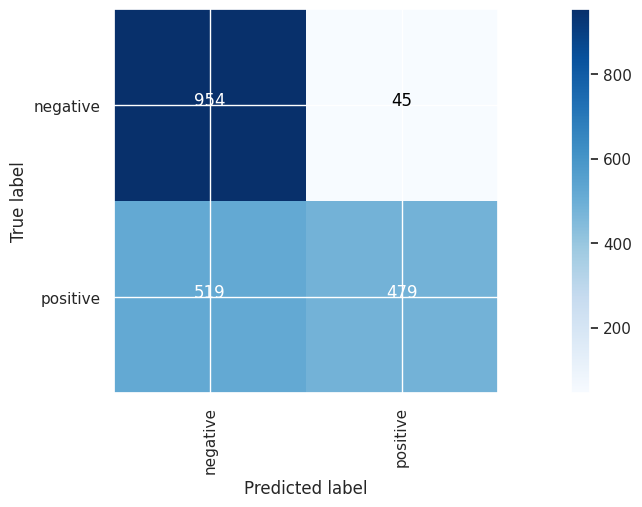

Final Accuracy
0.7175763645468203
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_38 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_70 (Conv1D)          (32, 4997, 32)            160       
                                                                 
 batch_normalization_24 (Ba  (32, 4997, 32)            128       
 tchNormalization)                                               
                                                                 
 activation_24 (Activation)  (32, 4997, 32)            0         
                                                                 
 max_pooling1d_69 (MaxPooli  (32, 999, 32)             0         
 ng1D)                                                           
                                                                 
 conv1d_71 (Conv1D)    

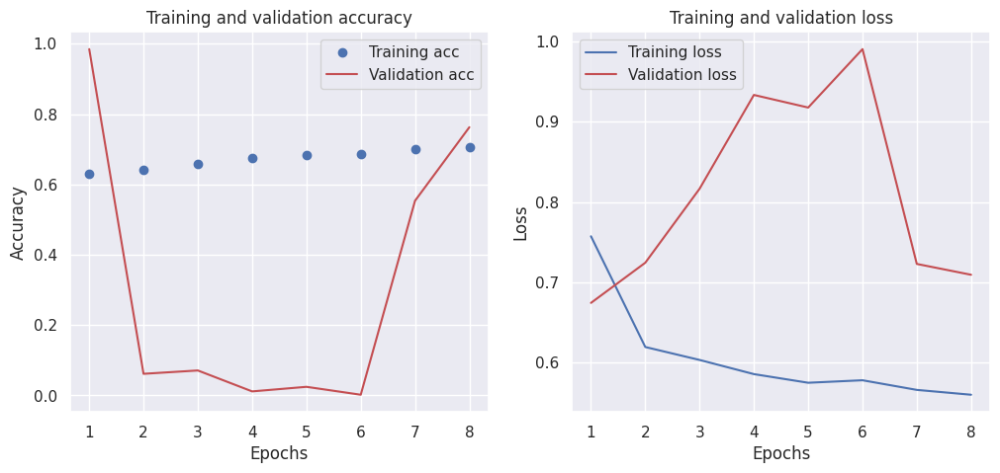

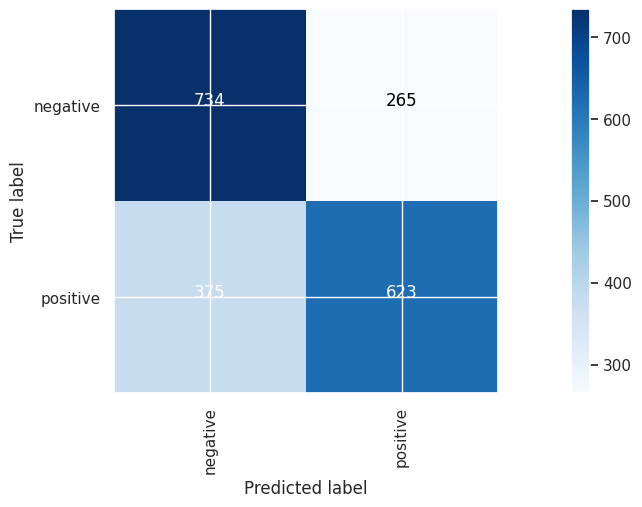

Final Accuracy
0.6795192789183776
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_39 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_10 (Embedding)    (32, 600, 50)             1488650   
                                                                 
 conv1d_72 (Conv1D)          (32, 597, 32)             6432      
                                                                 
 batch_normalization_26 (Ba  (32, 597, 32)             128       
 tchNormalization)                                               
                                                                 
 activation_26 (Activation)  (32, 597, 32)             0         
                                                                 
 max_pooling1d_71 (MaxPooli  (32, 119, 32)             0         
 ng1D)                 

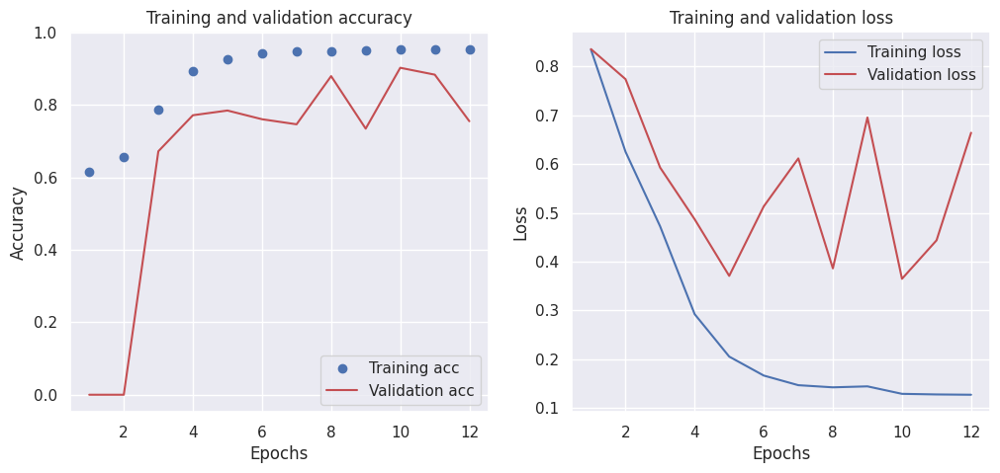

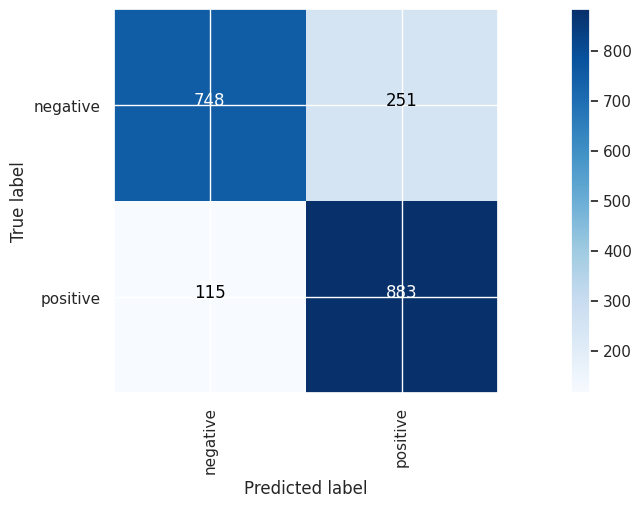

Final Accuracy
0.8167250876314471
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_40 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_11 (Embedding)    (32, 600, 50)             1488650   
                                                                 
 conv1d_74 (Conv1D)          (32, 597, 32)             6432      
                                                                 
 batch_normalization_28 (Ba  (32, 597, 32)             128       
 tchNormalization)                                               
                                                                 
 activation_28 (Activation)  (32, 597, 32)             0         
                                                                 
 max_pooling1d_73 (MaxPooli  (32, 119, 32)             0         
 ng1D)                 

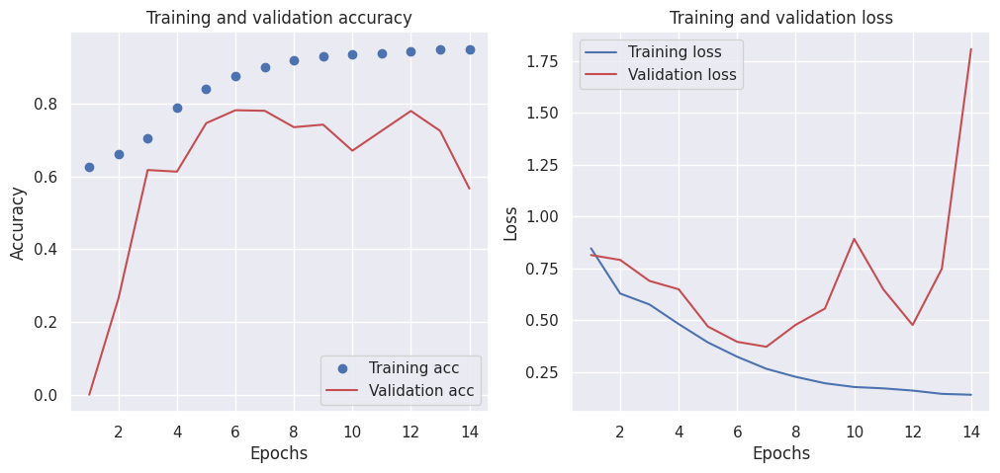

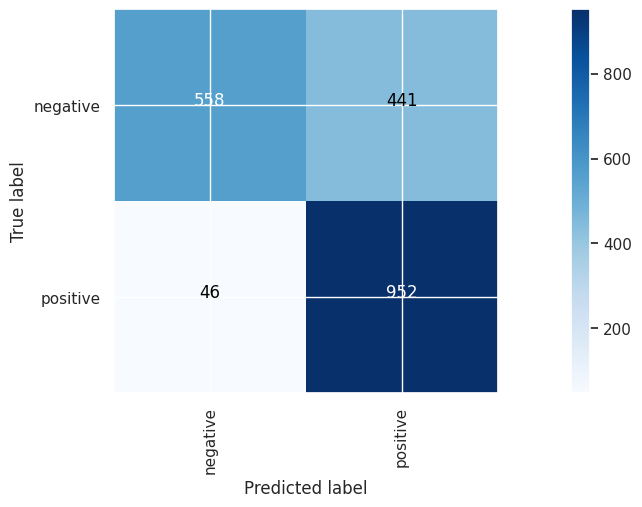

Final Accuracy
0.756134201301953


In [29]:
# VSM models
results = []
name = "Conv"
description =   """
                number_of_filters=[32,64], 
                kernel_sizes=[4,4], 
                pooling_size=5,
                batchnorm=True, 
                general_dropout=0.5, 
                extra_dense_layer_nn=64,  
                extra_dense_dropout=0.5
                """
description = description.replace('\t', '').replace('\n', '').replace(' ', '')

number_of_filters=[32,64]
kernel_sizes=[4,4]
pooling_size=5
batchnorm=True
general_dropout=0.5
extra_dense_layer_nn=64
extra_dense_dropout=0.5

# VSM models
results = []
for rep in vsm_model:
    build_exp02(name,
                description, 
                rep, 
                input_shape=(5000,1,),
                number_of_filters=number_of_filters,
                kernel_sizes=kernel_sizes,
                batchnorm=batchnorm,
                general_dropout=general_dropout,
                extra_dense_layer_nn=extra_dense_layer_nn,
                extra_dense_dropout=extra_dense_dropout
                )

# Embedding with padding
embedding = layers.Embedding(input_dim=vocab_size,
                     output_dim=emb_dim,
                     trainable=True,
                     input_length=embedding_padding["train_text_features"].shape[1])
build_exp02(name,
            description, 
            embedding_padding, 
            input_shape=(embedding_padding["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )

# GloVe
embedding = layers.Embedding(num_words,
                     emb_dim,
                     embeddings_initializer=Constant(embedding_glove["embedding_matrix"]),
                     trainable=True,
                     input_length=embedding_glove["train_text_features"].shape[1])

build_exp02(name,
            description, 
            embedding_glove, 
            input_shape=(embedding_glove["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )
partial = pd.DataFrame(results)
partial.to_csv("exp_02_6.csv", index=False)

Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_41 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_76 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 batch_normalization_30 (Ba  (32, 4997, 128)           512       
 tchNormalization)                                               
                                                                 
 activation_30 (Activation)  (32, 4997, 128)           0         
                                                                 
 max_pooling1d_75 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 dropout_24 (Dropout)        (32, 999, 128)            0 

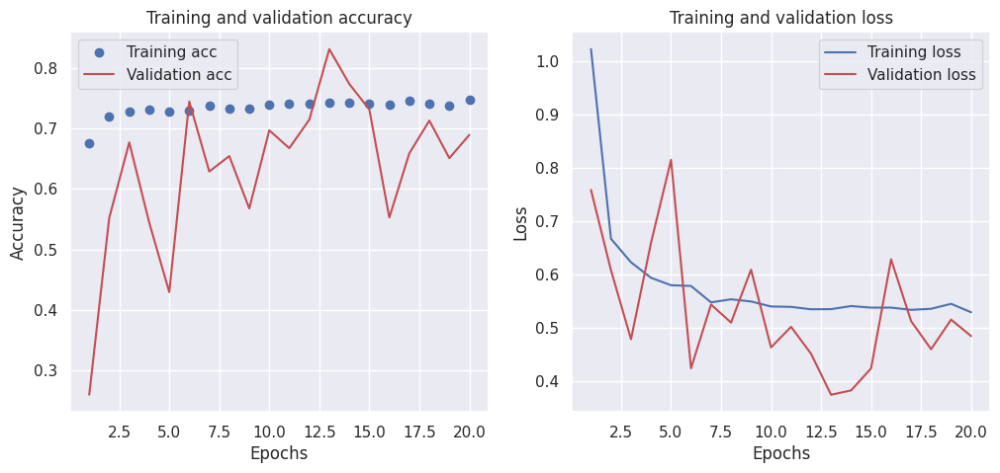

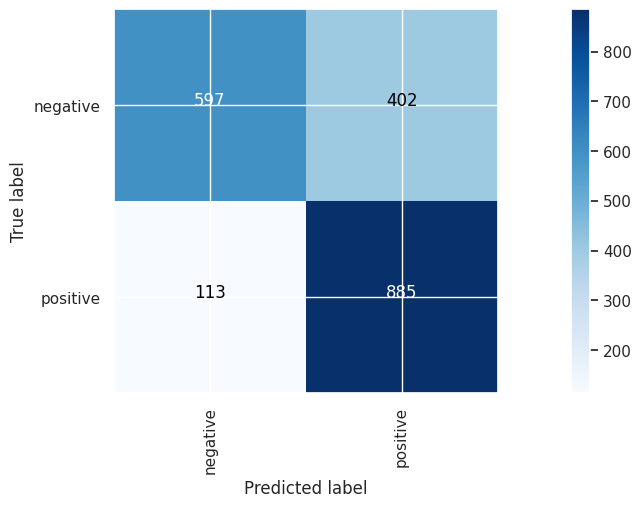

Final Accuracy
0.7421131697546319
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_42 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_77 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 batch_normalization_31 (Ba  (32, 4997, 128)           512       
 tchNormalization)                                               
                                                                 
 activation_31 (Activation)  (32, 4997, 128)           0         
                                                                 
 max_pooling1d_76 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 dropout_25 (Dropout)  

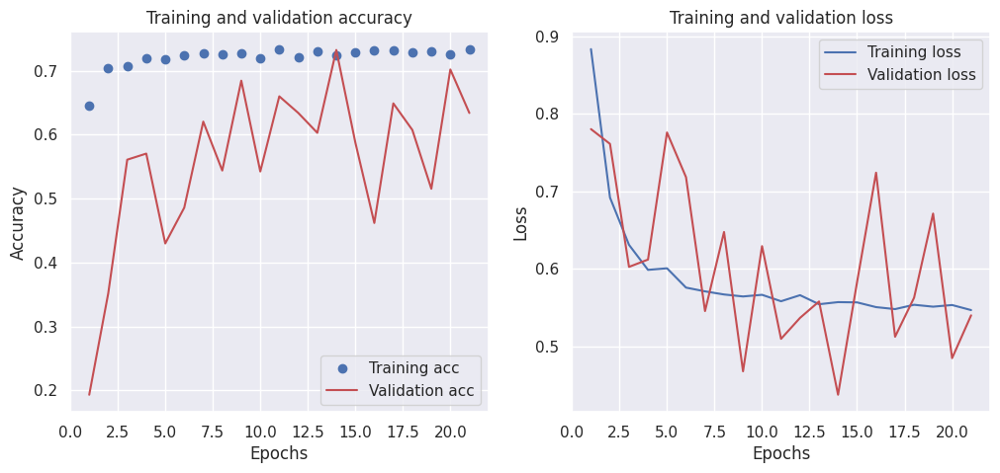

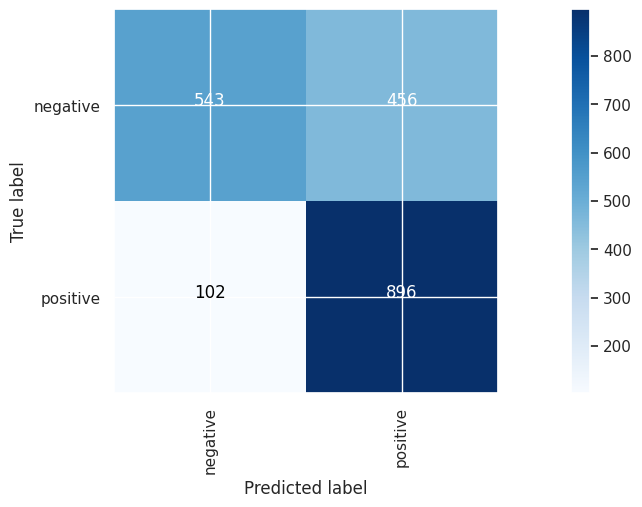

Final Accuracy
0.7205808713069605
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_43 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_78 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 batch_normalization_32 (Ba  (32, 4997, 128)           512       
 tchNormalization)                                               
                                                                 
 activation_32 (Activation)  (32, 4997, 128)           0         
                                                                 
 max_pooling1d_77 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 dropout_26 (Dropout)  

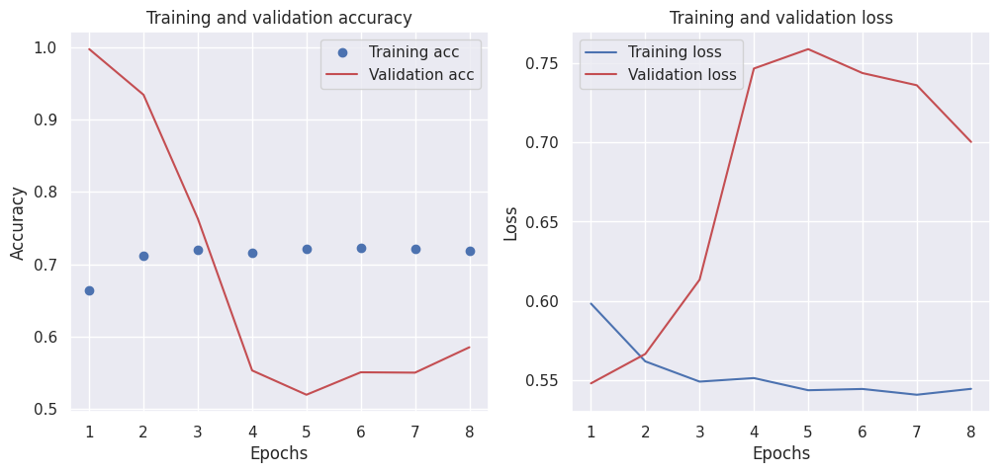

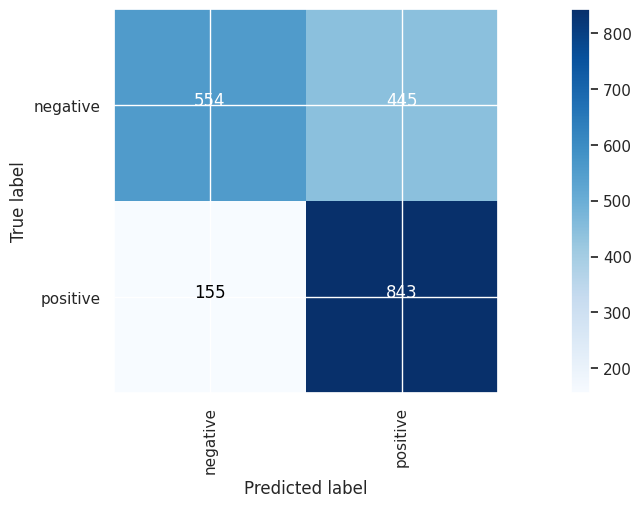

Final Accuracy
0.699549323985979
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_44 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_79 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 batch_normalization_33 (Ba  (32, 4997, 128)           512       
 tchNormalization)                                               
                                                                 
 activation_33 (Activation)  (32, 4997, 128)           0         
                                                                 
 max_pooling1d_78 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 dropout_27 (Dropout)   

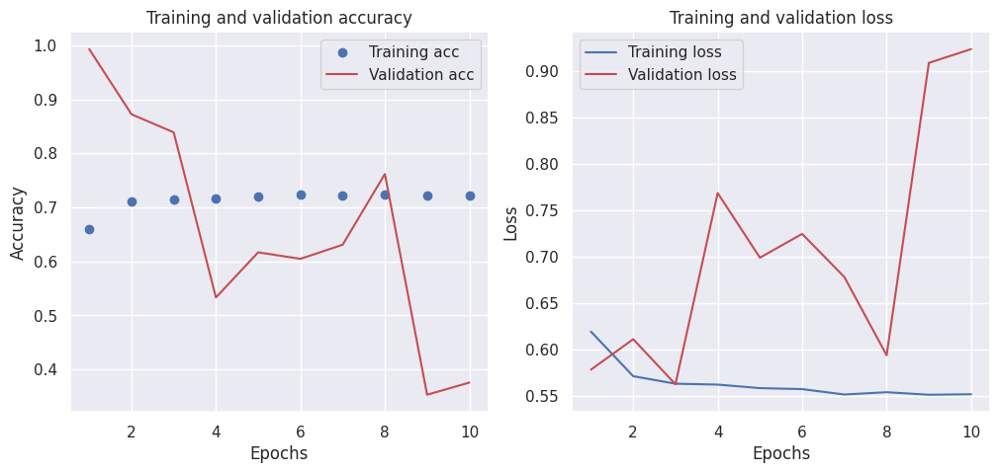

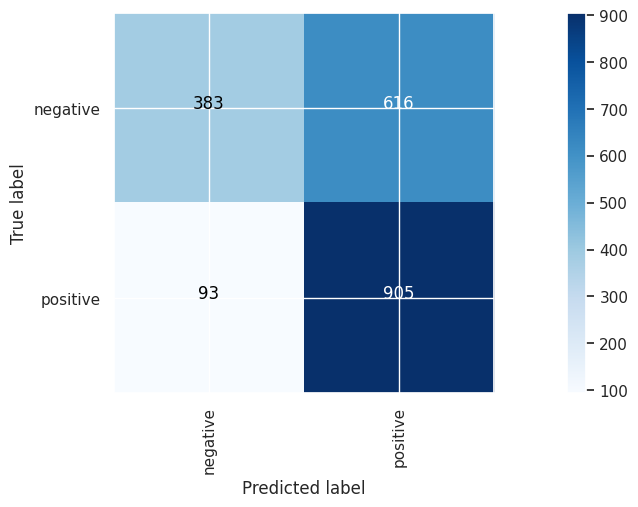

Final Accuracy
0.6449674511767651
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_45 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_12 (Embedding)    (32, 600, 50)             1488650   
                                                                 
 conv1d_80 (Conv1D)          (32, 597, 128)            25728     
                                                                 
 batch_normalization_34 (Ba  (32, 597, 128)            512       
 tchNormalization)                                               
                                                                 
 activation_34 (Activation)  (32, 597, 128)            0         
                                                                 
 max_pooling1d_79 (MaxPooli  (32, 119, 128)            0         
 ng1D)                 

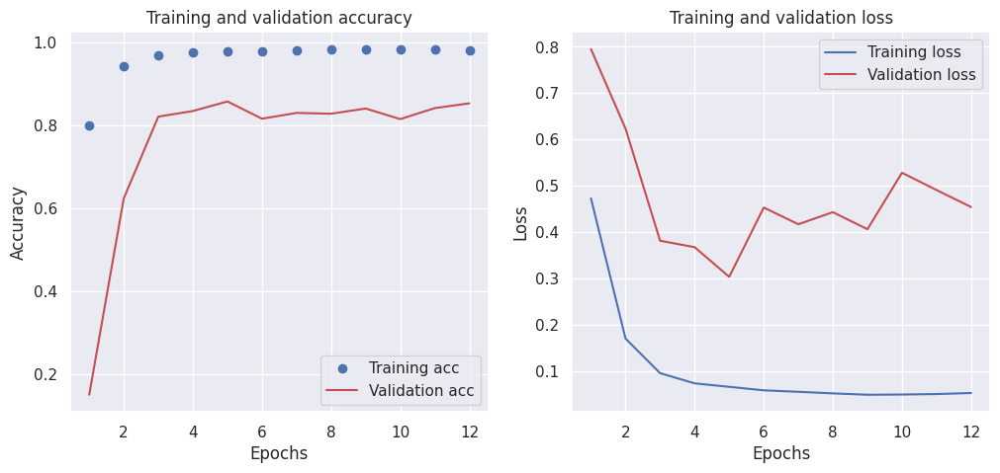

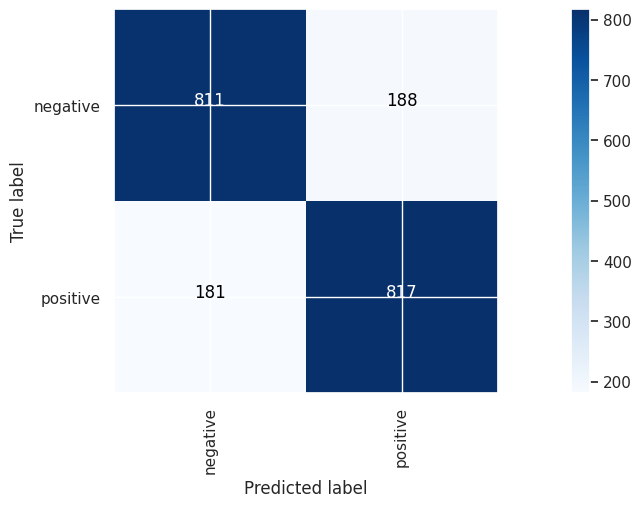

Final Accuracy
0.8152228342513771
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_46 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_13 (Embedding)    (32, 600, 50)             1488650   
                                                                 
 conv1d_81 (Conv1D)          (32, 597, 128)            25728     
                                                                 
 batch_normalization_35 (Ba  (32, 597, 128)            512       
 tchNormalization)                                               
                                                                 
 activation_35 (Activation)  (32, 597, 128)            0         
                                                                 
 max_pooling1d_80 (MaxPooli  (32, 119, 128)            0         
 ng1D)                 

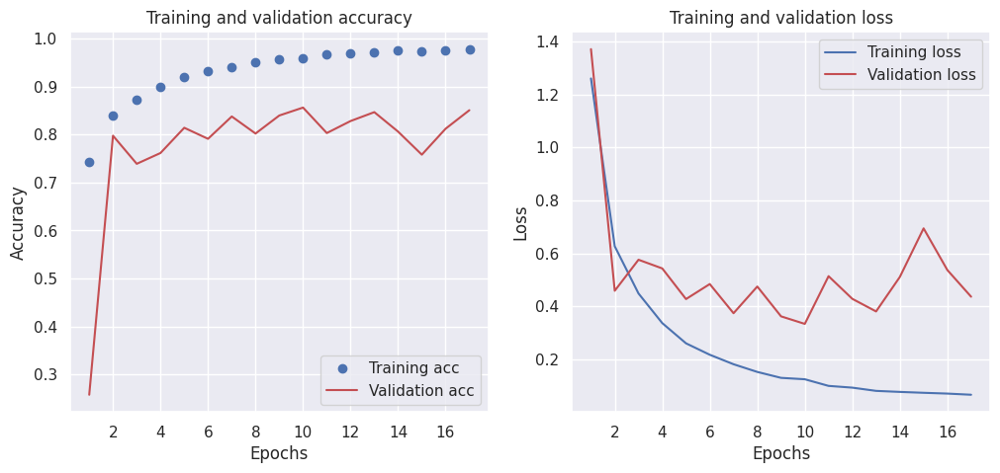

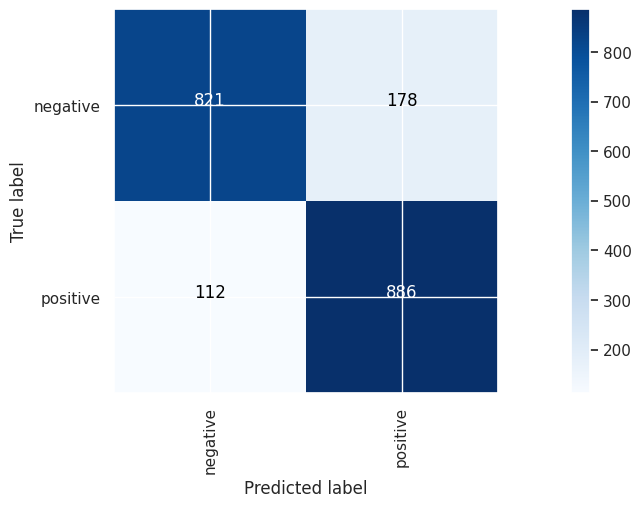

Final Accuracy
0.8547821732598898


In [31]:
# VSM models
results = []
name = "Conv"
description =   """
                number_of_filters=[128], 
                kernel_sizes=[4], 
                pooling_size=5,
                batchnorm=True, 
                general_dropout=0.5, 
                extra_dense_layer_nn=0,  
                extra_dense_dropout=0.0
                """
description = description.replace('\t', '').replace('\n', '').replace(' ', '')

number_of_filters=[128]
kernel_sizes=[4]
pooling_size=5
batchnorm=True
general_dropout=0.5
extra_dense_layer_nn=0
extra_dense_dropout=0.0

# VSM models
results = []
for rep in vsm_model:
    build_exp02(name,
                description, 
                rep, 
                input_shape=(5000,1,),
                number_of_filters=number_of_filters,
                kernel_sizes=kernel_sizes,
                batchnorm=batchnorm,
                general_dropout=general_dropout,
                extra_dense_layer_nn=extra_dense_layer_nn,
                extra_dense_dropout=extra_dense_dropout
                )

# Embedding with padding
embedding = layers.Embedding(input_dim=vocab_size,
                     output_dim=emb_dim,
                     trainable=True,
                     input_length=embedding_padding["train_text_features"].shape[1])
build_exp02(name,
            description, 
            embedding_padding, 
            input_shape=(embedding_padding["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )

# GloVe
embedding = layers.Embedding(num_words,
                     emb_dim,
                     embeddings_initializer=Constant(embedding_glove["embedding_matrix"]),
                     trainable=True,
                     input_length=embedding_glove["train_text_features"].shape[1])

build_exp02(name,
            description, 
            embedding_glove, 
            input_shape=(embedding_glove["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )
partial = pd.DataFrame(results)
partial.to_csv("exp_02_7.csv", index=False)

Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_47 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_82 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 max_pooling1d_81 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 dropout_30 (Dropout)        (32, 999, 128)            0         
                                                                 
 global_max_pooling1d_45 (G  (32, 128)                 0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_51 (Dense)            (32, 2)                   25

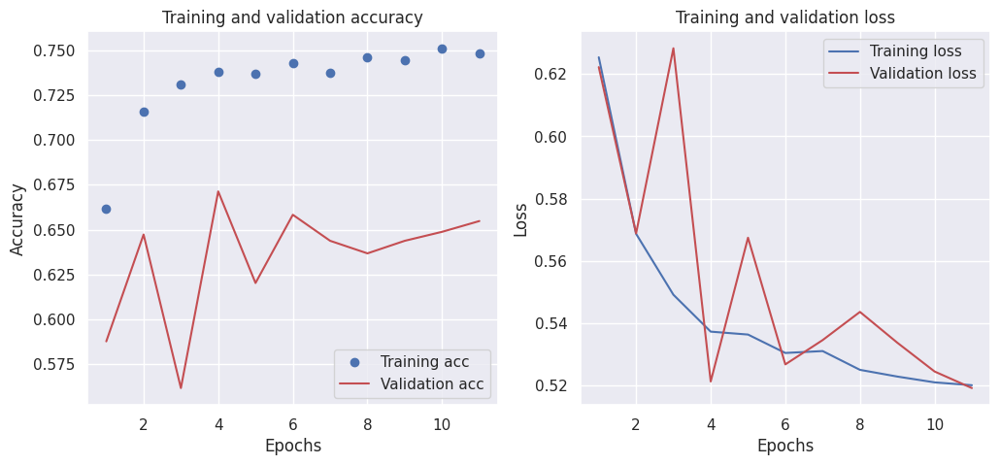

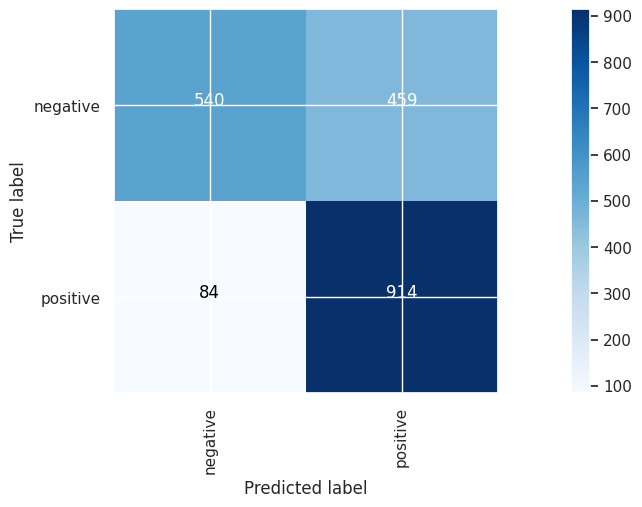

Final Accuracy
0.728092138207311
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_48 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_83 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 max_pooling1d_82 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 dropout_31 (Dropout)        (32, 999, 128)            0         
                                                                 
 global_max_pooling1d_46 (G  (32, 128)                 0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_52 (Dense)       

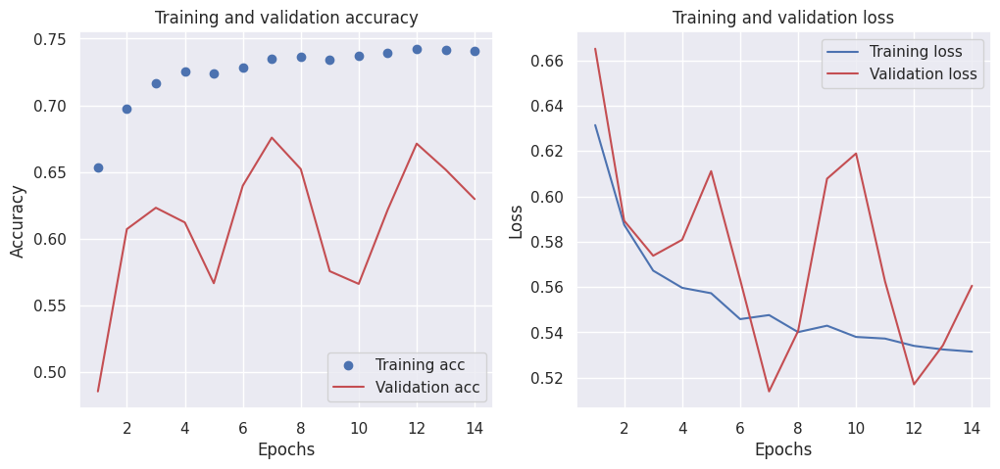

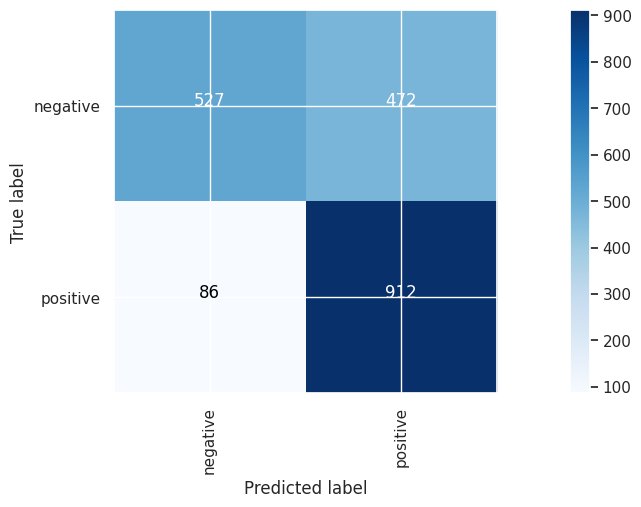

Final Accuracy
0.7205808713069605
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_49 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_84 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 max_pooling1d_83 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 dropout_32 (Dropout)        (32, 999, 128)            0         
                                                                 
 global_max_pooling1d_47 (G  (32, 128)                 0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_53 (Dense)      

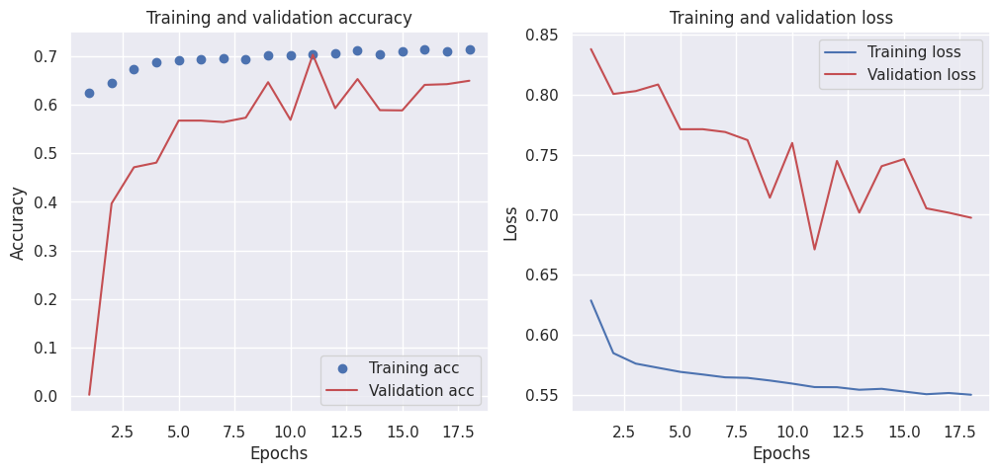

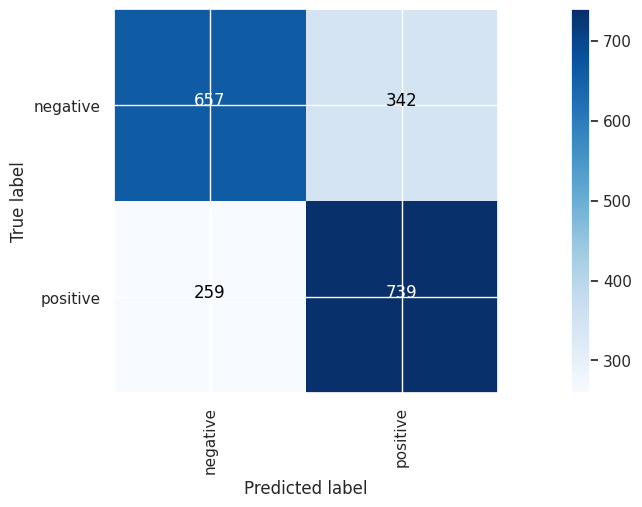

Final Accuracy
0.6990485728592889
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_50 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_85 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 max_pooling1d_84 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 dropout_33 (Dropout)        (32, 999, 128)            0         
                                                                 
 global_max_pooling1d_48 (G  (32, 128)                 0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_54 (Dense)      

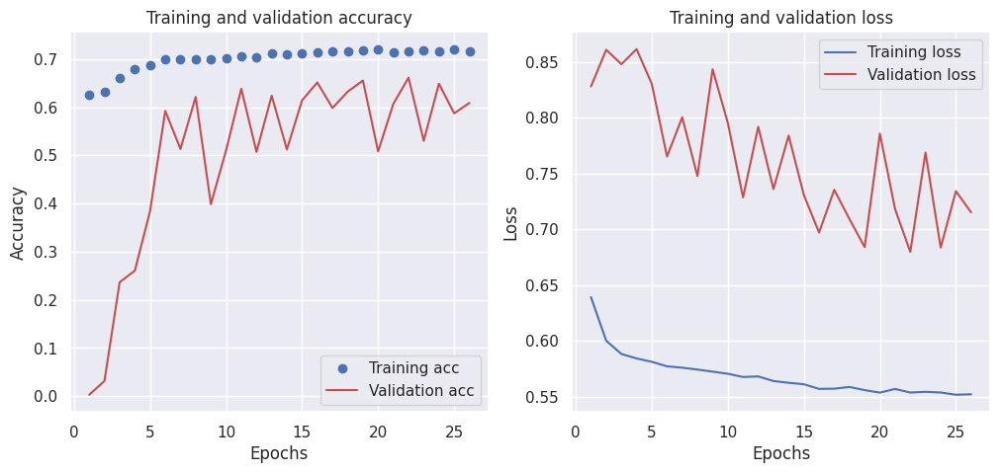

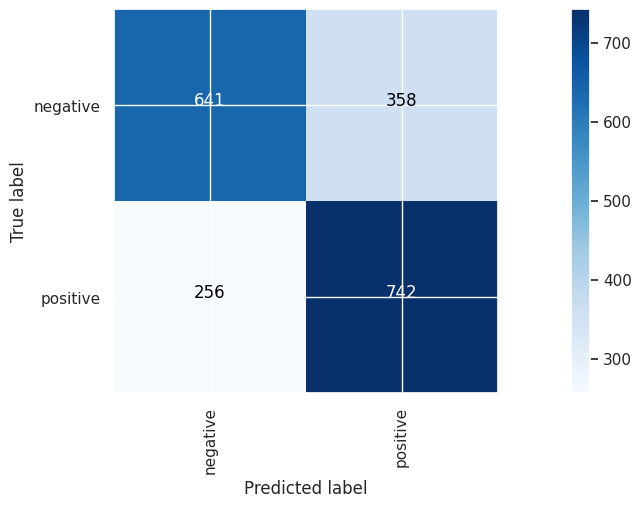

Final Accuracy
0.6925388082123185
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_51 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_14 (Embedding)    (32, 600, 50)             1488650   
                                                                 
 conv1d_86 (Conv1D)          (32, 597, 128)            25728     
                                                                 
 max_pooling1d_85 (MaxPooli  (32, 119, 128)            0         
 ng1D)                                                           
                                                                 
 dropout_34 (Dropout)        (32, 119, 128)            0         
                                                                 
 global_max_pooling1d_49 (G  (32, 128)                 0         
 lobalMaxPooling1D)    

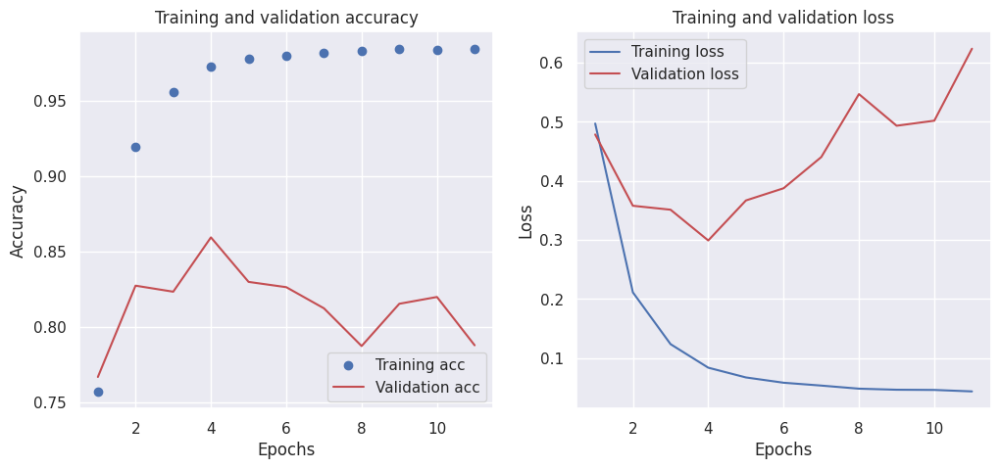

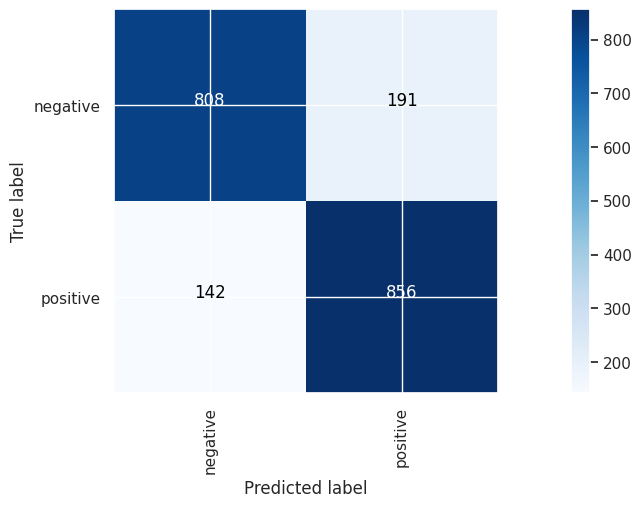

Final Accuracy
0.8332498748122183
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_52 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_15 (Embedding)    (32, 600, 50)             1488650   
                                                                 
 conv1d_87 (Conv1D)          (32, 597, 128)            25728     
                                                                 
 max_pooling1d_86 (MaxPooli  (32, 119, 128)            0         
 ng1D)                                                           
                                                                 
 dropout_35 (Dropout)        (32, 119, 128)            0         
                                                                 
 global_max_pooling1d_50 (G  (32, 128)                 0         
 lobalMaxPooling1D)    

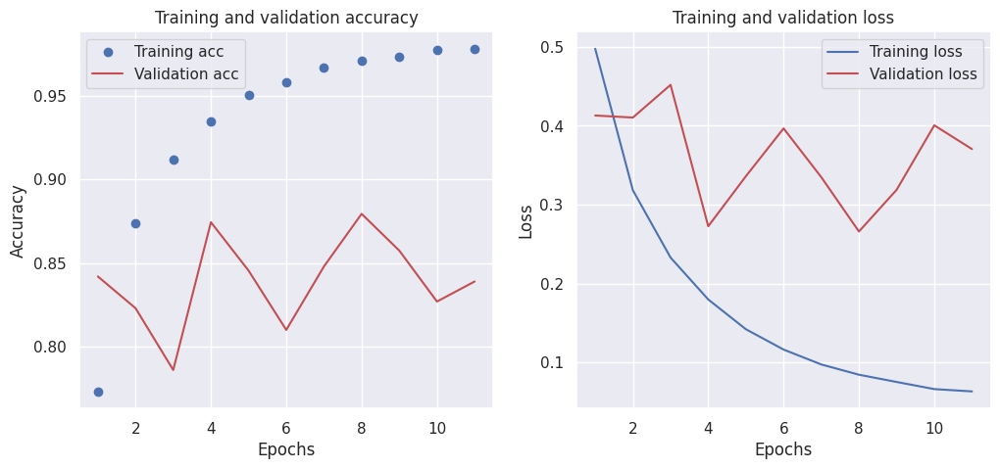

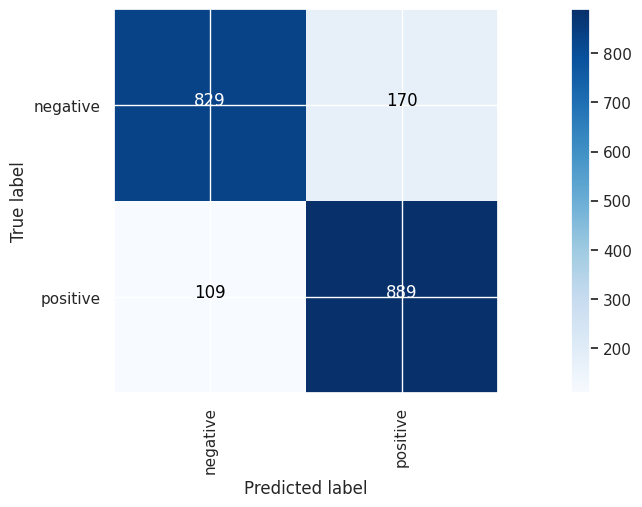

Final Accuracy
0.8602904356534802


In [32]:
# VSM models
results = []
name = "Conv"
description =   """
                number_of_filters=[128], 
                kernel_sizes=[4], 
                pooling_size=5,
                batchnorm=False, 
                general_dropout=0.5, 
                extra_dense_layer_nn=0,  
                extra_dense_dropout=0.0
                """
description = description.replace('\t', '').replace('\n', '').replace(' ', '')

number_of_filters=[128]
kernel_sizes=[4]
pooling_size=5
batchnorm=False
general_dropout=0.5
extra_dense_layer_nn=0
extra_dense_dropout=0.0

# VSM models
results = []
for rep in vsm_model:
    build_exp02(name,
                description, 
                rep, 
                input_shape=(5000,1,),
                number_of_filters=number_of_filters,
                kernel_sizes=kernel_sizes,
                batchnorm=batchnorm,
                general_dropout=general_dropout,
                extra_dense_layer_nn=extra_dense_layer_nn,
                extra_dense_dropout=extra_dense_dropout
                )

# Embedding with padding
embedding = layers.Embedding(input_dim=vocab_size,
                     output_dim=emb_dim,
                     trainable=True,
                     input_length=embedding_padding["train_text_features"].shape[1])
build_exp02(name,
            description, 
            embedding_padding, 
            input_shape=(embedding_padding["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )

# GloVe
embedding = layers.Embedding(num_words,
                     emb_dim,
                     embeddings_initializer=Constant(embedding_glove["embedding_matrix"]),
                     trainable=True,
                     input_length=embedding_glove["train_text_features"].shape[1])

build_exp02(name,
            description, 
            embedding_glove, 
            input_shape=(embedding_glove["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )
partial = pd.DataFrame(results)
partial.to_csv("exp_02_8.csv", index=False)

Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_53 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_88 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 batch_normalization_36 (Ba  (32, 4997, 128)           512       
 tchNormalization)                                               
                                                                 
 activation_36 (Activation)  (32, 4997, 128)           0         
                                                                 
 max_pooling1d_87 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 dropout_36 (Dropout)        (32, 999, 128)            0 

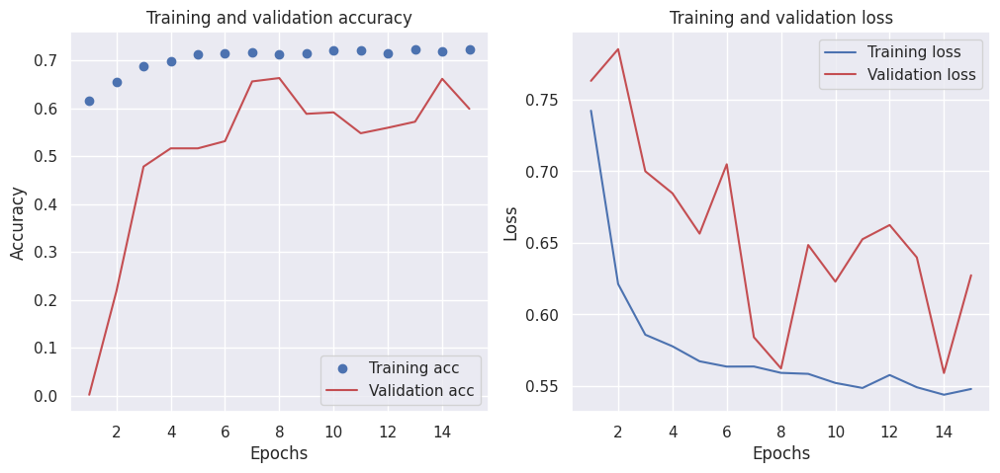

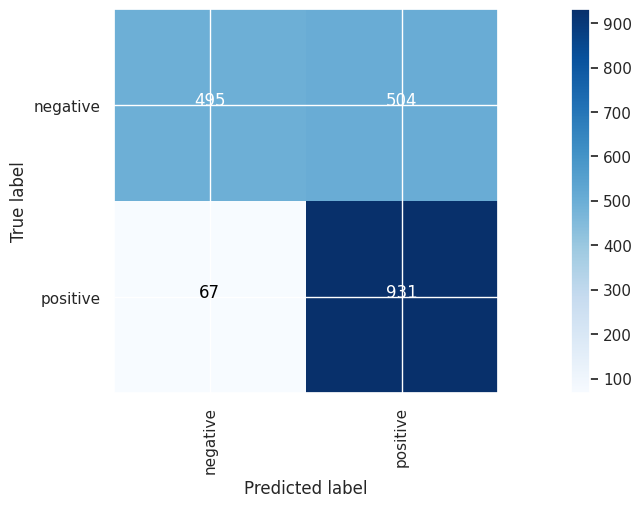

Final Accuracy
0.71407110665999
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_54 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_89 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 batch_normalization_37 (Ba  (32, 4997, 128)           512       
 tchNormalization)                                               
                                                                 
 activation_37 (Activation)  (32, 4997, 128)           0         
                                                                 
 max_pooling1d_88 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 dropout_38 (Dropout)    

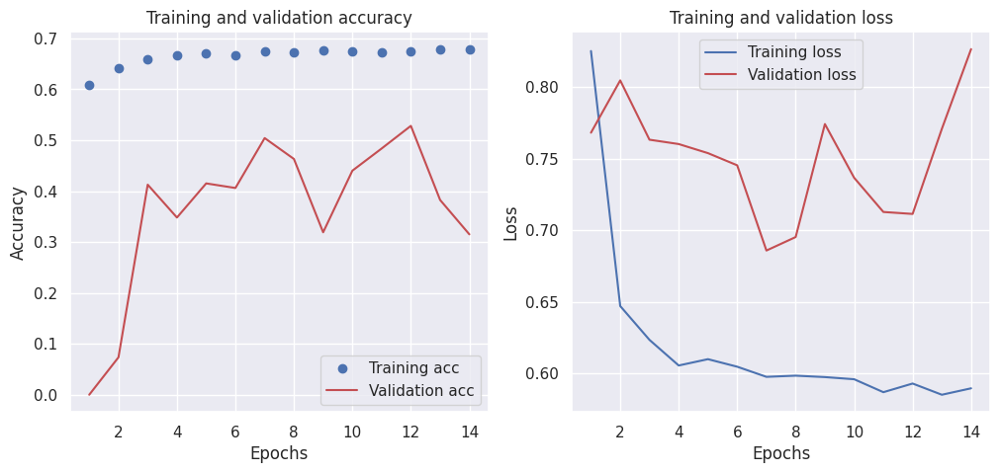

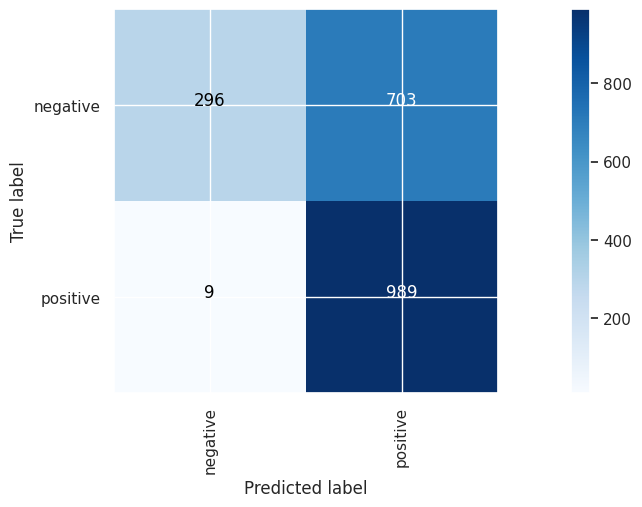

Final Accuracy
0.6434651977966951
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_55 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_90 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 batch_normalization_38 (Ba  (32, 4997, 128)           512       
 tchNormalization)                                               
                                                                 
 activation_38 (Activation)  (32, 4997, 128)           0         
                                                                 
 max_pooling1d_89 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 dropout_40 (Dropout)  

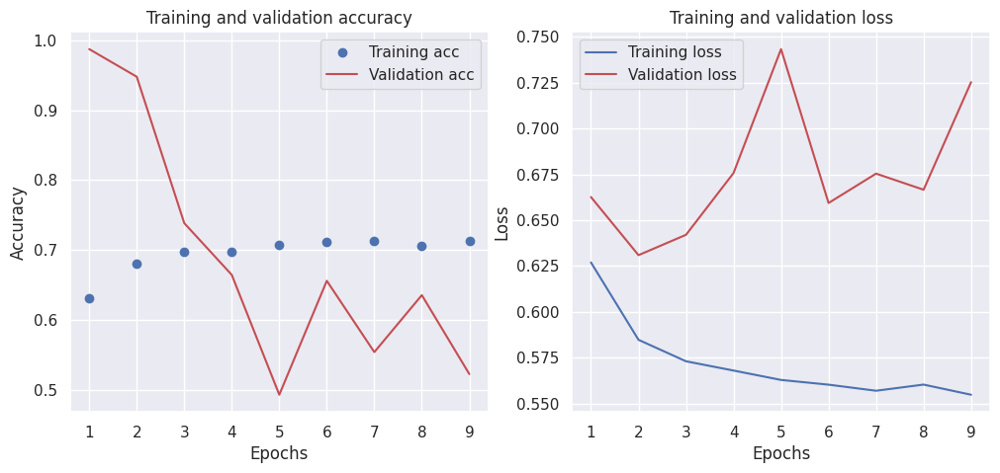

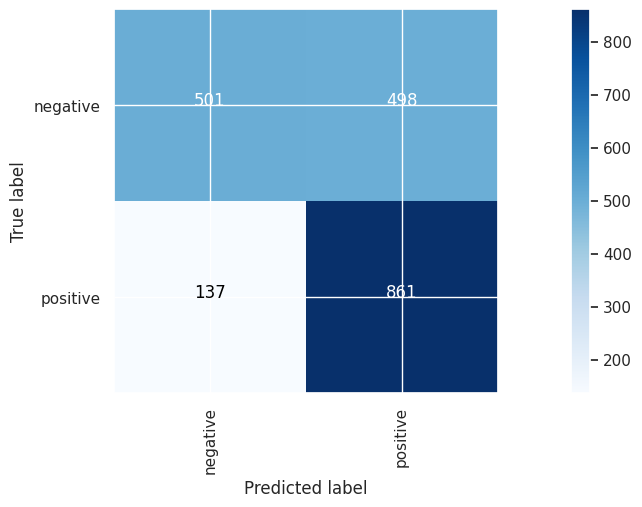

Final Accuracy
0.6820230345518278
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_56 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_91 (Conv1D)          (32, 4997, 128)           640       
                                                                 
 batch_normalization_39 (Ba  (32, 4997, 128)           512       
 tchNormalization)                                               
                                                                 
 activation_39 (Activation)  (32, 4997, 128)           0         
                                                                 
 max_pooling1d_90 (MaxPooli  (32, 999, 128)            0         
 ng1D)                                                           
                                                                 
 dropout_42 (Dropout)  

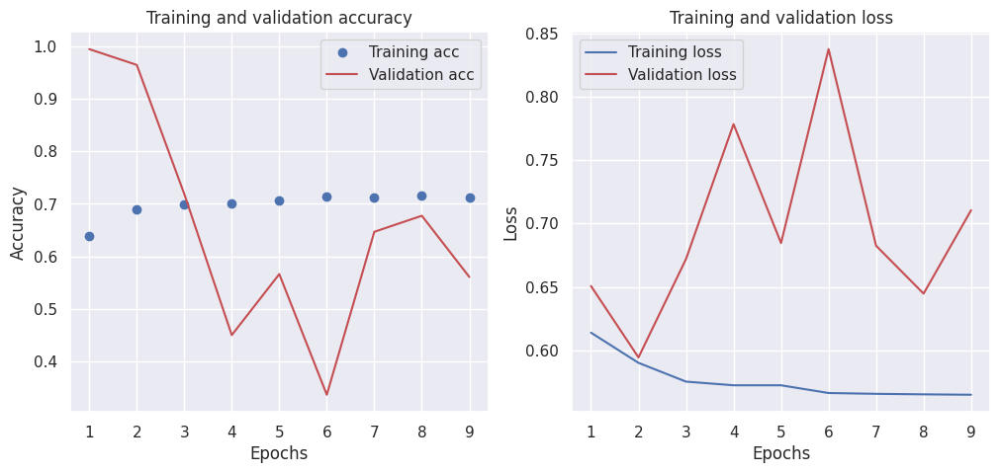

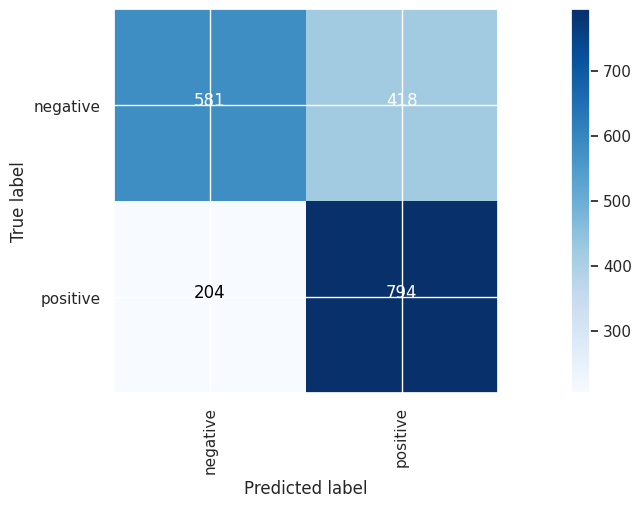

Final Accuracy
0.6885327991987982
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_57 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_16 (Embedding)    (32, 600, 50)             1488650   
                                                                 
 conv1d_92 (Conv1D)          (32, 597, 128)            25728     
                                                                 
 batch_normalization_40 (Ba  (32, 597, 128)            512       
 tchNormalization)                                               
                                                                 
 activation_40 (Activation)  (32, 597, 128)            0         
                                                                 
 max_pooling1d_91 (MaxPooli  (32, 119, 128)            0         
 ng1D)                 

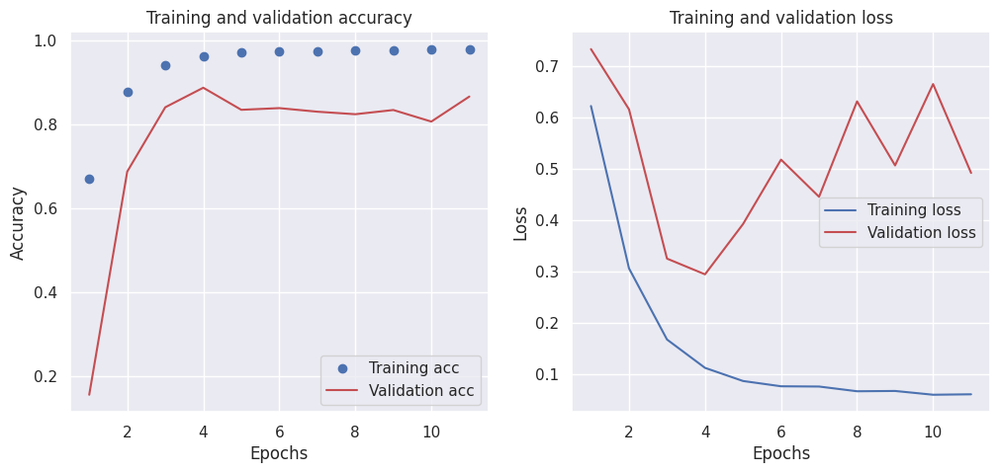

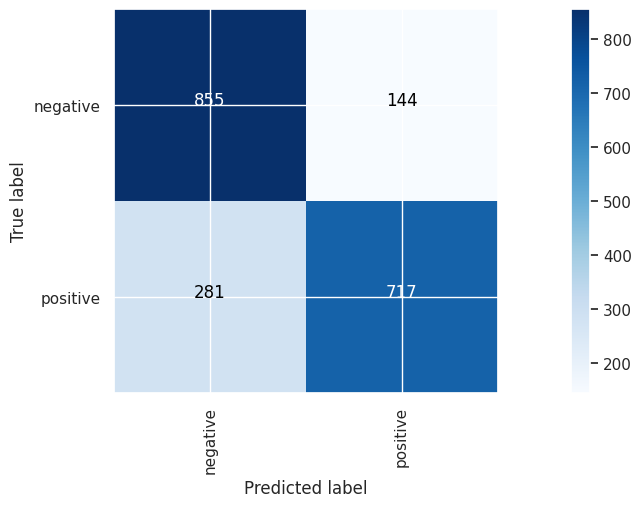

Final Accuracy
0.7871807711567351
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_58 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_17 (Embedding)    (32, 600, 50)             1488650   
                                                                 
 conv1d_93 (Conv1D)          (32, 597, 128)            25728     
                                                                 
 batch_normalization_41 (Ba  (32, 597, 128)            512       
 tchNormalization)                                               
                                                                 
 activation_41 (Activation)  (32, 597, 128)            0         
                                                                 
 max_pooling1d_92 (MaxPooli  (32, 119, 128)            0         
 ng1D)                 

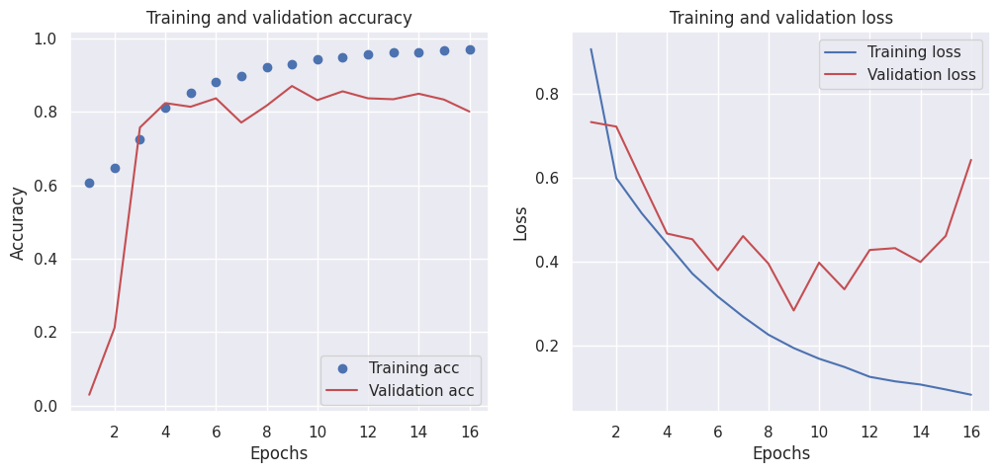

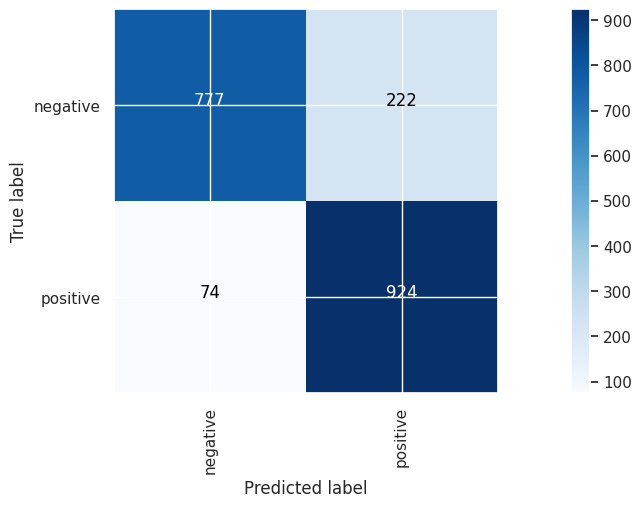

Final Accuracy
0.8517776664997496


In [33]:
# VSM models
results = []
name = "Conv"
description =   """
                number_of_filters=[128], 
                kernel_sizes=[4], 
                pooling_size=5,
                batchnorm=True, 
                general_dropout=0.5, 
                extra_dense_layer_nn=64,  
                extra_dense_dropout=0.5
                """
description = description.replace('\t', '').replace('\n', '').replace(' ', '')

number_of_filters=[128]
kernel_sizes=[4]
pooling_size=5
batchnorm=True
general_dropout=0.5
extra_dense_layer_nn=64
extra_dense_dropout=0.5

# VSM models
results = []
for rep in vsm_model:
    build_exp02(name,
                description, 
                rep, 
                input_shape=(5000,1,),
                number_of_filters=number_of_filters,
                kernel_sizes=kernel_sizes,
                batchnorm=batchnorm,
                general_dropout=general_dropout,
                extra_dense_layer_nn=extra_dense_layer_nn,
                extra_dense_dropout=extra_dense_dropout
                )

# Embedding with padding
embedding = layers.Embedding(input_dim=vocab_size,
                     output_dim=emb_dim,
                     trainable=True,
                     input_length=embedding_padding["train_text_features"].shape[1])
build_exp02(name,
            description, 
            embedding_padding, 
            input_shape=(embedding_padding["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )

# GloVe
embedding = layers.Embedding(num_words,
                     emb_dim,
                     embeddings_initializer=Constant(embedding_glove["embedding_matrix"]),
                     trainable=True,
                     input_length=embedding_glove["train_text_features"].shape[1])

build_exp02(name,
            description, 
            embedding_glove, 
            input_shape=(embedding_glove["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )
partial = pd.DataFrame(results)
partial.to_csv("exp_02_9.csv", index=False)

Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_59 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_94 (Conv1D)          (32, 4997, 64)            320       
                                                                 
 batch_normalization_42 (Ba  (32, 4997, 64)            256       
 tchNormalization)                                               
                                                                 
 activation_42 (Activation)  (32, 4997, 64)            0         
                                                                 
 max_pooling1d_93 (MaxPooli  (32, 999, 64)             0         
 ng1D)                                                           
                                                                 
 dropout_48 (Dropout)        (32, 999, 64)             0 

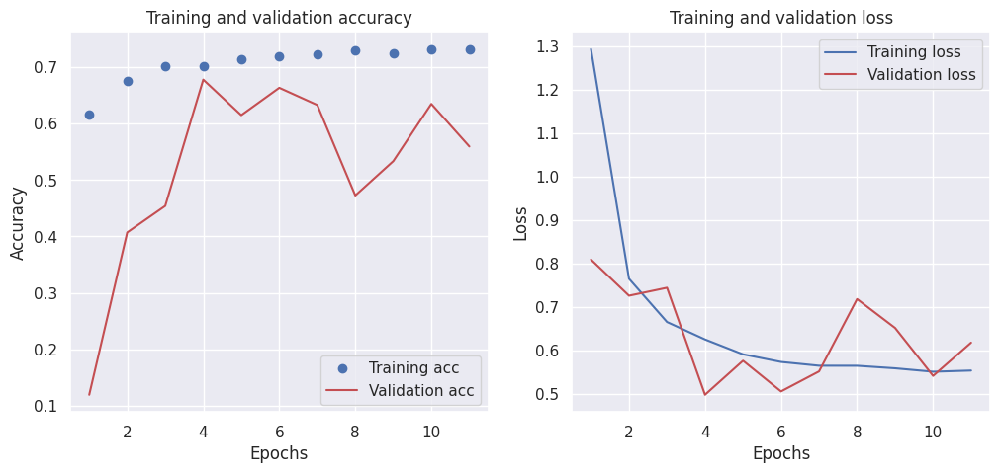

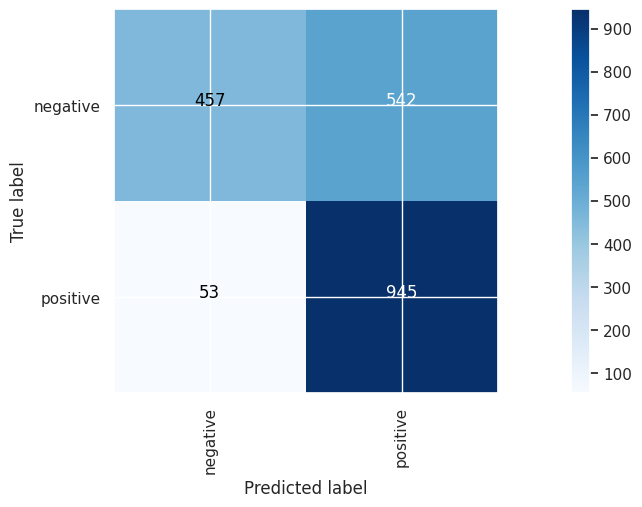

Final Accuracy
0.7020530796194292
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_60 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_95 (Conv1D)          (32, 4997, 64)            320       
                                                                 
 batch_normalization_43 (Ba  (32, 4997, 64)            256       
 tchNormalization)                                               
                                                                 
 activation_43 (Activation)  (32, 4997, 64)            0         
                                                                 
 max_pooling1d_94 (MaxPooli  (32, 999, 64)             0         
 ng1D)                                                           
                                                                 
 dropout_49 (Dropout)  

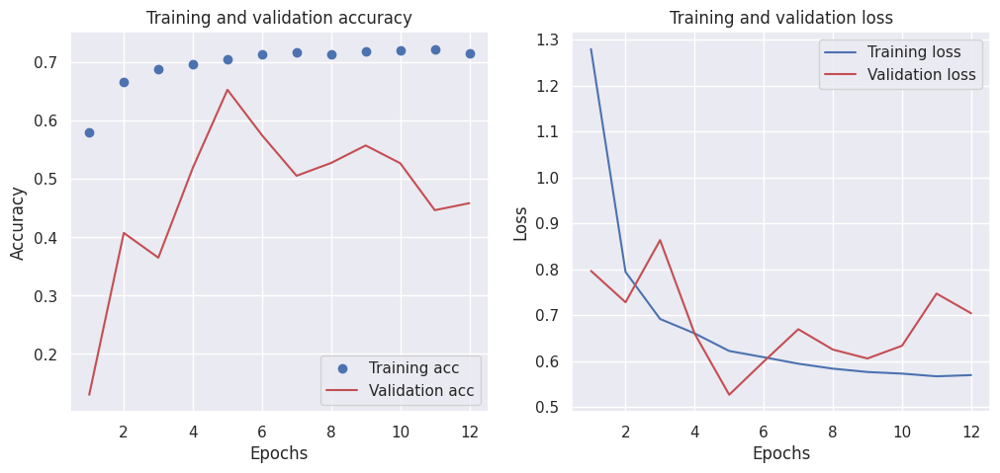

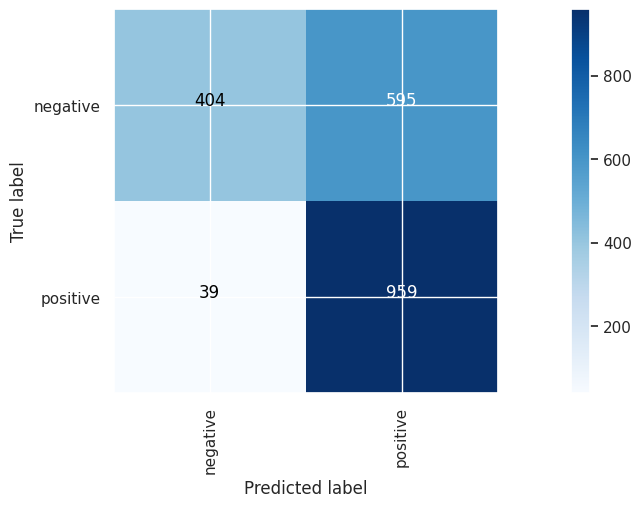

Final Accuracy
0.6825237856785178
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_61 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_96 (Conv1D)          (32, 4997, 64)            320       
                                                                 
 batch_normalization_44 (Ba  (32, 4997, 64)            256       
 tchNormalization)                                               
                                                                 
 activation_44 (Activation)  (32, 4997, 64)            0         
                                                                 
 max_pooling1d_95 (MaxPooli  (32, 999, 64)             0         
 ng1D)                                                           
                                                                 
 dropout_50 (Dropout)  

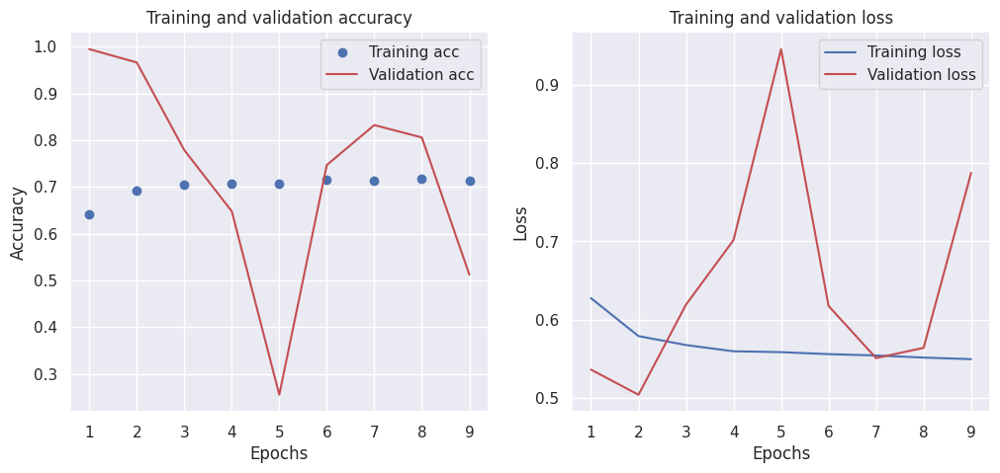

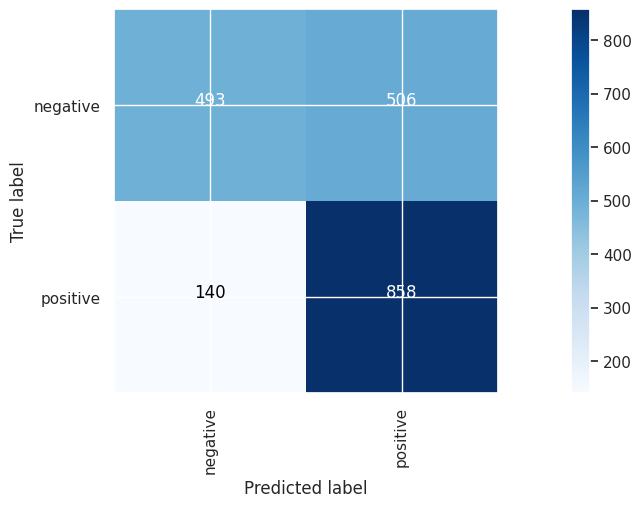

Final Accuracy
0.6765147721582374
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_62 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_97 (Conv1D)          (32, 4997, 64)            320       
                                                                 
 batch_normalization_45 (Ba  (32, 4997, 64)            256       
 tchNormalization)                                               
                                                                 
 activation_45 (Activation)  (32, 4997, 64)            0         
                                                                 
 max_pooling1d_96 (MaxPooli  (32, 999, 64)             0         
 ng1D)                                                           
                                                                 
 dropout_51 (Dropout)  

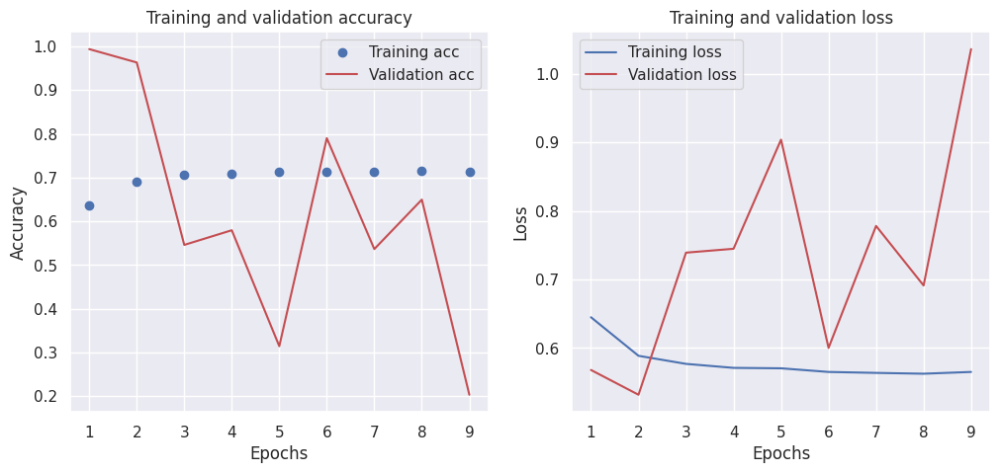

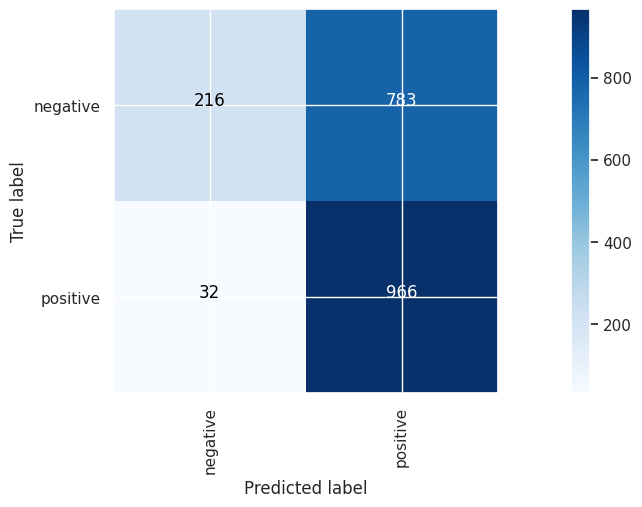

Final Accuracy
0.5918878317476214
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_63 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_18 (Embedding)    (32, 600, 50)             1488650   
                                                                 
 conv1d_98 (Conv1D)          (32, 597, 64)             12864     
                                                                 
 batch_normalization_46 (Ba  (32, 597, 64)             256       
 tchNormalization)                                               
                                                                 
 activation_46 (Activation)  (32, 597, 64)             0         
                                                                 
 max_pooling1d_97 (MaxPooli  (32, 119, 64)             0         
 ng1D)                 

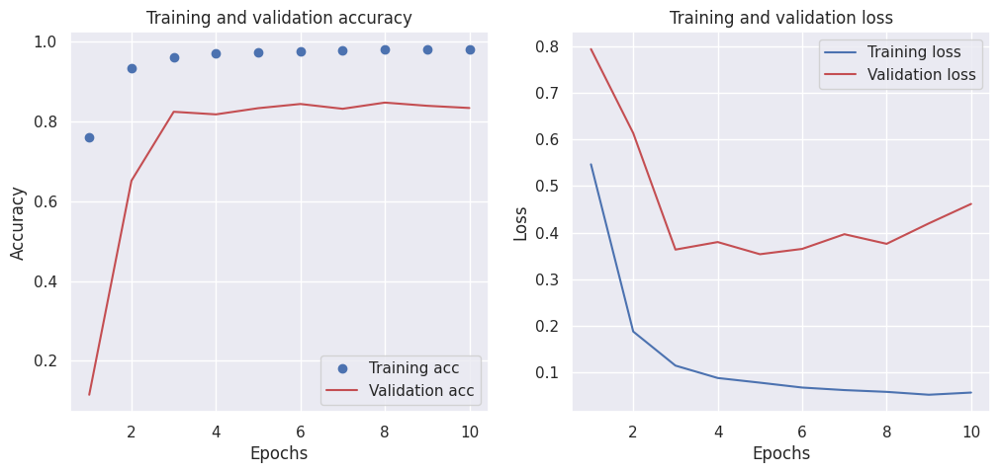

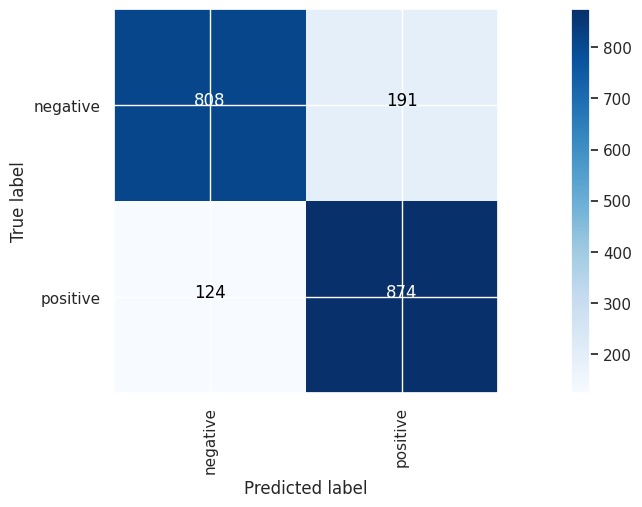

Final Accuracy
0.8422633950926389
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_64 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_19 (Embedding)    (32, 600, 50)             1488650   
                                                                 
 conv1d_99 (Conv1D)          (32, 597, 64)             12864     
                                                                 
 batch_normalization_47 (Ba  (32, 597, 64)             256       
 tchNormalization)                                               
                                                                 
 activation_47 (Activation)  (32, 597, 64)             0         
                                                                 
 max_pooling1d_98 (MaxPooli  (32, 119, 64)             0         
 ng1D)                 

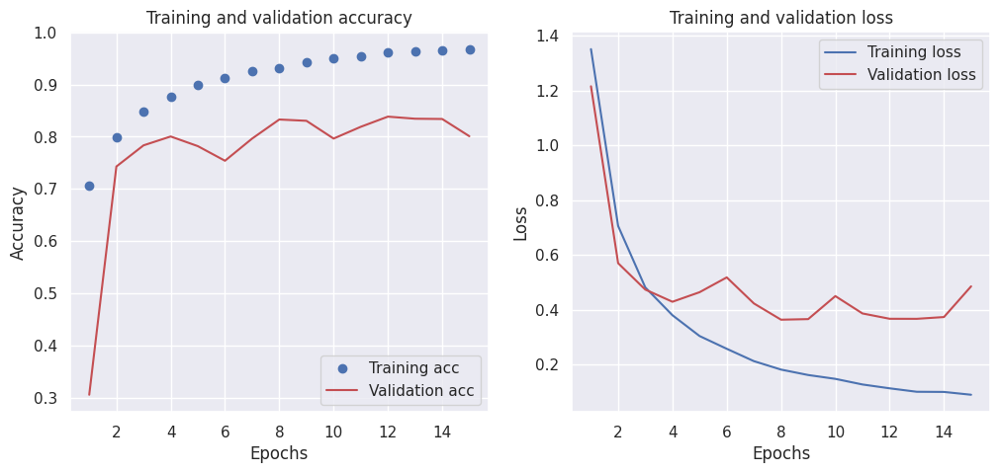

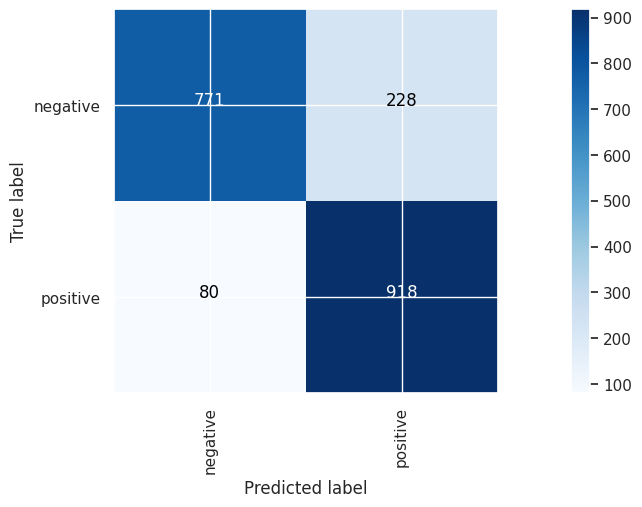

Final Accuracy
0.8457686529794692


In [34]:
# VSM models
results = []
name = "Conv"
description =   """
                number_of_filters=[64], 
                kernel_sizes=[4], 
                pooling_size=5,
                batchnorm=True, 
                general_dropout=0.5, 
                extra_dense_layer_nn=0,  
                extra_dense_dropout=0.0
                """
description = description.replace('\t', '').replace('\n', '').replace(' ', '')

number_of_filters=[64]
kernel_sizes=[4]
pooling_size=5
batchnorm=True
general_dropout=0.5
extra_dense_layer_nn=0
extra_dense_dropout=0.0

# VSM models
results = []
for rep in vsm_model:
    build_exp02(name,
                description, 
                rep, 
                input_shape=(5000,1,),
                number_of_filters=number_of_filters,
                kernel_sizes=kernel_sizes,
                batchnorm=batchnorm,
                general_dropout=general_dropout,
                extra_dense_layer_nn=extra_dense_layer_nn,
                extra_dense_dropout=extra_dense_dropout
                )

# Embedding with padding
embedding = layers.Embedding(input_dim=vocab_size,
                     output_dim=emb_dim,
                     trainable=True,
                     input_length=embedding_padding["train_text_features"].shape[1])
build_exp02(name,
            description, 
            embedding_padding, 
            input_shape=(embedding_padding["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )

# GloVe
embedding = layers.Embedding(num_words,
                     emb_dim,
                     embeddings_initializer=Constant(embedding_glove["embedding_matrix"]),
                     trainable=True,
                     input_length=embedding_glove["train_text_features"].shape[1])

build_exp02(name,
            description, 
            embedding_glove, 
            input_shape=(embedding_glove["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )
partial = pd.DataFrame(results)
partial.to_csv("exp_02_10.csv", index=False)

Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_65 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_100 (Conv1D)         (32, 4997, 256)           1280      
                                                                 
 max_pooling1d_99 (MaxPooli  (32, 999, 256)            0         
 ng1D)                                                           
                                                                 
 global_max_pooling1d_63 (G  (32, 256)                 0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_75 (Dense)            (32, 2)                   514       
                                                                 
Total params: 1794 (7.01 KB)
Trainable params: 1794 (7.01

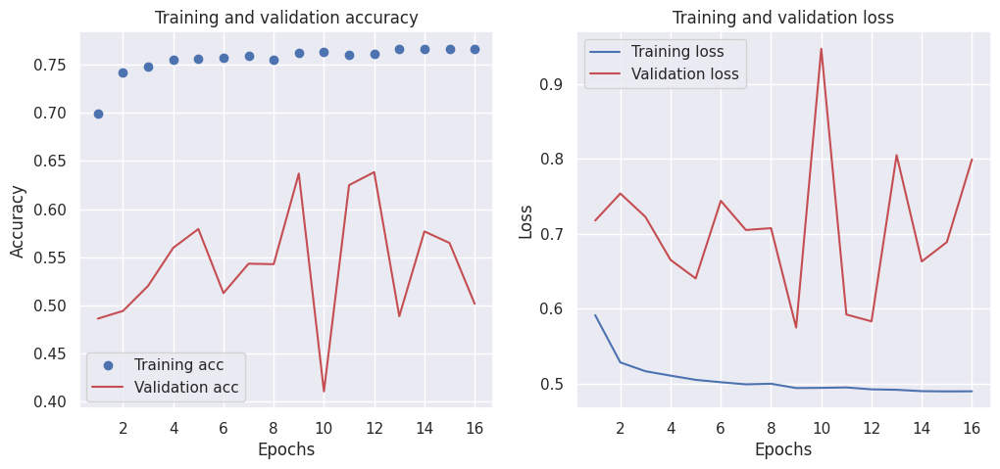

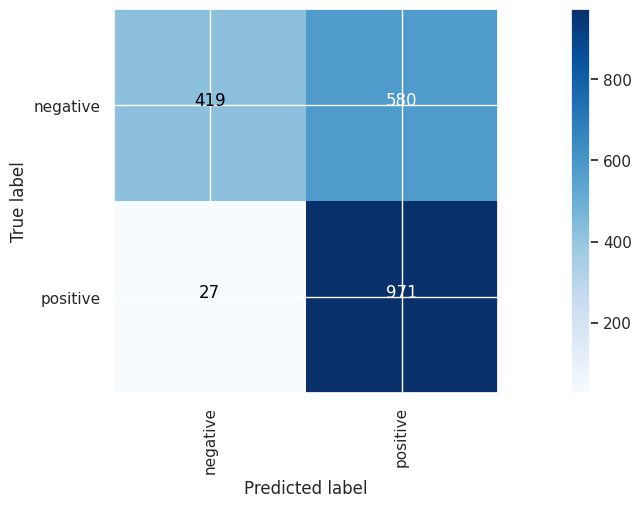

Final Accuracy
0.6960440660991487
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_66 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_101 (Conv1D)         (32, 4997, 256)           1280      
                                                                 
 max_pooling1d_100 (MaxPool  (32, 999, 256)            0         
 ing1D)                                                          
                                                                 
 global_max_pooling1d_64 (G  (32, 256)                 0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_76 (Dense)            (32, 2)                   514       
                                                                 
Total params: 1794 (7.0

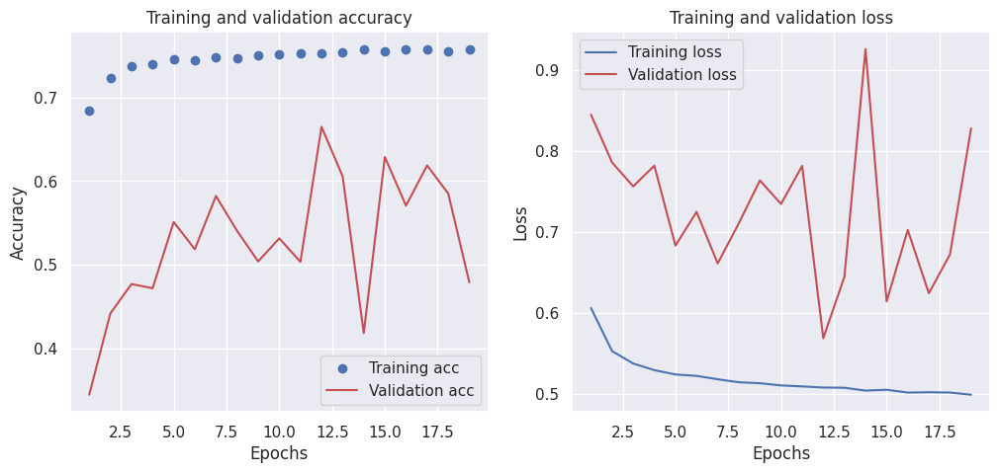

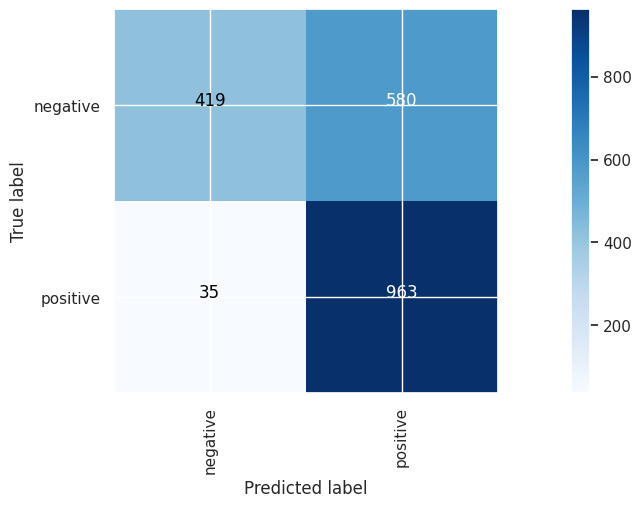

Final Accuracy
0.6920380570856285
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_67 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_102 (Conv1D)         (32, 4997, 256)           1280      
                                                                 
 max_pooling1d_101 (MaxPool  (32, 999, 256)            0         
 ing1D)                                                          
                                                                 
 global_max_pooling1d_65 (G  (32, 256)                 0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_77 (Dense)            (32, 2)                   514       
                                                                 
Total params: 1794 (7.0

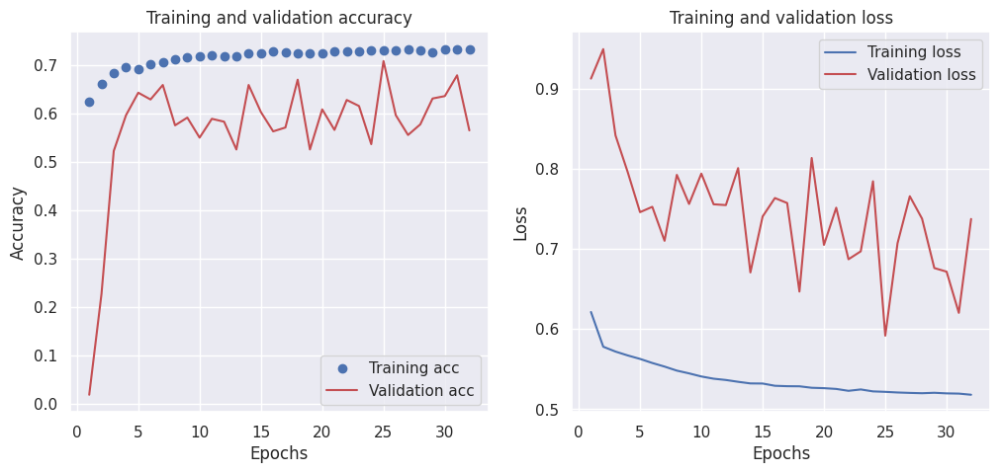

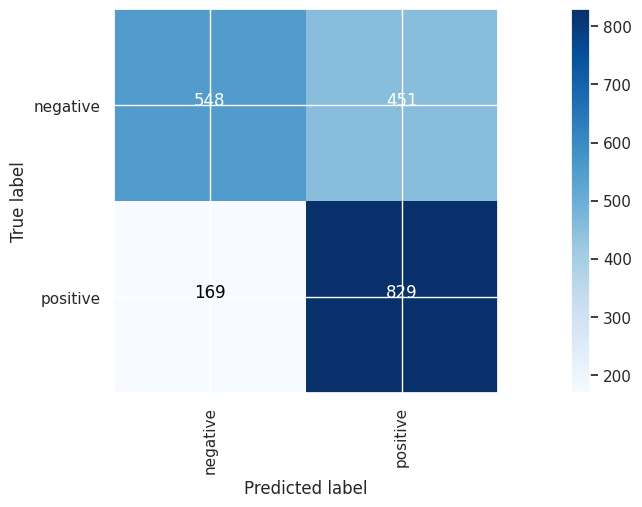

Final Accuracy
0.6895343014521783
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_68 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_103 (Conv1D)         (32, 4997, 256)           1280      
                                                                 
 max_pooling1d_102 (MaxPool  (32, 999, 256)            0         
 ing1D)                                                          
                                                                 
 global_max_pooling1d_66 (G  (32, 256)                 0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_78 (Dense)            (32, 2)                   514       
                                                                 
Total params: 1794 (7.0

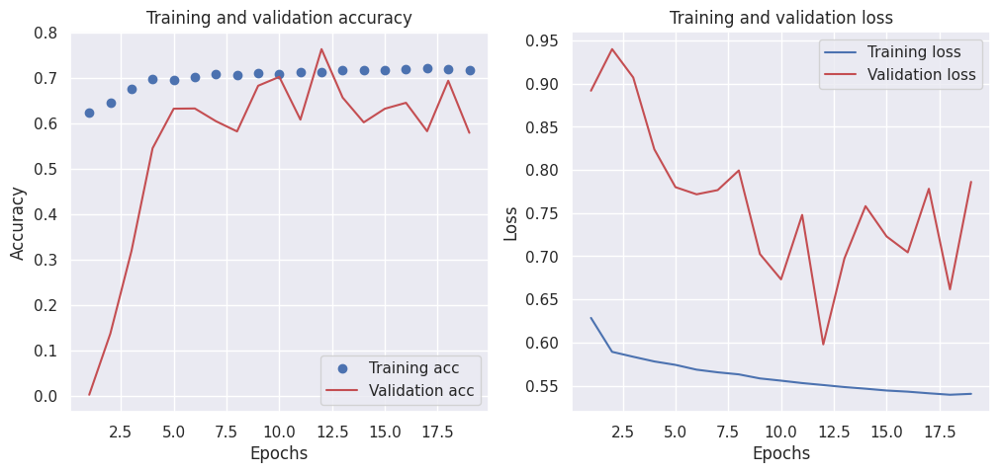

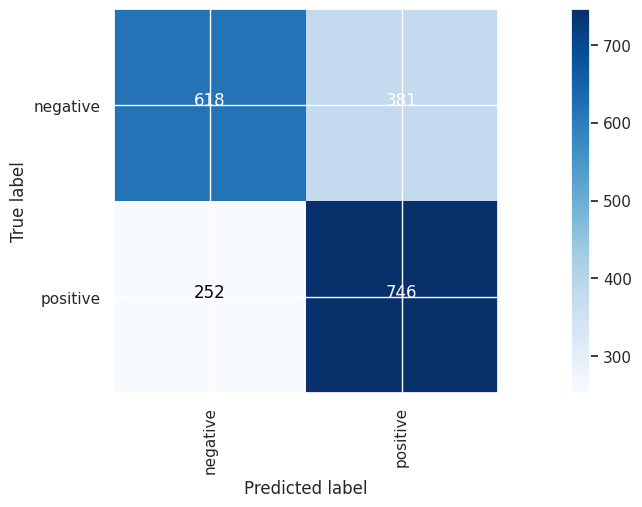

Final Accuracy
0.6830245368052078
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_69 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_20 (Embedding)    (32, 600, 50)             1488650   
                                                                 
 conv1d_104 (Conv1D)         (32, 597, 256)            51456     
                                                                 
 max_pooling1d_103 (MaxPool  (32, 119, 256)            0         
 ing1D)                                                          
                                                                 
 global_max_pooling1d_67 (G  (32, 256)                 0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_79 (Dense)      

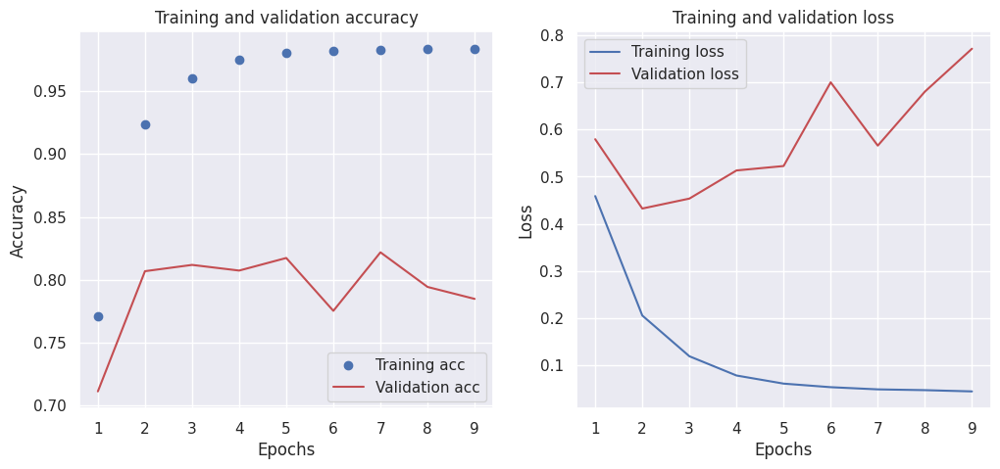

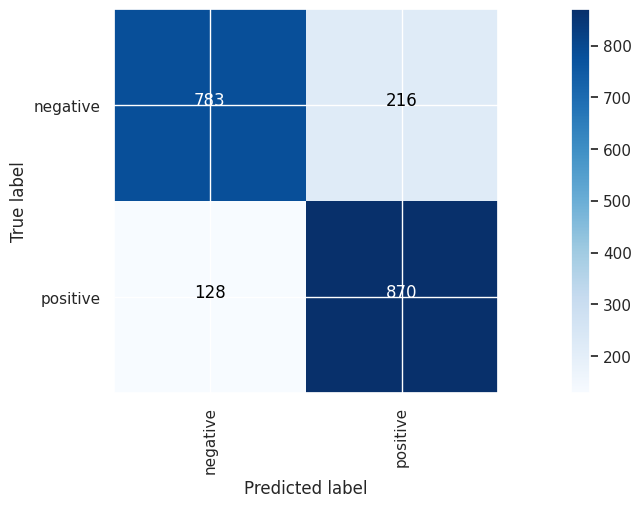

Final Accuracy
0.827741612418628
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_70 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_21 (Embedding)    (32, 600, 50)             1488650   
                                                                 
 conv1d_105 (Conv1D)         (32, 597, 256)            51456     
                                                                 
 max_pooling1d_104 (MaxPool  (32, 119, 256)            0         
 ing1D)                                                          
                                                                 
 global_max_pooling1d_68 (G  (32, 256)                 0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_80 (Dense)       

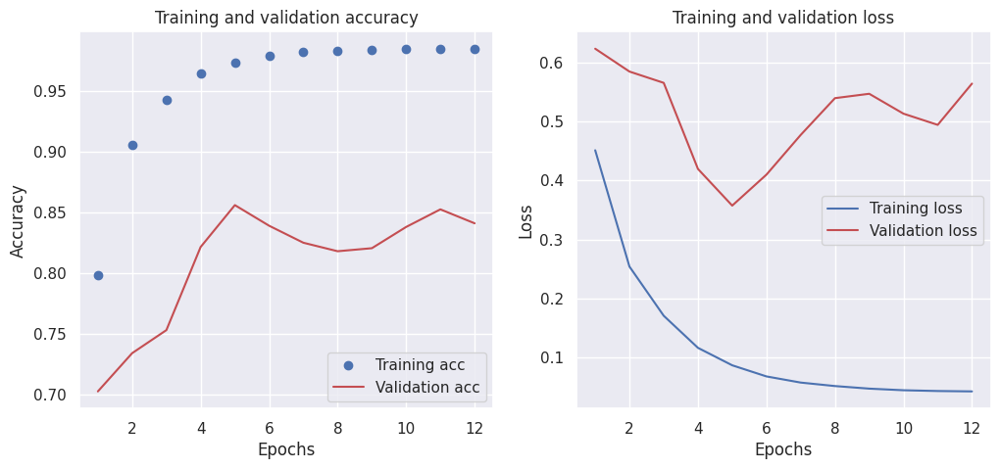

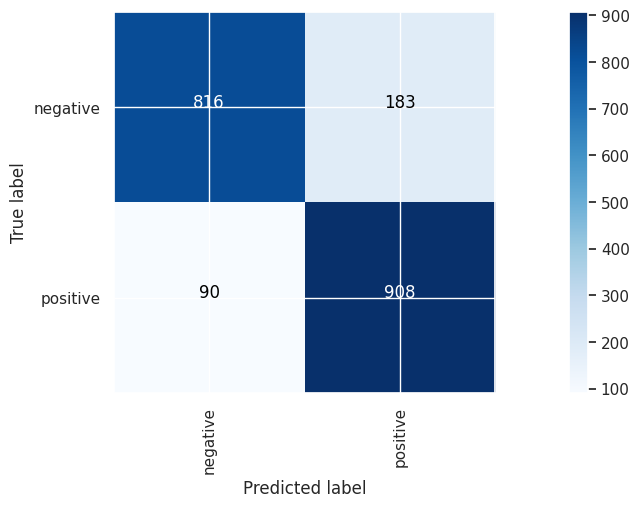

Final Accuracy
0.8632949424136205


In [36]:
# VSM models
results = []
name = "Conv"
description =   """
                number_of_filters=[256], 
                kernel_sizes=[4], 
                pooling_size=5,
                batchnorm=False, 
                general_dropout=0.0, 
                extra_dense_layer_nn=0,  
                extra_dense_dropout=0.0
                """
description = description.replace('\t', '').replace('\n', '').replace(' ', '')

number_of_filters=[256]
kernel_sizes=[4]
pooling_size=5
batchnorm=False
general_dropout=0.0
extra_dense_layer_nn=0
extra_dense_dropout=0.0

# VSM models
results = []
for rep in vsm_model:
    build_exp02(name,
                description, 
                rep, 
                input_shape=(5000,1,),
                number_of_filters=number_of_filters,
                kernel_sizes=kernel_sizes,
                batchnorm=batchnorm,
                general_dropout=general_dropout,
                extra_dense_layer_nn=extra_dense_layer_nn,
                extra_dense_dropout=extra_dense_dropout
                )

# Embedding with padding
embedding = layers.Embedding(input_dim=vocab_size,
                     output_dim=emb_dim,
                     trainable=True,
                     input_length=embedding_padding["train_text_features"].shape[1])
build_exp02(name,
            description, 
            embedding_padding, 
            input_shape=(embedding_padding["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )

# GloVe
embedding = layers.Embedding(num_words,
                     emb_dim,
                     embeddings_initializer=Constant(embedding_glove["embedding_matrix"]),
                     trainable=True,
                     input_length=embedding_glove["train_text_features"].shape[1])

build_exp02(name,
            description, 
            embedding_glove, 
            input_shape=(embedding_glove["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )
partial = pd.DataFrame(results)
partial.to_csv("exp_02_11.csv", index=False)

Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_71 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_106 (Conv1D)         (32, 4997, 256)           1280      
                                                                 
 batch_normalization_48 (Ba  (32, 4997, 256)           1024      
 tchNormalization)                                               
                                                                 
 activation_48 (Activation)  (32, 4997, 256)           0         
                                                                 
 max_pooling1d_105 (MaxPool  (32, 999, 256)            0         
 ing1D)                                                          
                                                                 
 dropout_54 (Dropout)        (32, 999, 256)            0 

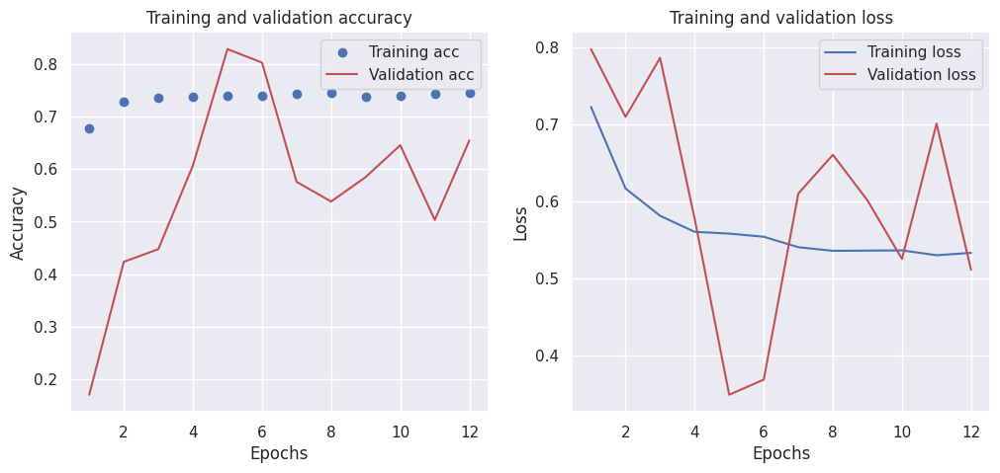

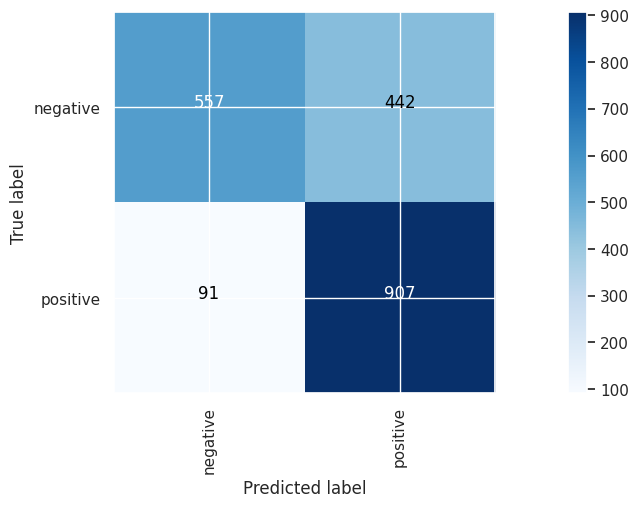

Final Accuracy
0.7330996494742114
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_72 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_107 (Conv1D)         (32, 4997, 256)           1280      
                                                                 
 batch_normalization_49 (Ba  (32, 4997, 256)           1024      
 tchNormalization)                                               
                                                                 
 activation_49 (Activation)  (32, 4997, 256)           0         
                                                                 
 max_pooling1d_106 (MaxPool  (32, 999, 256)            0         
 ing1D)                                                          
                                                                 
 dropout_55 (Dropout)  

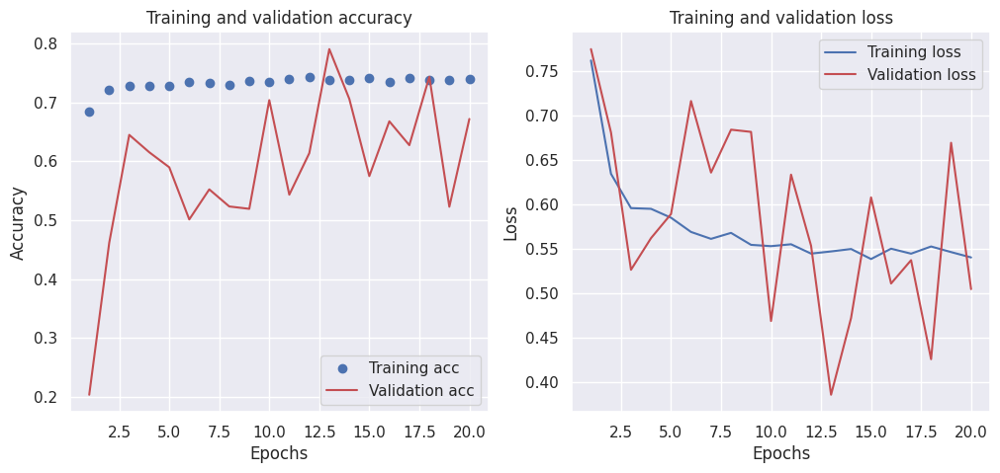

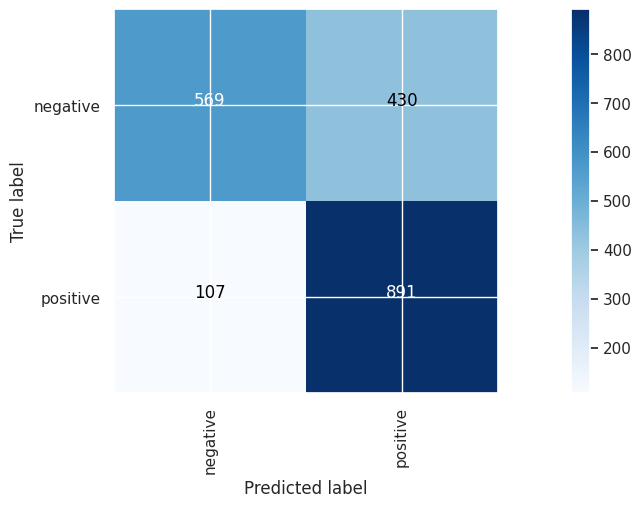

Final Accuracy
0.7310966449674512
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_73 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_108 (Conv1D)         (32, 4997, 256)           1280      
                                                                 
 batch_normalization_50 (Ba  (32, 4997, 256)           1024      
 tchNormalization)                                               
                                                                 
 activation_50 (Activation)  (32, 4997, 256)           0         
                                                                 
 max_pooling1d_107 (MaxPool  (32, 999, 256)            0         
 ing1D)                                                          
                                                                 
 dropout_56 (Dropout)  

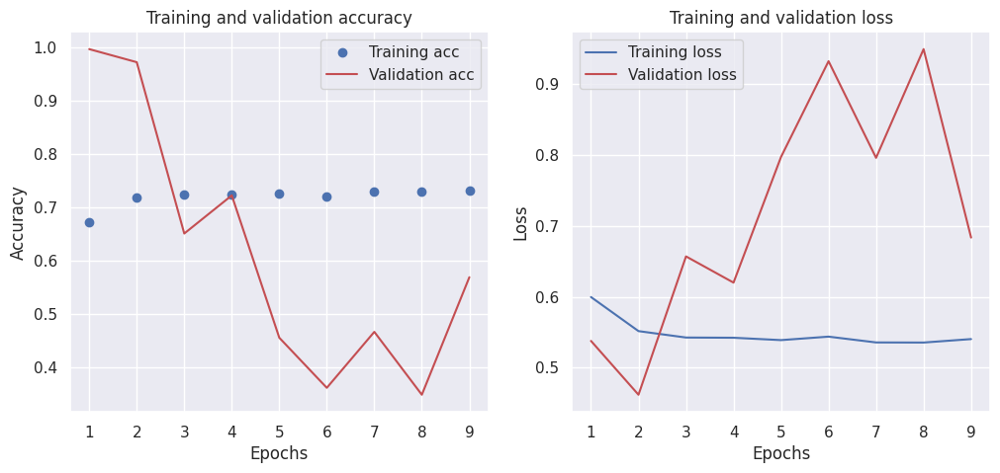

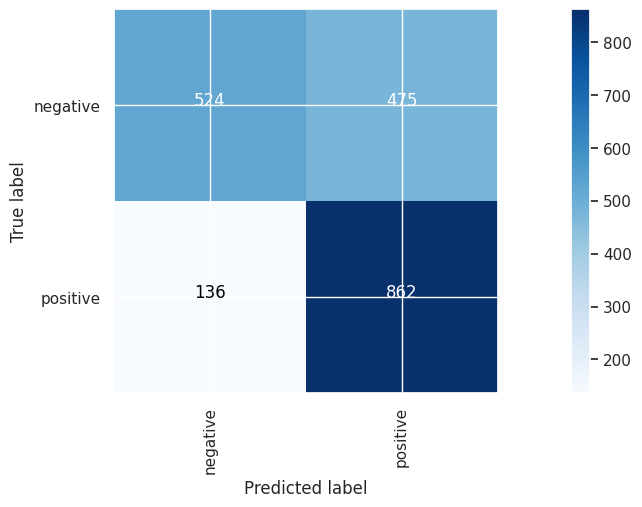

Final Accuracy
0.6940410615923885
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_74 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_109 (Conv1D)         (32, 4997, 256)           1280      
                                                                 
 batch_normalization_51 (Ba  (32, 4997, 256)           1024      
 tchNormalization)                                               
                                                                 
 activation_51 (Activation)  (32, 4997, 256)           0         
                                                                 
 max_pooling1d_108 (MaxPool  (32, 999, 256)            0         
 ing1D)                                                          
                                                                 
 dropout_57 (Dropout)  

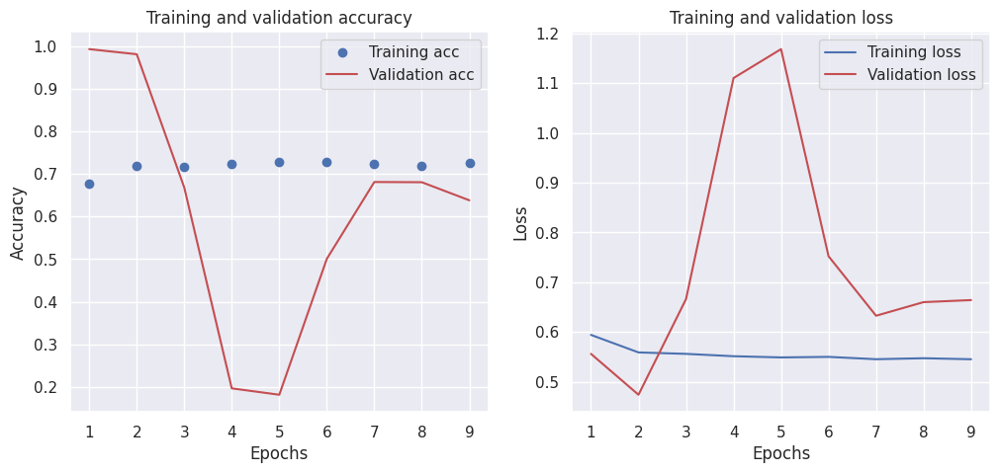

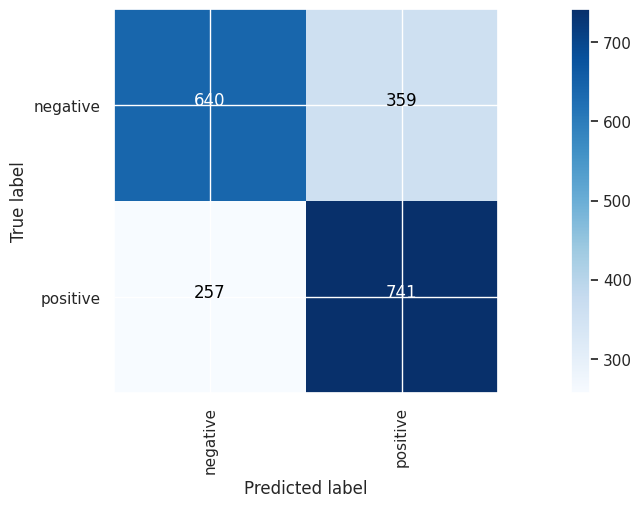

Final Accuracy
0.6915373059589384
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_75 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_22 (Embedding)    (32, 600, 50)             1488650   
                                                                 
 conv1d_110 (Conv1D)         (32, 597, 256)            51456     
                                                                 
 batch_normalization_52 (Ba  (32, 597, 256)            1024      
 tchNormalization)                                               
                                                                 
 activation_52 (Activation)  (32, 597, 256)            0         
                                                                 
 max_pooling1d_109 (MaxPool  (32, 119, 256)            0         
 ing1D)                

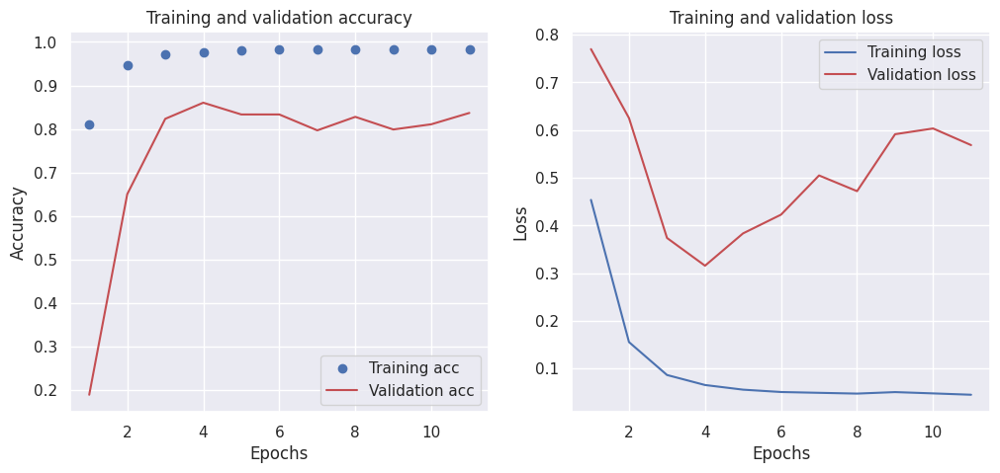

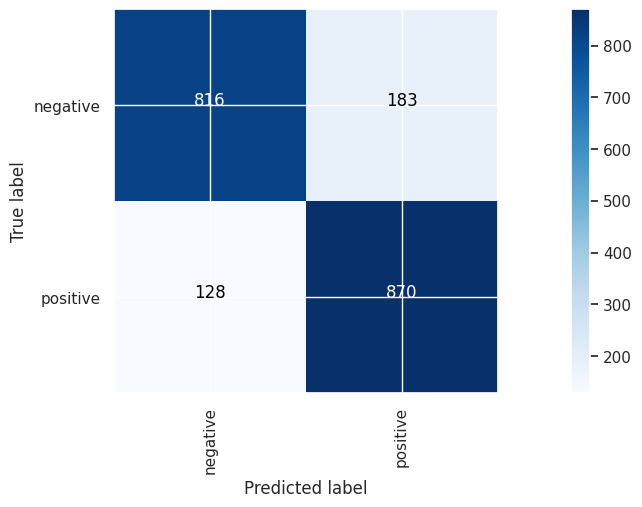

Final Accuracy
0.8442663995993991
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_76 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_23 (Embedding)    (32, 600, 50)             1488650   
                                                                 
 conv1d_111 (Conv1D)         (32, 597, 256)            51456     
                                                                 
 batch_normalization_53 (Ba  (32, 597, 256)            1024      
 tchNormalization)                                               
                                                                 
 activation_53 (Activation)  (32, 597, 256)            0         
                                                                 
 max_pooling1d_110 (MaxPool  (32, 119, 256)            0         
 ing1D)                

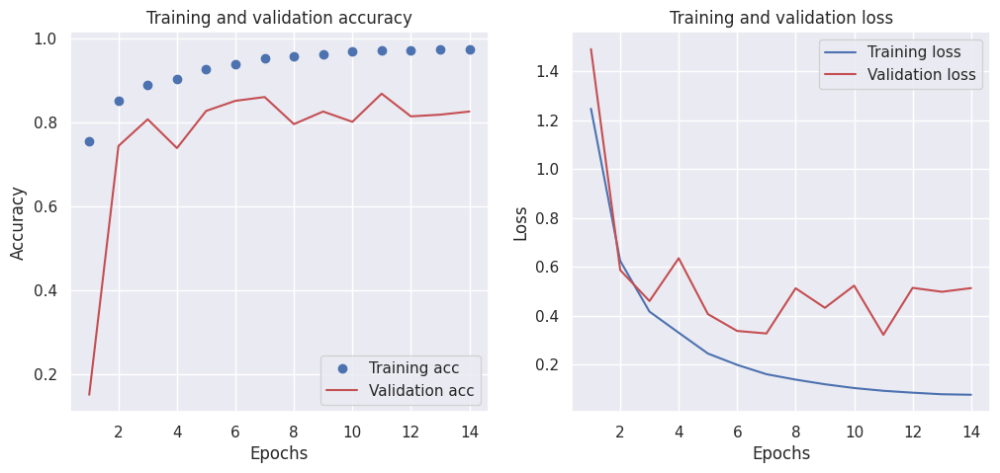

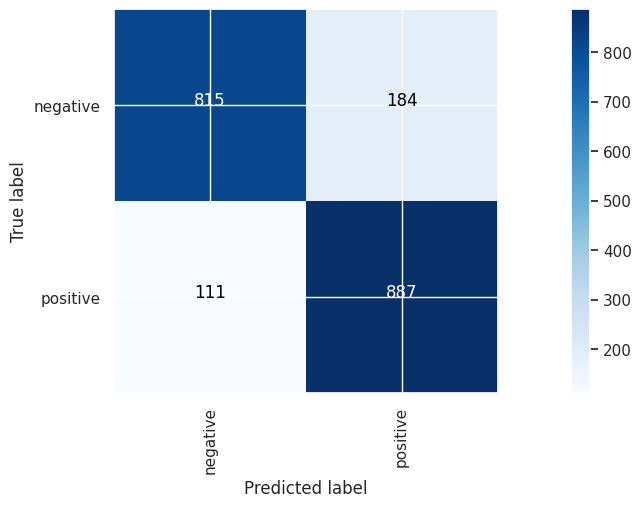

Final Accuracy
0.8522784176264396


In [37]:
# VSM models
results = []
name = "Conv"
description =   """
                number_of_filters=[256], 
                kernel_sizes=[4], 
                pooling_size=5,
                batchnorm=True, 
                general_dropout=0.1, 
                extra_dense_layer_nn=0,  
                extra_dense_dropout=0.0
                """
description = description.replace('\t', '').replace('\n', '').replace(' ', '')

number_of_filters=[256]
kernel_sizes=[4]
pooling_size=5
batchnorm=True
general_dropout=0.1
extra_dense_layer_nn=0
extra_dense_dropout=0.0

# VSM models
results = []
for rep in vsm_model:
    build_exp02(name,
                description, 
                rep, 
                input_shape=(5000,1,),
                number_of_filters=number_of_filters,
                kernel_sizes=kernel_sizes,
                batchnorm=batchnorm,
                general_dropout=general_dropout,
                extra_dense_layer_nn=extra_dense_layer_nn,
                extra_dense_dropout=extra_dense_dropout
                )

# Embedding with padding
embedding = layers.Embedding(input_dim=vocab_size,
                     output_dim=emb_dim,
                     trainable=True,
                     input_length=embedding_padding["train_text_features"].shape[1])
build_exp02(name,
            description, 
            embedding_padding, 
            input_shape=(embedding_padding["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )

# GloVe
embedding = layers.Embedding(num_words,
                     emb_dim,
                     embeddings_initializer=Constant(embedding_glove["embedding_matrix"]),
                     trainable=True,
                     input_length=embedding_glove["train_text_features"].shape[1])

build_exp02(name,
            description, 
            embedding_glove, 
            input_shape=(embedding_glove["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )
partial = pd.DataFrame(results)
partial.to_csv("exp_02_12.csv", index=False)

Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_77 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_112 (Conv1D)         (32, 4997, 128)           640       
                                                                 
 max_pooling1d_111 (MaxPool  (32, 999, 128)            0         
 ing1D)                                                          
                                                                 
 dropout_60 (Dropout)        (32, 999, 128)            0         
                                                                 
 global_max_pooling1d_75 (G  (32, 128)                 0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_87 (Dense)            (32, 2)                   25

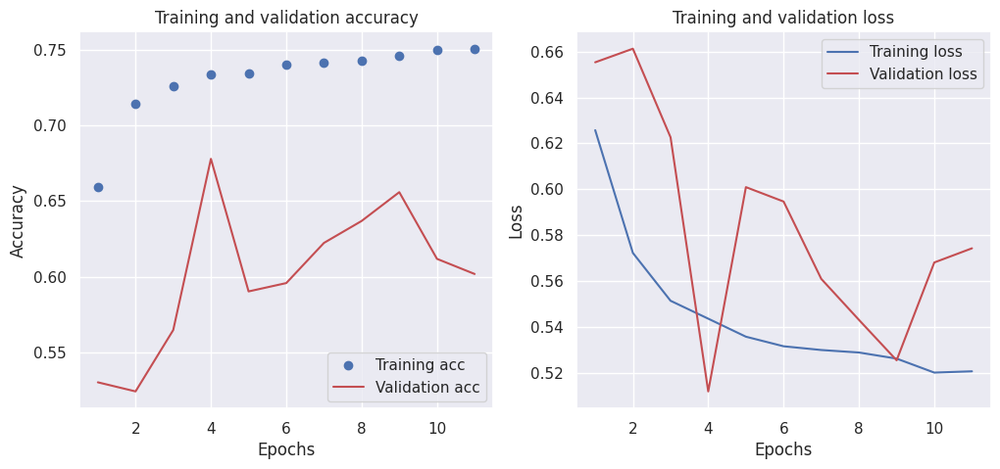

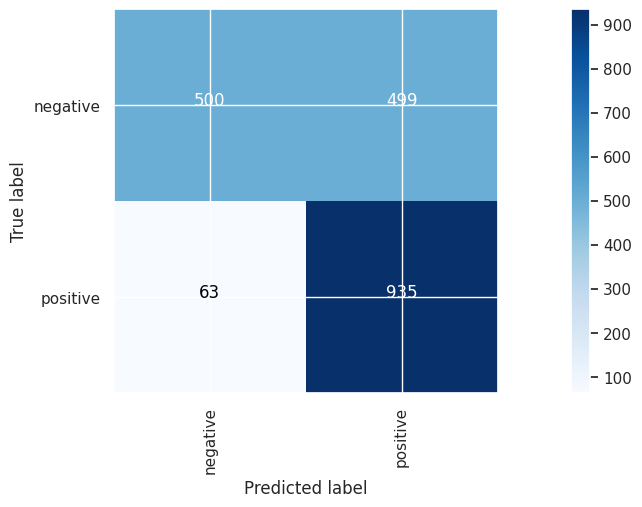

Final Accuracy
0.7185778668002003
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_78 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_113 (Conv1D)         (32, 4997, 128)           640       
                                                                 
 max_pooling1d_112 (MaxPool  (32, 999, 128)            0         
 ing1D)                                                          
                                                                 
 dropout_61 (Dropout)        (32, 999, 128)            0         
                                                                 
 global_max_pooling1d_76 (G  (32, 128)                 0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_88 (Dense)      

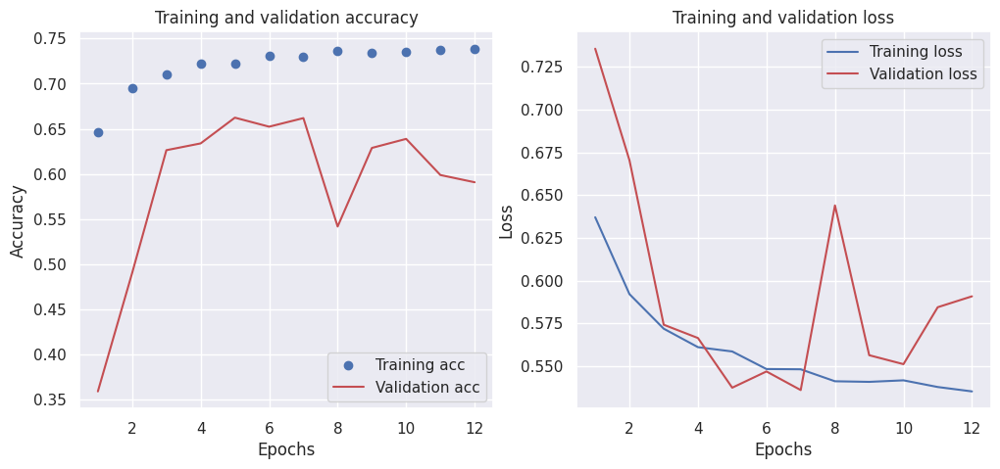

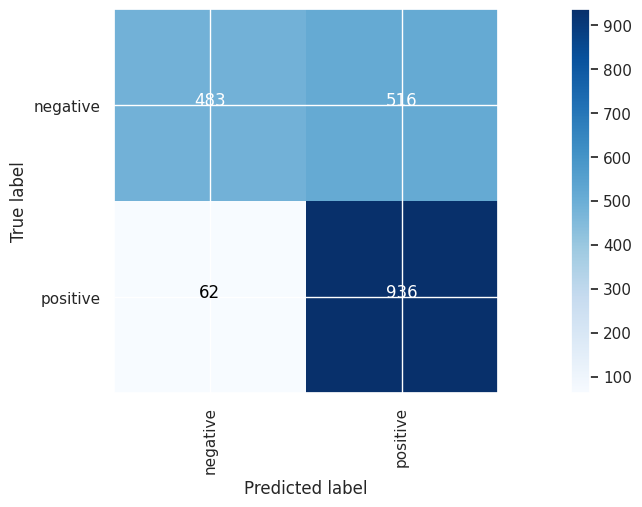

Final Accuracy
0.7105658487731598
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_79 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_114 (Conv1D)         (32, 4997, 128)           640       
                                                                 
 max_pooling1d_113 (MaxPool  (32, 999, 128)            0         
 ing1D)                                                          
                                                                 
 dropout_62 (Dropout)        (32, 999, 128)            0         
                                                                 
 global_max_pooling1d_77 (G  (32, 128)                 0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_89 (Dense)      

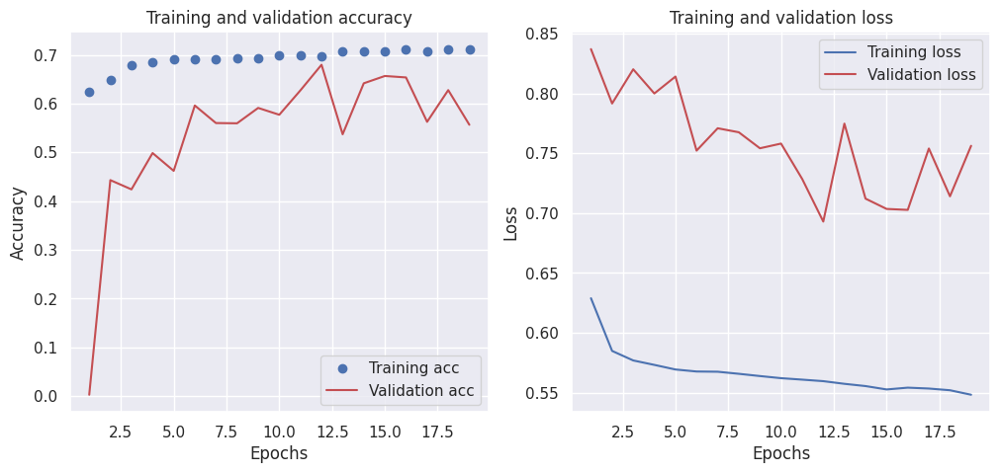

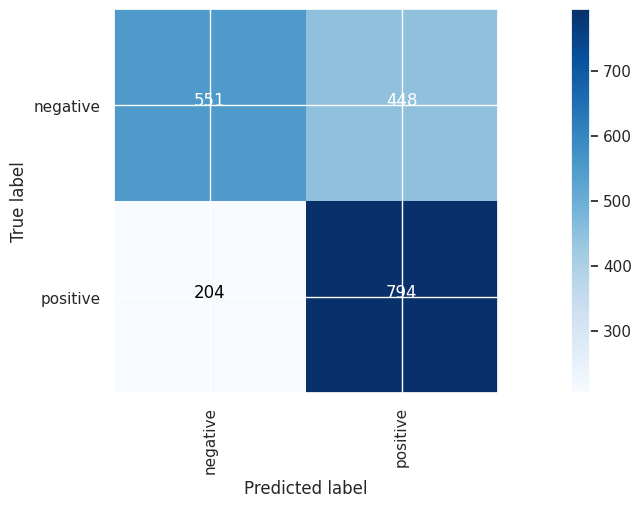

Final Accuracy
0.6735102653980971
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_80 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_115 (Conv1D)         (32, 4997, 128)           640       
                                                                 
 max_pooling1d_114 (MaxPool  (32, 999, 128)            0         
 ing1D)                                                          
                                                                 
 dropout_63 (Dropout)        (32, 999, 128)            0         
                                                                 
 global_max_pooling1d_78 (G  (32, 128)                 0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_90 (Dense)      

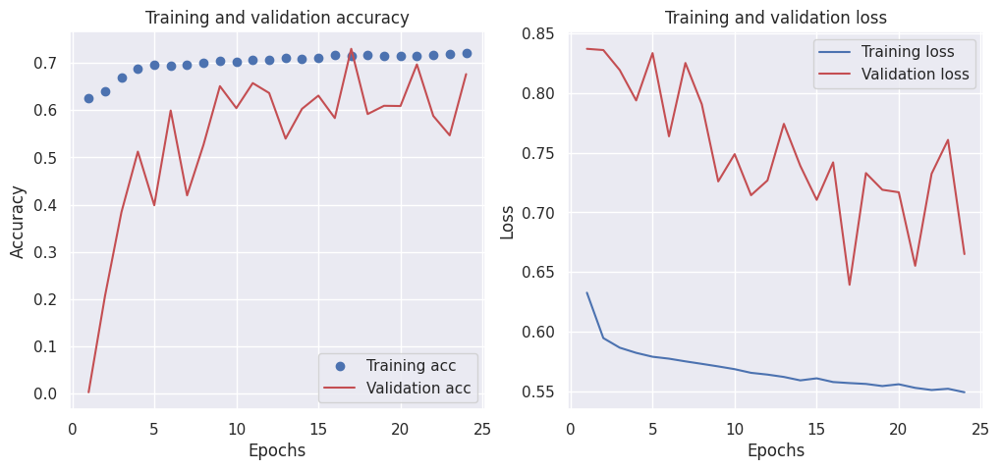

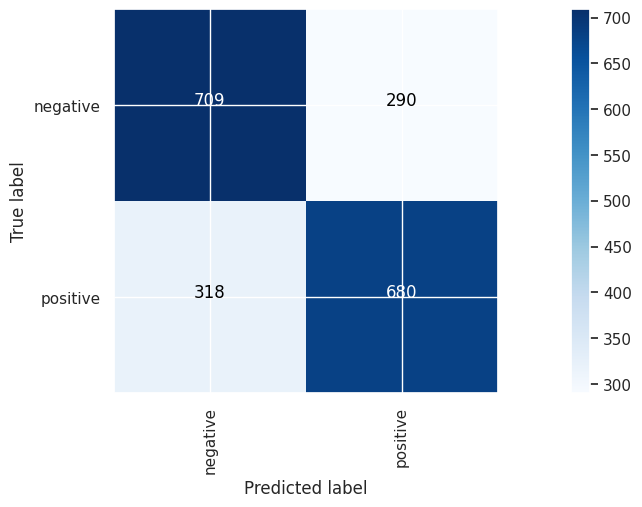

Final Accuracy
0.6955433149724587
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_81 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_24 (Embedding)    (32, 600, 50)             1488650   
                                                                 
 conv1d_116 (Conv1D)         (32, 597, 128)            25728     
                                                                 
 max_pooling1d_115 (MaxPool  (32, 119, 128)            0         
 ing1D)                                                          
                                                                 
 dropout_64 (Dropout)        (32, 119, 128)            0         
                                                                 
 global_max_pooling1d_79 (G  (32, 128)                 0         
 lobalMaxPooling1D)    

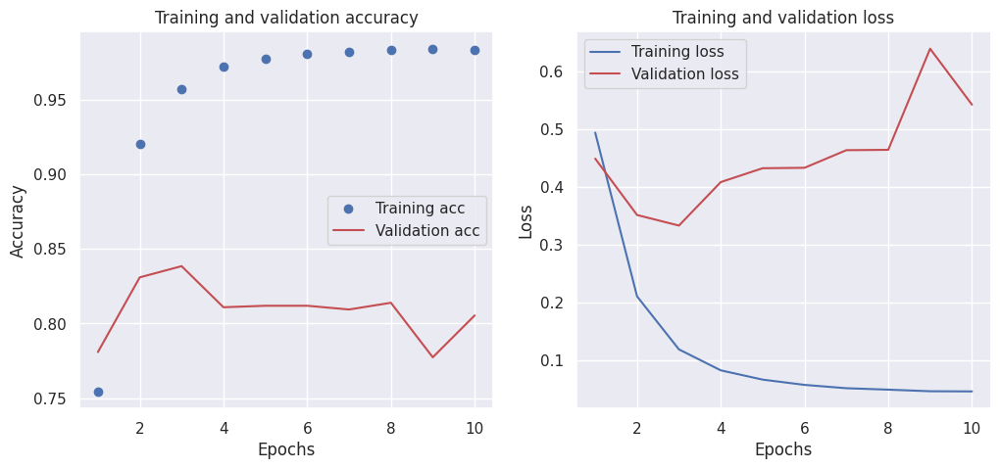

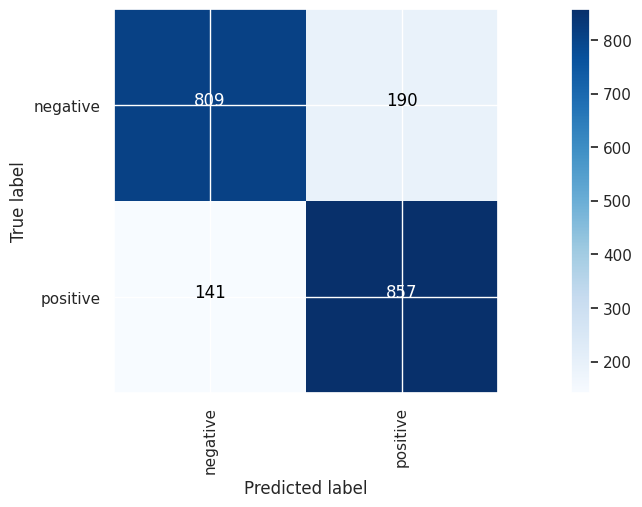

Final Accuracy
0.8342513770655984
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_82 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_25 (Embedding)    (32, 600, 50)             1488650   
                                                                 
 conv1d_117 (Conv1D)         (32, 597, 128)            25728     
                                                                 
 max_pooling1d_116 (MaxPool  (32, 119, 128)            0         
 ing1D)                                                          
                                                                 
 dropout_65 (Dropout)        (32, 119, 128)            0         
                                                                 
 global_max_pooling1d_80 (G  (32, 128)                 0         
 lobalMaxPooling1D)    

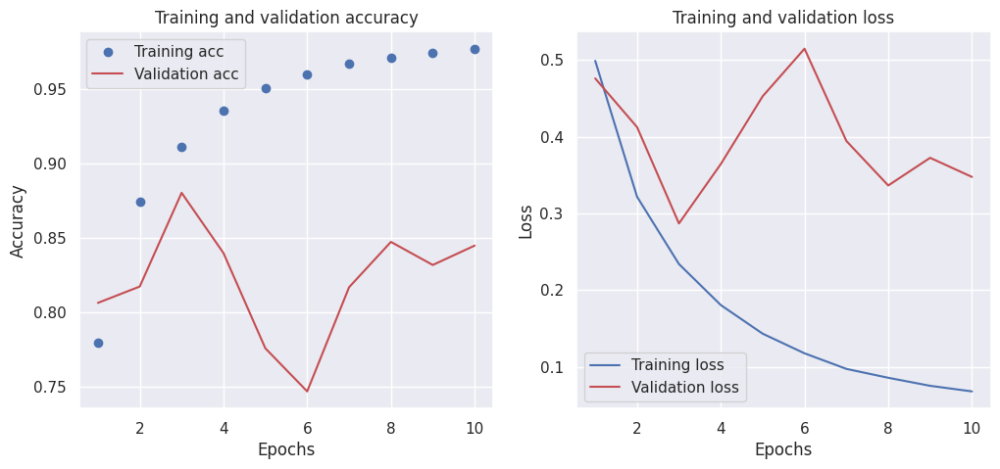

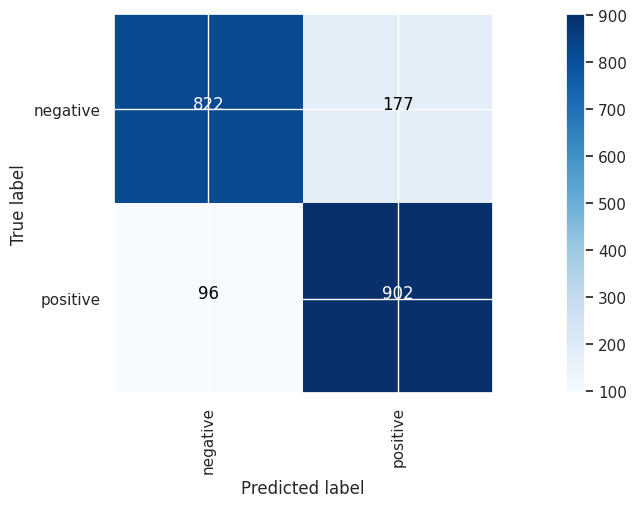

Final Accuracy
0.8632949424136205


In [38]:
# VSM models
results = []
name = "Conv"
description =   """
                number_of_filters=[128], 
                kernel_sizes=[4], 
                pooling_size=5,
                batchnorm=False, 
                general_dropout=0.1, 
                extra_dense_layer_nn=0,  
                extra_dense_dropout=0.0
                """
description = description.replace('\t', '').replace('\n', '').replace(' ', '')

number_of_filters=[128]
kernel_sizes=[4]
pooling_size=5
batchnorm=False
general_dropout=0.1
extra_dense_layer_nn=0
extra_dense_dropout=0.0

# VSM models
results = []
for rep in vsm_model:
    build_exp02(name,
                description, 
                rep, 
                input_shape=(5000,1,),
                number_of_filters=number_of_filters,
                kernel_sizes=kernel_sizes,
                batchnorm=batchnorm,
                general_dropout=general_dropout,
                extra_dense_layer_nn=extra_dense_layer_nn,
                extra_dense_dropout=extra_dense_dropout
                )

# Embedding with padding
embedding = layers.Embedding(input_dim=vocab_size,
                     output_dim=emb_dim,
                     trainable=True,
                     input_length=embedding_padding["train_text_features"].shape[1])
build_exp02(name,
            description, 
            embedding_padding, 
            input_shape=(embedding_padding["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )

# GloVe
embedding = layers.Embedding(num_words,
                     emb_dim,
                     embeddings_initializer=Constant(embedding_glove["embedding_matrix"]),
                     trainable=True,
                     input_length=embedding_glove["train_text_features"].shape[1])

build_exp02(name,
            description, 
            embedding_glove, 
            input_shape=(embedding_glove["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )
partial = pd.DataFrame(results)
partial.to_csv("exp_02_13.csv", index=False)

Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_83 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_118 (Conv1D)         (32, 4997, 128)           640       
                                                                 
 max_pooling1d_117 (MaxPool  (32, 999, 128)            0         
 ing1D)                                                          
                                                                 
 dropout_66 (Dropout)        (32, 999, 128)            0         
                                                                 
 global_max_pooling1d_81 (G  (32, 128)                 0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_93 (Dense)            (32, 2)                   25

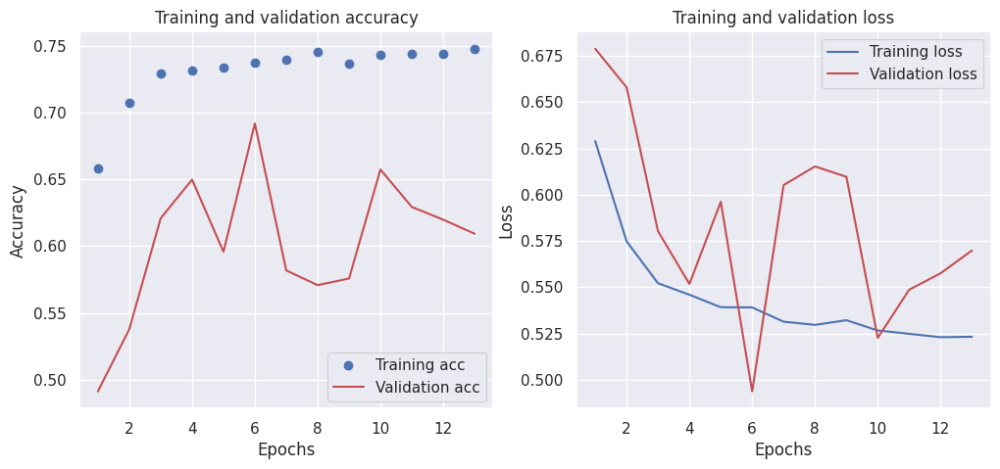

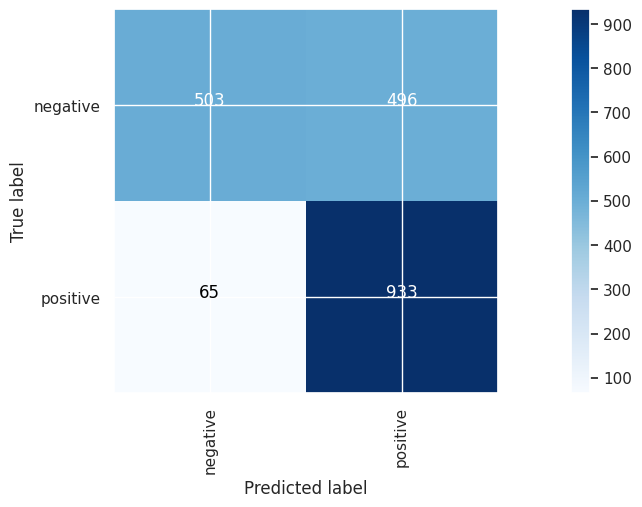

Final Accuracy
0.7190786179268903
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_84 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_119 (Conv1D)         (32, 4997, 128)           640       
                                                                 
 max_pooling1d_118 (MaxPool  (32, 999, 128)            0         
 ing1D)                                                          
                                                                 
 dropout_67 (Dropout)        (32, 999, 128)            0         
                                                                 
 global_max_pooling1d_82 (G  (32, 128)                 0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_94 (Dense)      

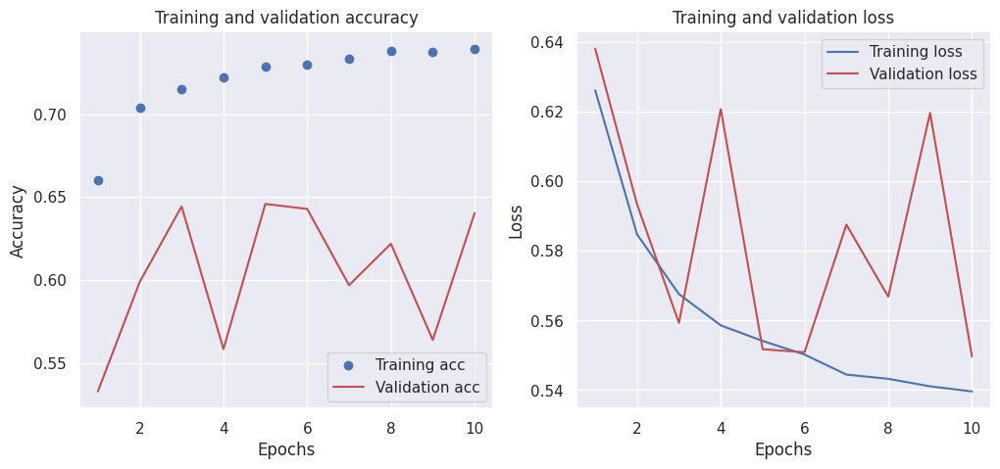

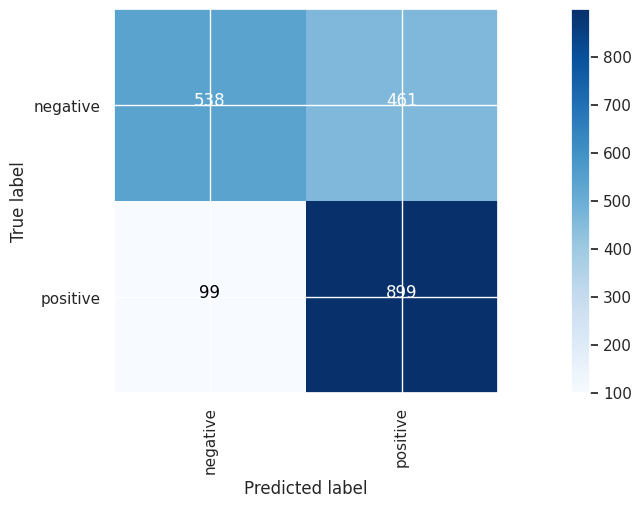

Final Accuracy
0.7195793690535803
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_85 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_120 (Conv1D)         (32, 4997, 128)           640       
                                                                 
 max_pooling1d_119 (MaxPool  (32, 999, 128)            0         
 ing1D)                                                          
                                                                 
 dropout_68 (Dropout)        (32, 999, 128)            0         
                                                                 
 global_max_pooling1d_83 (G  (32, 128)                 0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_95 (Dense)      

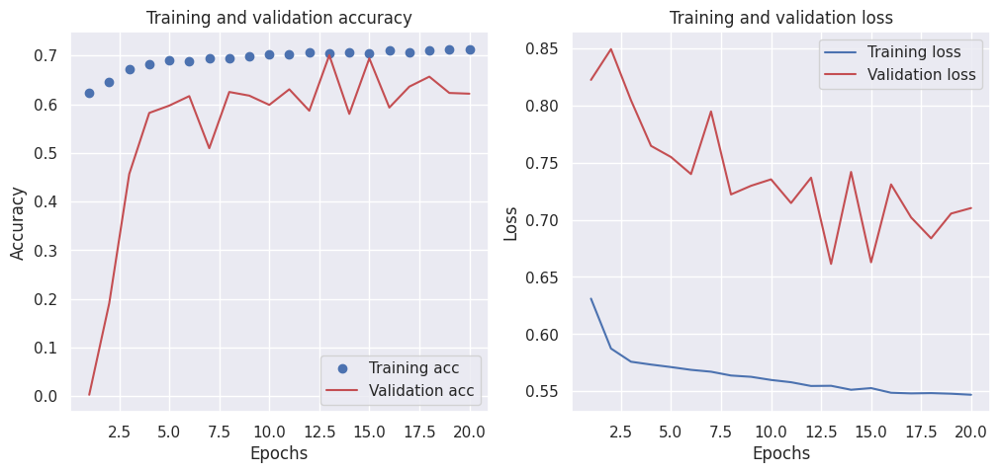

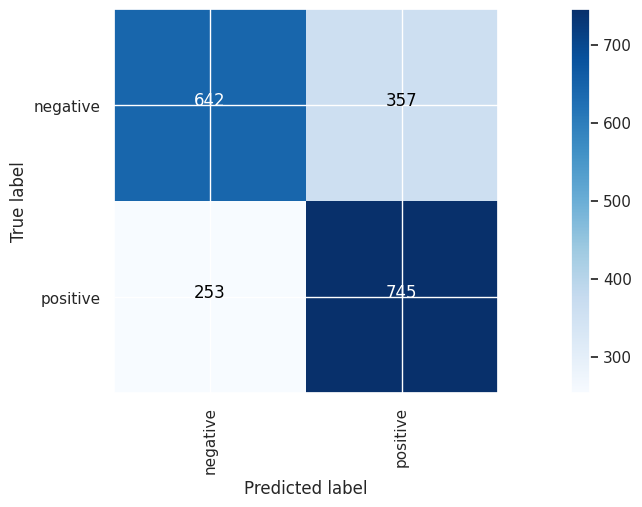

Final Accuracy
0.6945418127190787
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_86 (InputLayer)       [(32, 5000, 1)]           0         
                                                                 
 conv1d_121 (Conv1D)         (32, 4997, 128)           640       
                                                                 
 max_pooling1d_120 (MaxPool  (32, 999, 128)            0         
 ing1D)                                                          
                                                                 
 dropout_69 (Dropout)        (32, 999, 128)            0         
                                                                 
 global_max_pooling1d_84 (G  (32, 128)                 0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_96 (Dense)      

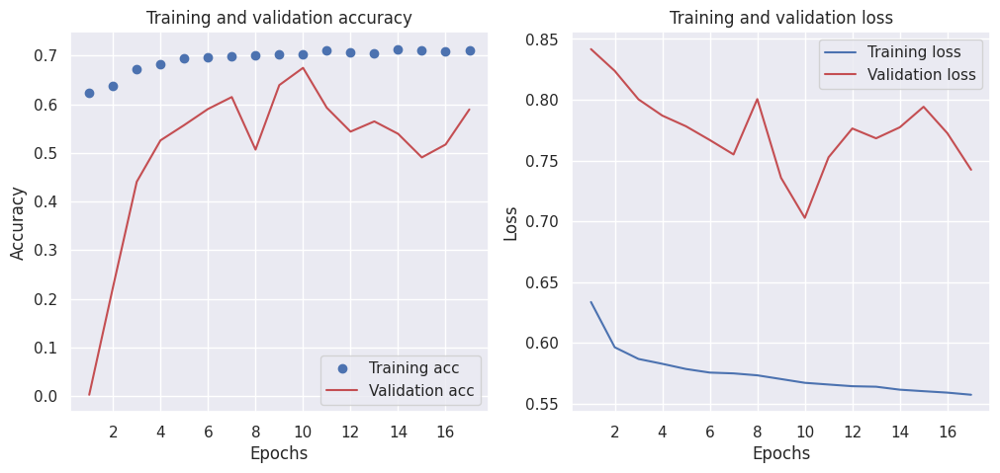

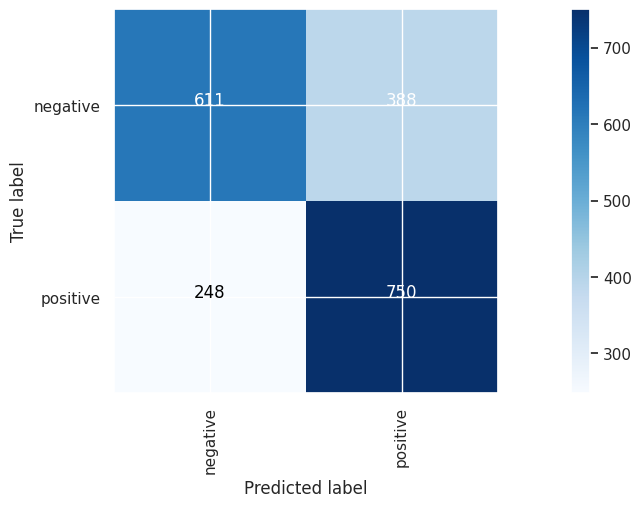

Final Accuracy
0.6815222834251377
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_87 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_26 (Embedding)    (32, 600, 50)             1488650   
                                                                 
 conv1d_122 (Conv1D)         (32, 597, 128)            25728     
                                                                 
 max_pooling1d_121 (MaxPool  (32, 119, 128)            0         
 ing1D)                                                          
                                                                 
 dropout_70 (Dropout)        (32, 119, 128)            0         
                                                                 
 global_max_pooling1d_85 (G  (32, 128)                 0         
 lobalMaxPooling1D)    

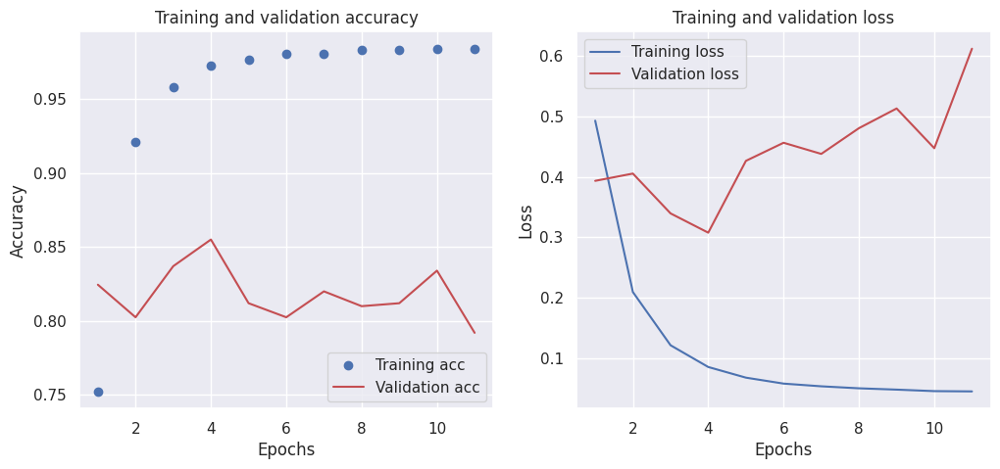

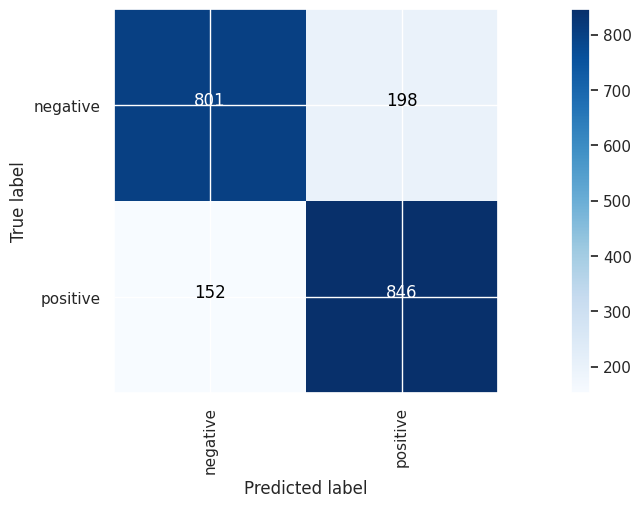

Final Accuracy
0.8247371056584877
Model: "Exp02Conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_88 (InputLayer)       [(32, 600)]               0         
                                                                 
 embedding_27 (Embedding)    (32, 600, 50)             1488650   
                                                                 
 conv1d_123 (Conv1D)         (32, 597, 128)            25728     
                                                                 
 max_pooling1d_122 (MaxPool  (32, 119, 128)            0         
 ing1D)                                                          
                                                                 
 dropout_71 (Dropout)        (32, 119, 128)            0         
                                                                 
 global_max_pooling1d_86 (G  (32, 128)                 0         
 lobalMaxPooling1D)    

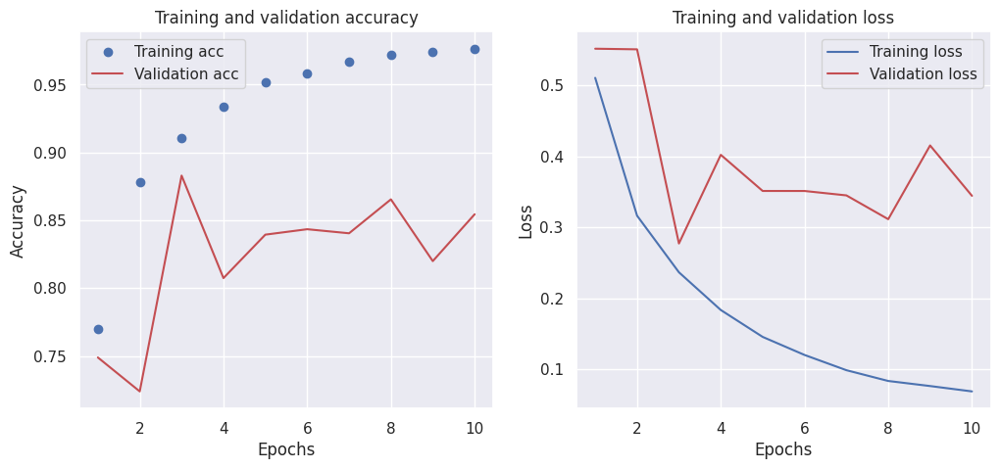

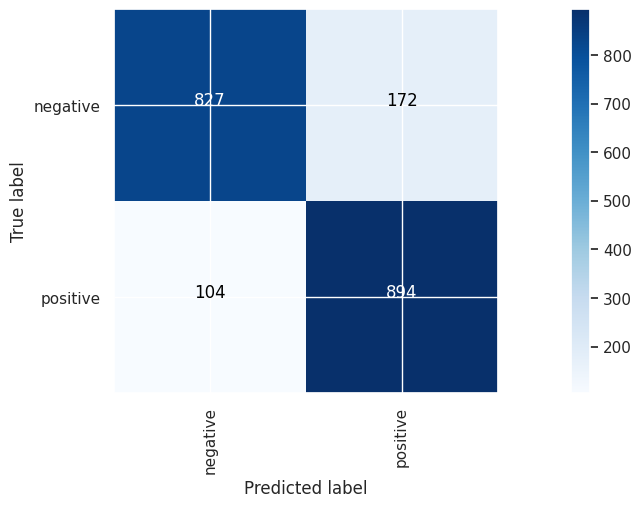

Final Accuracy
0.8617926890335503


In [39]:
# VSM models
results = []
name = "Conv"
description =   """
                number_of_filters=[128], 
                kernel_sizes=[4], 
                pooling_size=5,
                batchnorm=False, 
                general_dropout=0.2, 
                extra_dense_layer_nn=0,  
                extra_dense_dropout=0.0
                """
description = description.replace('\t', '').replace('\n', '').replace(' ', '')

number_of_filters=[128]
kernel_sizes=[4]
pooling_size=5
batchnorm=False
general_dropout=0.2
extra_dense_layer_nn=0
extra_dense_dropout=0.0

# VSM models
results = []
for rep in vsm_model:
    build_exp02(name,
                description, 
                rep, 
                input_shape=(5000,1,),
                number_of_filters=number_of_filters,
                kernel_sizes=kernel_sizes,
                batchnorm=batchnorm,
                general_dropout=general_dropout,
                extra_dense_layer_nn=extra_dense_layer_nn,
                extra_dense_dropout=extra_dense_dropout
                )

# Embedding with padding
embedding = layers.Embedding(input_dim=vocab_size,
                     output_dim=emb_dim,
                     trainable=True,
                     input_length=embedding_padding["train_text_features"].shape[1])
build_exp02(name,
            description, 
            embedding_padding, 
            input_shape=(embedding_padding["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )

# GloVe
embedding = layers.Embedding(num_words,
                     emb_dim,
                     embeddings_initializer=Constant(embedding_glove["embedding_matrix"]),
                     trainable=True,
                     input_length=embedding_glove["train_text_features"].shape[1])

build_exp02(name,
            description, 
            embedding_glove, 
            input_shape=(embedding_glove["train_text_features"].shape[1],),
            embedding=embedding,
            number_of_filters=number_of_filters,
            kernel_sizes=kernel_sizes,
            batchnorm=batchnorm,
            general_dropout=general_dropout,
            extra_dense_layer_nn=extra_dense_layer_nn,
            extra_dense_dropout=extra_dense_dropout            
            )
partial = pd.DataFrame(results)
partial.to_csv("exp_02_14.csv", index=False)

## Conclusiones

In [40]:
join_csv_for_experiment("02", 14)
pd.read_csv("exp_02.csv").sort_values(by=["accuracy"], ascending=False, ignore_index=True)[["classifier", "rep.model", "accuracy"]]

,classifier,rep.model,accuracy
0,"Exp02Conv number_of_filters=[128],kernel_sizes=[4],pooling_size=5,batchnorm=False,general_dropout=0.1,extra_dense_layer_nn=0,extra_dense_dropout=0.0",Word embedding with GloVe,0.863295
1,"Exp02Conv number_of_filters=[256],kernel_sizes=[4],pooling_size=5,batchnorm=False,general_dropout=0.0,extra_dense_layer_nn=0,extra_dense_dropout=0.0",Word embedding with GloVe,0.863295
2,"Exp02Conv number_of_filters=[128],kernel_sizes=[4],pooling_size=5,batchnorm=False,general_dropout=0.2,extra_dense_layer_nn=0,extra_dense_dropout=0.0",Word embedding with GloVe,0.861793
3,"Exp02Conv number_of_filters=[128],kernel_sizes=[4],pooling_size=5,batchnorm=False,general_dropout=0.5,extra_dense_layer_nn=0,extra_dense_dropout=0.0",Word embedding with GloVe,0.860290
4,"Exp02Conv number_of_filters=[128],kernel_sizes=[4],pooling_size=5,batchnorm=True,general_dropout=0.5,extra_dense_layer_nn=0,extra_dense_dropout=0.0",Word embedding with GloVe,0.856284
...,...,...,...
79,"Exp02Conv number_of_filters=[128],kernel_sizes=[4],pooling_size=5,batchnorm=True,general_dropout=0.5,extra_dense_layer_nn=0,extra_dense_dropout=0.0",VSM + pesado TF-IDF + rango de n-grams [1 y 2] + redimensionamiento por SVD (LSI),0.675013
80,"Exp02Conv number_of_filters=[128],kernel_sizes=[4],pooling_size=5,batchnorm=False,general_dropout=0.1,extra_dense_layer_nn=0,extra_dense_dropout=0.0",VSM + pesado TF-IDF + redimensionamiento por SVD (LSI),0.673510
81,"Exp02Conv number_of_filters=[128],kernel_sizes=[4],pooling_size=5,batchnorm=True,general_dropout=0.5,extra_dense_layer_nn=0,extra_dense_dropout=0.0",VSM + pesado TF-IDF + rango de n-grams [1 y 2] + redimensionamiento por SVD (LSI),0.644967
82,"Exp02Conv number_of_filters=[128],kernel_sizes=[4],pooling_size=5,batchnorm=True,general_dropout=0.5,extra_dense_layer_nn=64,extra_dense_dropout=0.5",VSM + pesado binario + rango de n-grams [1 y 2] + redimensionamiento por SVD (LSI),0.643465
